In [2]:
# Collect all previous garbage and limit the GPU devices
import os
import gc
os.environ["CUDA_VISIBLE_DEVICES"] = "0,1"
collected = gc.collect()
print(f"Garbage objects collected: {collected}")

Garbage objects collected: 0


In [ ]:
import math
import gymnasium as gym  
from gymnasium import spaces
from typing import Optional, List, Sequence, Deque, Tuple, Any, Dict
from stable_baselines3.common.env_checker import check_env
import numpy as np
import time
import pandas as pd
import hashlib
import random
import geopandas as gpd
from shapely import geometry
from shapely.geometry import LineString, Point
from utils import *
from langchain_openai import ChatOpenAI
import glob
import re, json
import copy
from datetime import datetime, timezone
import torch
import torch.nn as nn
from torch.distributions import Categorical
from torch.utils.tensorboard import SummaryWriter
from dataclasses import dataclass  
from types import SimpleNamespace                       
import shutil
from dotenv import load_dotenv, find_dotenv 
import ollama
from collections import deque
import traceback
from tensorboardX import SummaryWriter
from haversine import haversine, Unit
import warnings

# Load the autoreload extension, which watches imports for changes
%load_ext autoreload 
# Automatically reload any module when its source file changes
%autoreload 2 
pd.set_option('display.max_columns', 100)

# Suppress all warning messages to keep output clean
warnings.filterwarnings('ignore') 
# Enable TensorBoard magic for live RL training metrics
%load_ext tensorboard

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
torch.manual_seed(0)
if device.type == 'cuda':
    torch.cuda.manual_seed_all(0)
    torch.backends.cudnn.benchmark = True
print(f"Using device: {device}")


Using device: cuda


In [5]:
featurefile = pd.read_csv('featurefile_transformed_2.csv')
featurefile.head()

,Unnamed: 0,filenames,resolvedflight,flightstarttime_original_res,original_resstart_lat,original_resstart_lon,original_resend_lat,distfrombound_TCP,original_resend_lon,resflight_offset,flightstarttime_original_unres,original_unresstart_lat,original_unresstart_lon,original_unresend_lat,original_unresend_lon,unresflight_offset,initialhead_resolved,initialhead_unresolved,conflict_angle,mantoconflict_dunres,mantoconflict_dres,tcp_direction,unrsolvedflight_dirn,d_bound_manstart,d_bound_CPA,neighbouring_ac,meandistance,timetoresolution,d_resstart_CPA,headingAngle,crosstrack_dist_max,mergewp_name,mergept_TCPdist,resolved_ac,manstrt_time,manstrt_res_lon,mansrtr_res_lat,resflight_CPA_lon,resflight_CPA_lat,unresflight_CPA_lon,unresflight_CPA_lat,maxcrosstrack_time,maxcrosstrack_lon,maxcrosstrack_lat,mergept_time,mergept_lon,mergept_lat,CPA_orig_maneuvered,original_resstart_lat_T,original_resend_lat_T,original_unresstart_lat_T,original_unresend_lat_T,manstart_res_lat_T,maxcrosstrack_lat_T,original_resstart_lon_T,original_resend_lon_T,original_unresstart_lon_T,original_unresend_lon_T,manstart_res_lon_T,maxcrosstrack_lon_T,NAME,LAT,LON,lon_T,lat_T
0,0,170321set1_1_KL01.csv_1_3K00.csv,170321set1_1_KL01.csv,14:00:40,4.57262,106.403,2.50410,19.14,106.548,22,14:02:30,3.72198,107.306,1.60220,103.998,0,170,249,79.82,44.747429,48.740609,-1,-1,4.53,30.28,0,0.00,6.17,46,160,6.13,OMLIV,38.60,farther,14:04:30,106.245,4.14306,106.382,3.38520,106.382,3.38520,14:09:15,106.450,3.57772,14:14:20,106.469,2.93461,6.77,89.3155,37.60250,68.0495,15.05500,78.57650,64.44300,68.06,70.96,86.12,19.96,64.90,69.00,ONAPO,3.353889,106.387778,67.755556,58.847222
1,1,170321set1_1_SQ20.csv_1_QR21.csv,170321set1_1_SQ20.csv,14:14:40,3.72198,107.306,1.60220,21.03,103.998,77,14:21:05,2.52356,106.535,3.18297,104.142,0,249,286,36.36,59.616039,63.374070,-1,-1,37.54,19.74,1,92.54,8.08,61,210,13.65,WP071,78.58,farther,14:24:20,106.169,3.26591,105.220,2.90634,105.220,2.90634,14:27:25,105.955,2.94447,14:37:45,104.670,2.69183,11.12,68.0495,15.05500,38.0890,54.57425,56.64775,48.61175,86.12,19.96,70.70,22.84,63.38,59.10,LIPRO,2.895000,105.190833,43.816667,47.375000
2,2,170321set1_1_QR31.csv_1_3K30.csv,170321set1_1_QR31.csv,14:21:55,3.72198,107.306,3.40823,21.62,103.908,37,14:25:00,4.57262,106.403,2.56699,104.093,0,267,231,36.20,43.565178,49.890922,1,1,36.23,24.73,3,57.40,6.08,46,330,12.32,VISAT,79.24,farther,14:32:15,106.029,3.51914,105.269,3.47690,105.269,3.47690,14:34:30,105.837,3.71123,14:44:55,104.544,3.44267,15.09,68.0495,60.20575,89.3155,39.17475,62.97850,67.78075,86.12,18.16,68.06,21.86,60.58,56.74,MABAL,3.473889,105.209722,44.194444,61.847222
3,3,170321set1_1_KL41.csv_1_TR40.csv,170321set1_1_KL41.csv,14:29:40,4.57262,106.403,2.50410,31.44,106.548,0,14:28:55,4.19994,105.012,2.35462,107.115,9,170,131,37.29,66.980781,60.068521,1,1,13.24,10.51,4,78.15,8.33,62,230,18.20,OMLIV,48.69,closer,14:35:30,106.280,3.89266,106.480,2.86689,106.480,2.86689,14:38:35,106.032,3.60852,14:45:00,106.466,2.92278,6.07,89.3155,37.60250,79.9985,33.86550,72.31650,65.21300,68.06,70.96,40.24,82.30,65.60,60.64,OMLIV,2.919722,106.469722,69.394444,47.993056
4,4,170321set1_1_GA50.csv_1_3K51.csv,170321set1_1_GA50.csv,14:35:10,3.72198,107.306,1.60220,21.36,103.998,83,14:42:05,2.52356,106.535,3.18297,104.142,0,249,286,36.36,57.068835,57.016036,-1,-1,36.44,18.66,3,70.06,7.50,56,210,12.45,WP071,73.51,closer,14:45:40,106.070,3.22811,105.191,2.89499,105.191,2.89499,14:48:30,105.872,2.93408,14:58:10,104.671,2.69216,6.84,68.0495,15.05500,38.0890,54.57425,55.70275,48.35200,86.12,19.96,70.70,22.84,61.40,57.44,LIPRO,2.895000,105.190833,43.816667,47.375000


eval_heading = featurefile['initialhead_resolved'] - featurefile['headingAngle']
eval_heading.unique()

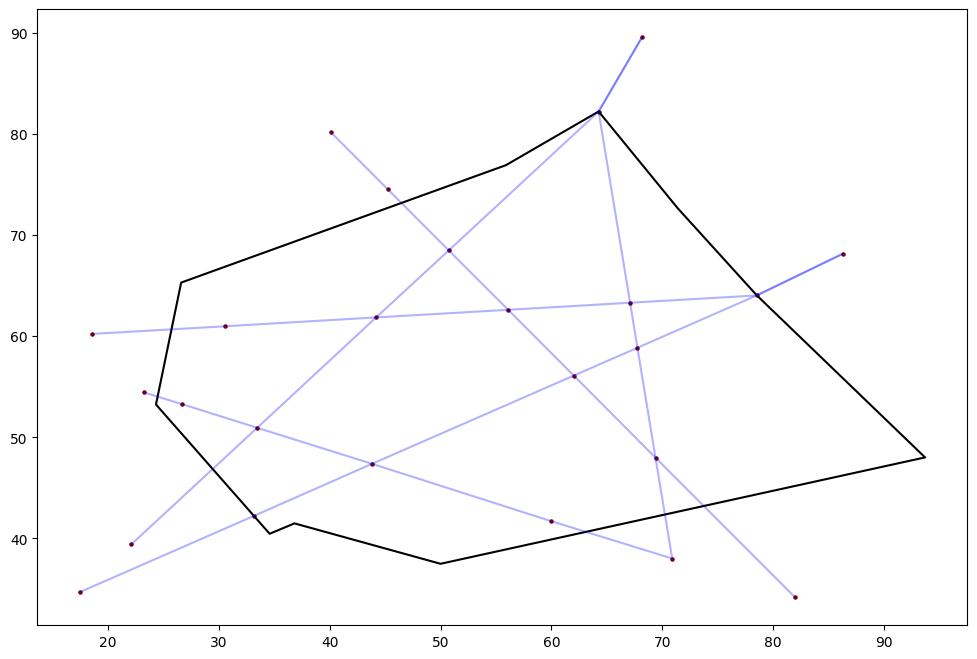

In [6]:
a = plot_sector()

class Ownship:
    def __init__(self, start_x, start_y, heading, speed, offset, original_path, destination):
        self.start_x = start_x
        self.start_y = start_y
        self.x = start_x
        self.y = start_y
        self.offset = offset
        self.heading = heading
        self.speed = speed
        self.offset = offset
        self.destination = destination
        self.pathlist = []
        self.original_path = original_path
        self.position = [self.x, self.y]

    def step(self, n_step, new_heading):
        if n_step <= self.offset:
            self.x = self.start_x
            self.y = self.start_y
        else:    
            self.heading = new_heading
            self.x = np.clip(self.x + self.speed *np.cos(new_heading), 0, 100)
            self.y = np.clip(self.y + self.speed *np.sin(new_heading), 0, 100)
        return self.x, self.y
    
class Intruder:
    def __init__(self, start_x, start_y, offset, heading, speed, destination):
        self.start_x = start_x
        self.stat_y = start_y
        self.x = start_x
        self.y = start_y
        self.offset = offset
        self.heading = heading
        self.speed = speed
        self.destination = destination
        self.position = [self.x, self.y]

    def step(self, n_step, new_heading):
        if n_step <= self.offset:
            self.x = self.start_x
            self.y = self.start_y
        else:
            self.heading = new_heading
            self.x = np.clip(self.x + self.speed *np.cos(new_heading), 0, 100)
            self.y = np.clip(self.y + self.speed *np.sin(new_heading), 0, 100)
        return self.x, self.y


In [7]:
class Agent():
    """
    The Agent class encapsulates the state and parameters for two aircraft in a conflict scenario: the “ownship” (o_) 
    and the “intruder” (i_). Its __init__ method calls a helper to load all scenario data (paths, headings, start/destination
    points, scaled offsets, etc.) for one scenario from our DataFrame, then organizes that into easy-to-use attributes. It 
    also computes fixed speeds and the number of time-steps to reach each aircraft’s first conflict point (“offset”), and 
    prepares a LineString for the ATCO-approved path.

        # 1) Pull all relevant scenario arrays/values for ownship (o_*) and intruder (i_*).
        #    get_conflict_scenario returns:
        #    - o_resolved_path: list of [x, y] for ATCO-approved ownship route
        #    - o_unres_path:   list of [x, y] for original ownship route before conflict resolution
        #    - o_heading:      initial ownship heading (radians)
        #    - o_startposition:ownship start [x, y]
        #    - o_offset_dist_scaled: distance ownship travels before conflict point (scaled)
        #    - o_destination:  ownship destination [x, y]
        #    - i_path:         intruder path coordinates list
        #    - i_headinglist:  list of heading angles for intruder at each step
        #    - i_startposition:intruder start [x, y]
        #    - i_offset_dist_scaled: intruder’s scaled offset distance
        #    - i_destination:  intruder destination [x, y]
        #    - fileinfo:       metadata about this scenario (e.g., filename, index)
    """
    def __init__(self):
        o_resolved_path, o_unres_path, o_heading, o_startposition, o_offset_dist_scaled, o_destination, \
        i_path, i_headinglist, i_startposition, i_offset_dist_scaled, i_destination, fileinfo = get_conflict_scenario(featurefile)
        # 2) Store ownship’s “resolved” (ATCO-approved) vs. “unresolved” paths
        self.o_resolved_path = o_resolved_path
        self.o_unresolved_path = o_unres_path
        # 3) Initial and current heading for ownship
        def _wrap_pi(a: float) -> float:
            return ((float(a) + math.pi) % (2.0 * math.pi)) - math.pi

        self.o_initial_heading = _wrap_pi(o_heading)
        self.o_heading = self.o_initial_heading

        # 4) Start position (tuple) vs. mutable position list
        self.o_start = tuple(o_startposition)
        self.o_position = o_startposition
        # 5) Distance until conflict (“offset”), scaled for ownship
        self.o_offset_dist = o_offset_dist_scaled
        # 6) Final waypoint for ownship
        self.o_destination = o_destination
            # --- Ensure the resolved (ATCO) path runs from START → DESTINATION ---
        def _ensure_forward_path(path, start, dest):
            # If the path is saved backwards (dest→start), reverse it.
            # We compare which ordering is closer to (start, dest) at the ends.
            p0 = np.array(path[0], dtype=float)
            pN = np.array(path[-1], dtype=float)
            start = np.array(start, dtype=float)
            dest  = np.array(dest, dtype=float)
            keep_cost = np.linalg.norm(p0 - start) + np.linalg.norm(pN - dest)
            flip_cost = np.linalg.norm(pN - start) + np.linalg.norm(p0 - dest)
            return path if keep_cost <= flip_cost else list(reversed(path))

        if len(o_resolved_path) >= 2:
            self.o_resolved_path = _ensure_forward_path(o_resolved_path, self.o_start, self.o_destination)
        else:
            # Degenerate path (just in case) – keep as provided
            self.o_resolved_path = o_resolved_path

        # 7) Record actual flown trajectory
        self.o_newpathlist = [self.o_position]

        # 8) Build LineString **after** possibly reversing the path
        self.ATCO_path_linestring = LineString(self.o_resolved_path)

        # 9) Intruder: headings & positions
        self.i_headinglist = i_headinglist
        self.i_start = tuple(i_startposition)
        self.i_position = i_startposition

        # 10) Intruder path/offset/destination
        self.i_path = i_path
        self.i_offset_dist = i_offset_dist_scaled
        self.i_destination = i_destination

        # 11) Fixed speeds (units/step)
        self.o_speed = 2
        self.i_speed = 2

        # 12) Steps to each offset
        self.o_offset = int(np.ceil(self.o_offset_dist / self.o_speed))
        self.i_offset = int(np.ceil(self.i_offset_dist / self.i_speed))

        # 13) Count of applied actions
        self.n_actions = 0

        # 14) Scenario metadata
        self.fileinfo = fileinfo

    def step(self, n_step, new_heading):
        # Prepare placeholders for new x,y positions
        xo, yo, xi, yi = 0, 0, 0, 0

        # --- Move the ownship ---
        # OLD-PPO-compatible behavior:
        # - Do NOT change self.o_heading until the ownship actually starts moving
        # - Do NOT wrap the angle to (-pi, pi]; keep it as-is
        if n_step <= self.i_offset:
            # Not moving yet: keep position and keep the previous heading unchanged
            self.o_position = self.o_start
        else:
            # Update heading only now (when we start moving), unwrapped
            self.o_heading = new_heading

            # Move forward by o_speed along that heading (clipped to bounds)
            xo = np.clip(self.o_position[0] + self.o_speed*np.cos(new_heading), 15, 100)
            yo = np.clip(self.o_position[1] + self.o_speed*np.sin(new_heading), 15, 100)
            self.o_position = [xo, yo]

        # Save the actual current ownship position
        self.o_newpathlist.append(list(self.o_position))

        # --- Intruder update (unchanged) ---
        if n_step <= self.o_offset:
            self.i_position = self.i_start
        elif len(self.i_path) + self.o_offset > n_step > self.o_offset:
            xi = np.clip(self.i_position[0] + self.i_speed*np.cos(self.i_headinglist[n_step - self.o_offset]), 15, 100)
            yi = np.clip(self.i_position[1] + self.i_speed*np.sin(self.i_headinglist[n_step - self.o_offset]), 15, 100)
            self.i_position = [xi, yi]
        else:
            self.i_position = self.i_destination

        return self.o_position, self.i_position

        
    def path_follow_heading(self, lookahead: float = 1.0) -> float:
        """
        Aim a little ahead on the ATCO path (pure-pursuit). Returns heading in radians.
        """
        cur = Point(self.o_position[0], self.o_position[1])
        s = self.ATCO_path_linestring.project(cur)
        s_next = min(self.ATCO_path_linestring.length, s + lookahead)
        tgt = self.ATCO_path_linestring.interpolate(s_next)
        dx = tgt.x - self.o_position[0]
        dy = tgt.y - self.o_position[1]
        return math.atan2(dy, dx)

In [8]:
A = Agent()

In [9]:
class StructuredEnv(gym.Env):
    """
    This constructor sets up our custom Gym environment. It takes in a list of reward-weight parameters, 
    creates a fresh Agent. It initializes step and reward counters, then defines how many actions are possible 
    and what shape/value-ranges our observations will have. This tells any RL algorithm how to talk to our environment.
    """
    SAFE_R = 5 # Minimum safe separation distance between aircraft
    MAX_STEP = 60 # Maximum number of time-steps per episode

    def __init__(self, Reward_Params= [-1, -1, -1, -1, -1, 1], start_llm_at_step: int = 15):
        # 1) Store the list of six reward-component weights (a1…a6)
        self.Reward_Params = Reward_Params
        # 2) Create a new conflict-scenario agent (ownship + intruder)
        self.agent = Agent()
        # 3) Initialize the reward from the last step, the current step counter and the accumulated total reward
        self.reward = 0
        self.n_step = 0
        self.total_reward = 0
        self.action_space = spaces.Discrete(13)
        first_obs = self.observation_func()
        n = first_obs.size

        low = np.full(n, -np.inf, dtype=np.float64)
        high = np.full(n,  np.inf, dtype=np.float64)

        # 0..5: positions/destination coords (you clip positions inside [15,100], keep generous but finite)
        low[0:6]  = -100.0
        high[0:6] =  120.0

        # 6: separation distance >= 0
        low[6]  = 0.0

        # 7..8: distances to destinations >= 0
        low[7:9] = 0.0

        # 9: cross-track distance to unresolved path (distance) >= 0
        low[9] = 0.0

        # 10: distance to ATCO path (distance) >= 0
        low[10] = 0.0

        # 11: own heading (radians)
        low[11]  = -math.pi
        high[11] =  math.pi

        # 12: ATCO path heading (degrees)
        low[12]  = -180.0
        high[12] =  180.0

        # 13: heading error to path (degrees)
        low[13]  = -180.0
        high[13] =  180.0

        # 14: signed cross-track to path (can be ± large) -> leave as ±inf (already set)

        # 15..16: along-track s and remaining path length >= 0
        low[15:17] = 0.0

        self.observation_space = spaces.Box(low=low, high=high, shape=(n,), dtype=np.float64)
        self.start_llm_at_step = start_llm_at_step  # call LLM only once ≥ this controller step

    def reset(self, seed=None, options=None):
        """
        The reset method is called at the start of each episode to bring the environment back to its initial state. 
        It optionally seeds randomness, creates a fresh Agent (ownship + intruder), zeroes out all counters 
        and rewards, computes the very first observation, and returns that observation along with an empty info dictionary.
        """
        super().reset(seed=seed) # Call parent reset if you pass seed/options
        # Create a new Agent instance for each reset
        self.agent = Agent() 
        # Initialize counters and rewards, Clear out the last step reward 
        self.reward = 0 
        self.n_step = 0
        self.total_reward = 0
        # Compute the initial observation vector from the fresh agent state
        observation = self.observation_func()
        # Gym’s `reset` requires an `info` dict (we have no extra data to return)
        info = {} 
        # Return the tuple (observation, info)
        # This is the standard return format for Gym environments
        # The observation is the initial state of the environment, and info is an empty dictionary
        return observation, info 

    def step(self, action):
        """
        Given an action (one of 13 discrete turn adjustments), 
        it advances the global time-step, converts that action into a small heading change for the ownship, 
        updates both aircraft positions via the Agent.step call, checks if the episode should end 
        (because both planes reached their goals, came too close, moved away, or exceeded the maximum steps), 
        computes the reward based on all those factors, and finally returns the new observation, the step reward, 
        and flags indicating whether the episode terminated or was truncated.

        We chose 0.175/2 because:
        0.175 radians is about 10° (since 1° ≈ 0.01745 rad).
        By dividing by 2, you get ≈0.0875 rad, which is about 5°.
        That way each “1-step” in your discrete action corresponds to a 5° turn. 
        Multiplying that base step by 0–6 (or –6 to –1) then gives you turns of 0°, ±5°, ±10°, … up to ±30° per time-step.
        """
        # 1) Advance the step counter
        self.n_step += 1
        
        # 2) Prepare termination/truncation flags
        terminated = False
        truncated = False
        # --- 3) Choose the base heading depending on the step ---
        # Steps 0–4: autopilot hugs the ATCO path.
        # Step ≥ 5: autopilot OFF → base is current heading; only LLM deltas change it.
        if self.n_step < self.start_llm_at_step:
            base_heading = self.agent.path_follow_heading(lookahead=1.0)
        else:
            base_heading = self.agent.o_heading  # keep flying what we have unless LLM adds a delta

        # --- Discrete delta from action (0.175/2 ≈ 5° per bin) ---
        if action < 7:
            angle = action * (0.175/2)          # +0,+5,...,+30 deg
        else:
            angle = (action - 6) * -(0.175/2)   # -5,...,-30 deg

        # Final heading this step
        ownship_heading = base_heading + angle


        # 4) Move both aircraft one step using the composed heading
        self.agent.step(self.n_step, ownship_heading)

        # 5) Measure distances for termination checks:
        #    - First extract the points 
        #    - Ownship to its destination
        #    - Intruder to its destination
        #    - Separation between the two aircraft
        p1 = self.agent.o_position
        # o_destination = self.agent.o_destination
        o_destination = np.array(self.agent.o_destination, dtype=float)
        p2 = self.agent.i_position
        i_destination = self.agent.i_destination
        dist1_to_dest = np.linalg.norm(np.array(p1) - np.array(o_destination))
        dist2_to_dest = np.linalg.norm(np.array(p2) - np.array(i_destination))
        sep_dist = np.linalg.norm(np.array(p1) - np.array(p2))

        # 6) Terminate if both reached within 5 units of their goals
        if (dist1_to_dest < 5) and (dist2_to_dest < 5):
            terminated = True
        
        # 7) Terminate if they come closer than SAFE_R (collision risk)
        if (sep_dist < self.SAFE_R):
            terminated = True

        # 8) Terminate if ownship is moving away from its goal by more than a small threshold
        threshold = 0.1
        if len(self.agent.o_newpathlist) > 2: # Ensure there's a previous point to compare
            previous_location = np.array(self.agent.o_newpathlist[-2])
            o_current_location = np.array(self.agent.o_position)
            prev_distance = np.linalg.norm(o_destination - previous_location)
            current_distance = np.linalg.norm(o_destination - o_current_location)
            if prev_distance - current_distance < -threshold:
                terminated = True # Punish for moving away

        # 9) Truncate if we exceed MAX_STEP
        if self.n_step >= self.MAX_STEP:
            truncated = True
        
        # 10) Compute the reward, passing a combined “done” flag
        combined_done_for_reward_func = terminated or truncated
        self.reward = self.reward_func(combined_done_for_reward_func)
        self.total_reward += self.reward
        
        # 11) Build next observation and empty info dict
        observation = self.observation_func()
        info = {}
        # 12) Return the Gym-standard 5-tuple
        return observation, self.reward, terminated, truncated, info # Return 5 values

            
    def reward_func(self, done):
        """ 
        This method computes the scalar reward at each step by combining several components—step penalty, 
        trajectory deviation, loss-of-separation penalty/bonus, failure-to-reach penalty, and success bonus—each 
        weighted by the six parameters a1…a6. If the episode has ended (done=True), additional terms (e.g., whether
        we collided or reached the goal) are applied. The final reward is the weighted sum plus any extra “moving-back” 
        penalty.

        """
        # 1) Unpack the six weights from the environment’s configuration        
        a1 = self.Reward_Params[0]
        a2 = self.Reward_Params[1]
        a3 = self.Reward_Params[2]
        a4 = self.Reward_Params[3]
        a5 = self.Reward_Params[4]
        a6 = self.Reward_Params[5]
        
        # 2) Base costs or rewards (initialized here)
        Reward_Step = 0.01 # small per-step penalty to encourage faster resolution
        Moving_back_reward = 0 # penalty if ownship moves away from its goal
        CTDreward = 0 # placeholder for distance-from-original-path reward (unused)
        reward_traj_dev = 0 # trajectory deviation reward


        # 3) Compute deviation from the ATCO-approved path:
        #    • Create a Point for ownship’s current pos
        #    • Compute its distance to the approved LineString (in same units)
        #    • Scale by 20/1000 to form the deviation reward
        o_destination = np.array(self.agent.o_destination)       
        o_current_location = Point(self.agent.o_position)
        ATCO_path_linestring = self.agent.ATCO_path_linestring
        dist = o_current_location.distance(ATCO_path_linestring)
        reward_traj_dev =  20 * (dist/1000)
        # 4) Combine any CTDreward (currently zero) with the trajectory deviation
        Reward_Deviation = CTDreward +  reward_traj_dev # This is negative, so it penalizes deviation
        
        # 5) Initialize other components
        Reward_LOS = 0
        Reward_Maneuvering = 0
        Reward_Not_Reached = 0
        Reward_Reached =0

        # 6) Distance between ownship and intruder (for LOS/collision)
        dis1 = np.linalg.norm(np.array(self.agent.o_position) - np.array(self.agent.i_position))
        
        Reward_LOS = 0
        threshold = 0.1
        # 7) Only apply certain rewards/penalties once the episode is done
        if done:
            # 7a) Collision or near-miss bonus/penalty: if we ended due to separation breach
            if (dis1 < self.SAFE_R) :
                Reward_LOS = 10 # This is a negative reward, so it penalizes loss of separation

            # 7b) If we reached the maximum number of steps without reaching the destination
            if self.n_step == self.MAX_STEP:
                # Penalize based on how far ownship still is from its destination
                current_location = self.agent.o_position
                dist_o_d = np.linalg.norm(np.array(o_destination) - np.array(current_location))
                Reward_Not_Reached = (dist_o_d/10) # Penalize for not reaching destination

            # 7c) Penalty if the ownship just moved away from its destination in final step (done in the else part)
            if len(self.agent.o_newpathlist) <=2:
                pass
            else:
                # Grab the second-to-last position we recorded for ownship
                previous_location = np.array(self.agent.o_newpathlist[-2])
                # Grab the current position of ownship
                o_current_location = np.array(self.agent.o_position)
                # Compute distance from that previous point to the destination
                prev_distance = np.linalg.norm(o_destination - previous_location)
                # Compute distance from the final point to the destination
                current_distance = np.linalg.norm(o_destination - o_current_location)
                # If current_distance > prev_distance by more than `threshold`,
                # it means ownship moved away. We then set a penalty:
                if prev_distance - current_distance < -threshold:
                    Moving_back_reward =  -20
               

            #reaching destination
            p1 = self.agent.o_position
            o_destination = self.agent.o_destination
            p2 = self.agent.i_position
            
            i_destination = self.agent.i_destination
            # 7d) Success bonus or failure penalty upon reaching ownship destination (else condition)
            dist1 = np.linalg.norm(np.array(p1) - np.array(o_destination))
            # dist2 = np.linalg.norm(np.array(p2) - np.array(i_destination))
            if (dist1 < 5): # reaching destination
                Reward_Reached = 10
            else:
                Reward_Reached = - dist1/10 # penalize for not reaching destination (proportional to remaining distance)

        reward = a1 * Reward_Step + a2 *Reward_Deviation + a3 * Reward_LOS + \
                    a5 * Reward_Not_Reached + a6 * Reward_Reached + Moving_back_reward 
        return reward        


    def observation_func(self):
        """
        This method gathers all the state information we want the agent to “see” at each step,
        packs it into a flat NumPy array, and returns it. It includes the ownship’s and intruder’s positions,
        the ownship’s destination, pairwise distances (between aircraft and to each destination), how far the ownship
        has strayed from its original and ATCO-approved paths, and the ownship’s current heading.

        The observation vector contains, in order:
            Ownship’s X and Y position
            Intruder’s X and Y position
            Ownship’s destination X and Y
            Distance between ownship and intruder
            Distance from ownship to its destination
            Distance from intruder to its destination
            Distance from ownship to its original (unresolved) path
            Distance from ownship to the ATCO-approved path
            Ownship’s current heading angle
        """
        observation  = []

        observation.append(self.agent.o_position[0])
        observation.append(self.agent.o_position[1])
        observation.append(self.agent.i_position[0])
        observation.append(self.agent.i_position[1])
        observation.append(self.agent.o_destination[0])
        observation.append(self.agent.o_destination[1])
        # observation.append(self.agent.i_destination[0])
        # observation.append(self.agent.i_destination[1])
    

        dist1 = np.linalg.norm(np.array(self.agent.o_position) - np.array(self.agent.i_position)) 
        dist_o_d = np.linalg.norm(np.array(self.agent.o_position) - np.array(self.agent.o_destination))
        dist_i_d = np.linalg.norm(np.array(self.agent.i_position) - np.array(self.agent.i_destination))

        # Distance between ownship and intruder
        observation.append(dist1)  
        # Distance from ownship to its destination
        observation.append(dist_o_d)
        # Distance from intruder to its destination
        observation.append(dist_i_d)
        # individual coordinates

        current_location = Point(self.agent.o_position)
        # How far ownship is from its ORIGINAL unresolved path
        CTD_distance  = current_location.distance(LineString(self.agent.o_unresolved_path))
        # How far ownship is from the ATCO-approved path
        dist_from_ATCO_path = current_location.distance(self.agent.ATCO_path_linestring)

        observation.append(CTD_distance) #
        observation.append(dist_from_ATCO_path)

        # Ownship’s current heading angle (radians)
        observation.append(self.agent.o_heading)  

        # New LLM observation:
        # --- NEW ATCO-path features ---
                # --- NEW ATCO-path features ---
        cur_pt = Point(self.agent.o_position[0], self.agent.o_position[1])
        line = self.agent.ATCO_path_linestring

        # Along-track distance s and foot point on the path
        s = line.project(cur_pt)
        foot = line.interpolate(s)

        # Unit tangent at s (finite-difference fallback)
        eps = max(1e-3, min(1.0, 0.001 * line.length))
        p_fwd = line.interpolate(min(line.length, s + eps))
        tx, ty = (p_fwd.x - foot.x, p_fwd.y - foot.y)
        if abs(tx) < 1e-9 and abs(ty) < 1e-9:  # fallback if degenerate
            h = self.agent.path_follow_heading(lookahead=1.0)
            tx, ty = math.cos(h), math.sin(h)

        # Signed cross-track: sign by 2D cross product (tangent × foot->own)
        dx, dy = (cur_pt.x - foot.x, cur_pt.y - foot.y)
        cross = tx * dy - ty * dx
        signed_xtrk = math.copysign(math.hypot(dx, dy), cross)

        # Convert tangent to degrees
        path_heading_deg = math.degrees(math.atan2(ty, tx))
        own_heading_deg  = math.degrees(self.agent.o_heading)
        # heading_error_to_path_deg = (path - own) wrapped to (-180, 180]
        heading_error_to_path_deg = ((path_heading_deg - own_heading_deg + 180.0) % 360.0) - 180.0

        # Keep ObsSnapshot’s expected order:
        observation.extend([
            path_heading_deg,           # index 12
            heading_error_to_path_deg,  # index 13
            signed_xtrk,                # index 14
        ])

        # (Optional) You can still add these extras; ObsSnapshot just ignores them:
        along_track_s = float(s)
        remaining_path_len = float(line.length - s)
        observation.extend([along_track_s, remaining_path_len])  # indices 15,16 (optional)
   
        # Convert to a NumPy array and return
        observation = np.array(observation)

        # NEW LLM observation
        
        return observation

   
    def render(self, show = False, folder = './Images/'):
        """
        The render method draws a snapshot of the current episode on top of our sector plot, marking both aircraft’s 
        start, current, and destination points, the ATCO-approved path, and safety circles. It can either display the 
        figure interactively or save it to disk. The close method is a no-op placeholder for any future cleanup.
        """
        # 1) Draw the static sector background
        figure = plot_sector() # Call our helper to redraw boundaries/waypoints
        ax = figure.gca()  # Grab the current Axes for plotting overlays
        # ax.scatter(50,50, s = 200)
        
        # 2)Plot ownship’s current position (black dot), Plot ownship’s start (black triangle), Plot ownship’s destination (black star)
        ax.scatter(self.agent.o_position[0], self.agent.o_position[1], c = 'black', s = 40)
        ax.scatter(self.agent.o_start[0], self.agent.o_start[1] , c = 'black', s = 50, marker = '^')
        ax.scatter(self.agent.o_destination[0], self.agent.o_destination[1], c = 'black', s = 20, marker= '*')

        # 3) Plot intruder’s current position (maroon dot), Plot intruder’s start (maroon triangle), Plot intruder’s destination (maroon star)
        ax.scatter(self.agent.i_position[0], self.agent.i_position[1], c = 'maroon', s = 40)
        ax.scatter(self.agent.i_start[0], self.agent.i_start[1] , c = 'maroon', s = 50, marker = '^')
        ax.scatter(self.agent.i_destination[0], self.agent.i_destination[1], c = 'maroon', s = 20, marker= '*')
        x, y = [],[]
        for i in range(len(self.agent.o_unresolved_path)):
            x.append(self.agent.o_unresolved_path[i][0])    
            y.append(self.agent.o_unresolved_path[i][1])
            
        # ax.plot(x,y, linewidth = 1, color = 'grey')
        #add circle to the destination
        
        # 4) Draw the ATCO-approved path as a dashed maroon line
        x_, y_ = self.agent.ATCO_path_linestring.xy
        ax.plot(x_, y_, color = 'maroon',linestyle = '--', alpha = 1)

        # 5) Add translucent safety circles around each destination
        circle1 = plt.Circle((self.agent.o_destination[0], self.agent.o_destination[1]), 5, color = 'black',\
                              alpha = 0.2)
        circle2 = plt.Circle((self.agent.i_destination[0], self.agent.i_destination[1]), 5, color = 'maroon',\
                              alpha = 0.5)
        ax.add_patch(circle1)
        ax.add_patch(circle2)
        # 6) Annotate title with step number, recent reward, totals, headings, and offsets
        ax.set_title("Step {} - Reward {:.3f} - Total Reward {:.3f} - headings{}  - offsets(O:I){}".format(self.n_step,self.reward,\
                                                                            self.total_reward,\
                                                                                ((self.agent.o_initial_heading) ,\
                                                                                     np.round(math.degrees(self.agent.o_heading),2)),\
                                                                                        (self.agent.o_offset, self.agent.i_offset)))

        # ax.axis('scaled')
        
        # 7) Display the plot or save it to a file
        if show:
            plt.show()
        else:
            # Save the plot as a PNG file named by step number
            plt.savefig(folder + "image_{:0>3}.png".format(self.n_step)) 
            print(folder + "image_{:0>3}.png".format(self.n_step))

        return figure

    def close(self):
        # Placeholder for any cleanup (e.g., closing files or windows). Currently does nothing.
        pass

In [10]:
START_LLM_AT_STEP = 15
env = StructuredEnv(start_llm_at_step=START_LLM_AT_STEP)
check_env(env)

./Images/image_000.png


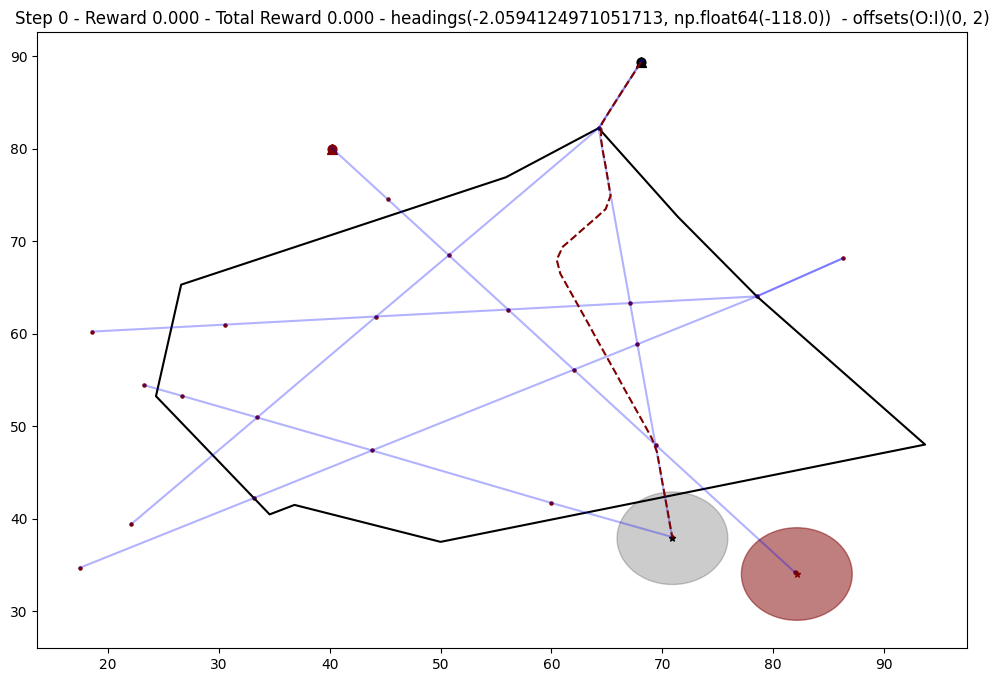

In [11]:
# Quick smoke test: reset, render one frame, then close3 
env.reset() # Reset the environment to its initial state
env.render() # Draw and save the first frame
env.close() # Close the environment (no-op here, but good practice)

In [12]:
# Sanity check: print the observation vector shape and values
env.observation_func()

array([ 6.80600000e+01,  8.93007500e+01,  4.02400000e+01,  7.99985000e+01,
        7.09200000e+01,  3.78907500e+01,  2.93340119e+01,  5.14894912e+01,
        6.22011962e+01,  6.92064196e-03,  0.00000000e+00, -2.05941250e+00,
       -1.17995644e+02, -3.18323146e-12,  0.00000000e+00,  0.00000000e+00,
        5.60938721e+01])

Overview of the Training & Evaluation Pipeline
This final section shows how we hook our custom environment into Stable-Baselines3’s PPO agent, train it, save the model, evaluate its performance, generate rollout animations, and finally launch TensorBoard to visualize training metrics.

 CHECKING THE PERCENTAGE OF SCENARIOS HAVING CONFLICTS
env = env
 Visualize 1 episode using the trained policy and store the image into selected folder
res = []
for trial in range(100):
    obs = env.reset()
    for i in range(60):
        # Take a random action
        action = 0
        obs, reward, done, info = env.step(action)
        
        # Render the game
        if done == True:
            if reward <= -5:
                res.append(1)
            else:
                res.append(0)
            break

res = np.mean(res)
print('res', res)

## PPO PyTorch Implementation

PyTorch version V4 - Following are the changes made on top of the previous version for smoother convergence:
- Used GAE(λ) + normalize advantages: We switched from raw Monte-Carlo returns to GAE and now only normalize advantages, which cuts variance in the policy gradient a lot.
- Mini-batch updates (with shuffling) + multiple epochs: Instead of one big full-batch step, we split each rollout into mini-batches and do a few passes (K_epochs=5). This steadies updates and avoids overfitting a single batch.
- Gradient clipping: We clip grads at 0.5 so no single update can “explode” the policy.
- Lower learning rates: lr_actor=2e-4, lr_critic=8e-4 (down from 3e-4 / 1e-3) to make each step gentler.
- Deterministic evaluation (argmax): During eval only, we pick the most likely action instead of sampling, so the eval curve reflects policy quality—not randomness.
- Observation normalization
- Reward normalization (per update batch): We standardize rewards within each update to keep target scales consistent for the value loss.

In [ ]:
def _atomic_torch_save(obj, path: str):
    parent = os.path.dirname(os.path.abspath(path))
    os.makedirs(parent, exist_ok=True)  # Ensure folder exists

    # Unique tmp name avoids collisions
    tmp = f"{path}.tmp.{os.getpid()}.{time.time_ns()}"
    try:
        torch.save(obj, tmp)
        os.replace(tmp, path)
    except FileNotFoundError:
        # Retry after a short sleep
        time.sleep(0.05)
        if os.path.exists(tmp):
            os.replace(tmp, path)
        else:
            raise FileNotFoundError(f"Failed to save checkpoint to {path}: temporary file {tmp} not found")
    except Exception as e:
        raise Exception(f"Failed to save checkpoint to {path}: {e}")


def save_training_checkpoint(path: str, agent, time_step: int, episode: int):
    ckpt = {
        # models
        "policy": agent.policy.state_dict(),
        "policy_old": agent.policy_old.state_dict(),
        "optimizer": agent.optimizer.state_dict(),
        # obs normalizer
        "obs_mean": agent.obs_rms.mean.detach().cpu(),
        "obs_var":  agent.obs_rms.var.detach().cpu(),
        "obs_count": float(agent.obs_rms.count),
        # counters
        "time_step": int(time_step),
        "episode": int(episode),
        # RNG states (optional but useful)
        "torch_rng": torch.get_rng_state(),
        "numpy_rng": np.random.get_state(),
        "py_rng":    random.getstate(),
        "cuda_rng":  torch.cuda.get_rng_state_all() if torch.cuda.is_available() else None,
        # (optional) hyperparams snapshot if you want
        "hparams": {
            "gamma": agent.gamma,
            "K_epochs": agent.K_epochs,
            "eps_clip": agent.eps_clip,
            "mb_size": agent.mb_size,
            "gae_lambda": agent.gae_lambda,
        },
    }
    _atomic_torch_save(ckpt, path)

def load_training_checkpoint(path: str, agent, device):
    ckpt = torch.load(path, map_location=device)

    agent.policy.load_state_dict(ckpt["policy"])
    agent.policy_old.load_state_dict(ckpt["policy_old"])
    agent.optimizer.load_state_dict(ckpt["optimizer"])

    agent.obs_rms.mean  = ckpt["obs_mean"].to(device)
    agent.obs_rms.var   = ckpt["obs_var"].to(device)
    agent.obs_rms.count = ckpt["obs_count"]

    # restore RNG states (optional)
    torch.set_rng_state(ckpt["torch_rng"])
    if torch.cuda.is_available() and ckpt.get("cuda_rng") is not None:
        torch.cuda.set_rng_state_all(ckpt["cuda_rng"])
    np.random.set_state(ckpt["numpy_rng"])
    random.setstate(ckpt["py_rng"])

    return int(ckpt["time_step"]), int(ckpt["episode"])


In [14]:
# 0. Utilities: Running Mean/Std for Obs Normalization
class RunningMeanStd:
    """Track running mean and variance of observations."""
    def __init__(self, shape, eps: float = 1e-4):
        self.mean  = torch.zeros(shape, dtype=torch.float32, device=device)
        self.var   = torch.ones(shape,  dtype=torch.float32, device=device)
        self.count = eps

    @torch.no_grad()
    def update(self, x: torch.Tensor):
        # x: (..., shape)
        if x.dim() == 1:
            x = x.unsqueeze(0)
        batch_mean = x.mean(dim=0)
        batch_var  = x.var(dim=0, unbiased=False)
        batch_count = x.shape[0]
        delta = batch_mean - self.mean
        tot_count = self.count + batch_count
        new_mean = self.mean + delta * (batch_count / tot_count)
        m_a = self.var * self.count
        m_b = batch_var * batch_count
        M2 = m_a + m_b + (delta ** 2) * self.count * batch_count / tot_count
        new_var = M2 / tot_count
        self.mean, self.var, self.count = new_mean, new_var, tot_count

    def normalize(self, x: torch.Tensor) -> torch.Tensor:
        return (x - self.mean) / torch.sqrt(self.var + 1e-8)

# 1. Rollout Buffer
class RolloutBuffer:
    def __init__(self):
        self.states       = []  # list of torch tensors (normalized obs) on device
        self.actions      = []  # list of torch tensors on device
        self.logprobs     = []  # list of torch tensors on device
        self.state_values = []  # list of torch tensors on device
        self.rewards      = []  # list of floats
        self.is_terminals = []  # list of bools
        # NEW: for hybrid path with LLM intent
        self.intents          = []  # torch float32, shape [4]
        self.active_masks     = []  # torch float32 scalar {0,1}
        self.llm_target_bin   = []  # python int (0..12) or -1 if N/A
        self.llm_target_deg   = []  # python float (snapped deg) or 0.0 if N/A


    def clear(self):
        # Reset all buffer lists by reinitializing
        self.__init__()

# 2. Hybrid Actor-Critic Network (attention-ready, backward compatible)
class HybridActorCritic(nn.Module):
    """
    Backward-compatible drop-in for ActorCritic:
      - Keeps .net (state-only MLP), .actor, .critic so existing calls keep working.
      - Adds .intent_proj and .attn + a fuse() path we will enable in Step 2.
      - Right now, PPO continues to use the state-only path (identical behavior).
    """
    def __init__(self, state_dim, action_dim, d_model: int = 64, n_heads: int = 1):
        super().__init__()
        # --- State-only path (kept for backward-compat) ---
        self.net = nn.Sequential(
            nn.Linear(state_dim, d_model), nn.Tanh(),
            nn.Linear(d_model, d_model),   nn.Tanh()
        )
        self.actor  = nn.Sequential(nn.Linear(d_model, action_dim), nn.Softmax(dim=-1))
        self.critic = nn.Linear(d_model, 1)

        # --- New components for fusion (will be used in Step 2) ---
        self.intent_proj = nn.Linear(4, d_model)
        self.attn = nn.MultiheadAttention(d_model, n_heads, batch_first=True)

        # Cache to support "hold" reuse later (Step 3)
        self._last_fused: Optional[torch.Tensor] = None

    # ---- Backward-compatible API used by your current PPO ----
    def act(self, state: torch.Tensor):
        """
        Current training/eval uses state-only path to keep behavior identical.
        We'll switch this to fused path in Step 2.
        """
        features     = self.net(state)
        action_probs = self.actor(features)
        dist         = Categorical(action_probs)

        action      = dist.sample()
        action_logp = dist.log_prob(action)
        value       = self.critic(features)
        return action.detach(), action_logp.detach(), value.detach()

    def evaluate(self, states: torch.Tensor, actions: torch.Tensor):
        """
        Batch evaluation on the state-only path (unchanged behavior).
        """
        features        = self.net(states)
        action_probs    = self.actor(features)
        dist            = Categorical(action_probs)

        action_logprobs = dist.log_prob(actions)
        dist_entropy    = dist.entropy()
        state_values    = self.critic(features).squeeze(-1)
        return action_logprobs, state_values, dist_entropy

    # ---- New fusion utilities (will be used starting Step 2) ----
    def fuse(self, state_emb: torch.Tensor,
             intent_emb: Optional[torch.Tensor] = None,
             active_mask: Optional[torch.Tensor] = None) -> torch.Tensor:
        """
        Build a two-token sequence [state_token, intent_token] and run MHSA.
        If no intent or active_mask==0, bypass and return state token.
        Shapes:
          state_emb:  (B, d_model)  from a state MLP/projection
          intent_emb: (B, 4)        raw intent (norm_turn, norm_hold, is_wait, is_exec)
          active_mask: scalar or (B,) 1=use attention, 0=bypass
        Returns:
          fused embedding z: (B, d_model)
        """
        # State token (project to d_model if needed)
        h_s = self.net[0](state_emb) if state_emb.shape[-1] != self.net[0].in_features else state_emb
        if state_emb.shape[-1] == self.net[0].in_features:
            # Run the same two-layer MLP to stay consistent with current features
            h_s = self.net(state_emb)  # (B, d_model)

        # Bypass unless explicitly active
        use_attn = (intent_emb is not None) and (active_mask is not None) and (
            (torch.is_tensor(active_mask) and torch.any(active_mask != 0)) or
            (not torch.is_tensor(active_mask) and active_mask != 0)
        )
        if not use_attn:
            return h_s

        # Intent token
        h_i = torch.tanh(self.intent_proj(intent_emb))  # (B, d_model)

        # Tokens: (B, 2, d_model)
        tokens = torch.stack([h_s, h_i], dim=1)
        attn_out, _ = self.attn(tokens, tokens, tokens, need_weights=False)
        z = attn_out.mean(dim=1)  # simple pooling over the 2 tokens
        return z

    def act_from_fused(self, z: torch.Tensor):
        action_probs = self.actor(z)
        dist         = Categorical(action_probs)
        action      = dist.sample()
        action_logp = dist.log_prob(action)
        value       = self.critic(z)
        return action.detach(), action_logp.detach(), value.detach()

    def evaluate_from_fused(self, z: torch.Tensor, actions: torch.Tensor):
        action_probs    = self.actor(z)
        dist            = Categorical(action_probs)
        action_logprobs = dist.log_prob(actions)
        dist_entropy    = dist.entropy()
        state_values    = self.critic(z).squeeze(-1)
        return action_logprobs, state_values, dist_entropy


# 3. PPO Agent Wrapper
class PPO:
    def __init__(
        self,
        state_dim,
        action_dim,
        lr_actor=2e-4,
        lr_critic=8e-4,
        gamma=0.99,
        K_epochs=5,
        eps_clip=0.2,
        mb_size=256,
        gae_lambda=0.95,
        normalize_reward=True,
    ):
        self.gamma      = gamma
        self.eps_clip   = eps_clip
        self.K_epochs   = K_epochs
        self.mb_size    = mb_size
        self.gae_lambda = gae_lambda
        self.normalize_reward = normalize_reward

        self.buffer = RolloutBuffer()

        # Observation normalizer
        self.obs_rms = RunningMeanStd(shape=state_dim)

        # Initialize current & old policy networks on device
        # self.policy     = ActorCritic(state_dim, action_dim).to(device)
        # self.policy_old = ActorCritic(state_dim, action_dim).to(device)
        self.policy     = HybridActorCritic(state_dim, action_dim).to(device)
        self.policy_old = HybridActorCritic(state_dim, action_dim).to(device)
        self.policy_old.load_state_dict(self.policy.state_dict())

        # Optimizer for actor and critic parameters
        self.optimizer = torch.optim.Adam([
            {'params': self.policy.net.parameters(),        'lr': lr_actor},   # state MLP
            {'params': self.policy.actor.parameters(),      'lr': lr_actor},
            {'params': self.policy.critic.parameters(),     'lr': lr_critic},
            {'params': self.policy.intent_proj.parameters(),'lr': lr_actor},   # new
            {'params': self.policy.attn.parameters(),       'lr': lr_actor},   # new
        ])
        self.MseLoss = nn.MSELoss()
        # --- NEW: alignment knobs (defaults keep behavior almost identical) ---
        self.use_kl_to_llm = True
        self.use_mse_to_llm = False
        self.lambda_kl = 0.10
        self.lambda_mse = 0.00

        # Bin → degrees map for expected-heading MSE
        self._deg_by_idx = torch.tensor(
            [0, 5,10,15,20,25,30,  -5,-10,-15,-20,-25,-30],
            dtype=torch.float32, device=device
        )
        # Cache for "hold_steps" fused embedding reuse (episode-scoped)
        self._fused_cache = None

    def _normalize_obs_train(self, state_tensor: torch.Tensor) -> torch.Tensor:
        # Update running stats with current state, then normalize
        self.obs_rms.update(state_tensor)
        return self.obs_rms.normalize(state_tensor)

    def _normalize_obs_eval(self, state_tensor: torch.Tensor) -> torch.Tensor:
        # Use current running stats, do NOT update during evaluation
        return self.obs_rms.normalize(state_tensor)

        # --- helpers for LLM-intent (unused = zeros) ---
    def _prepare_intent_tensors(self, intent_embed, phase_active: int):
        """
        Returns (intent_t [4], mask_t [1]) on device.
        If intent_embed is None, returns zeros and mask=0.
        """
        if intent_embed is None:
            intent_t = torch.zeros(4, dtype=torch.float32, device=device)
            mask_t   = torch.tensor([0.0], dtype=torch.float32, device=device)
        else:
            # expect a length-4 iterable: [norm_turn, norm_hold, is_wait, is_exec]
            intent_t = torch.tensor(intent_embed, dtype=torch.float32, device=device)
            mask_t   = torch.tensor([1.0 if phase_active else 0.0], dtype=torch.float32, device=device)
        return intent_t, mask_t

    def _snap_deg_to_bin_index(self, deg: float) -> int:
        """
        Map degrees in {0,±5,±10,...,±30} to action index 0..12.
        Returns -1 if deg is invalid (not multiple of 5 or |deg|>30).
        Bins: 0..6 => +0,+5,+10,+15,+20,+25,+30; 7..12 => -5,-10,-15,-20,-25,-30
        """
        d = int(round(float(deg)))
        if d % 5 != 0 or abs(d) > 30:
            return -1
        return d // 5 if d >= 0 else 6 + (abs(d) // 5)

    def select_action_hybrid(self, state, intent_embed=None, phase_active: int = 0,
                             target_deg: float = None, reuse_cached: bool = False):
        """
        Hybrid selection on policy_old using fused embedding.
        If reuse_cached is True and a cache exists, we reuse the last fused z (ignores new obs).
        """
        # 1) normalize obs (train-time)
        state_tensor = torch.tensor(state, dtype=torch.float32, device=device)
        norm_state   = self._normalize_obs_train(state_tensor)  # [state_dim]

        # 2) prepare intent + mask
        intent_t, mask_t = self._prepare_intent_tensors(intent_embed, phase_active)

        # 3) decide fused embedding (reuse or recompute)
        z: torch.Tensor
        if reuse_cached and (self._fused_cache is not None):
            z = self._fused_cache  # (d_model,)
        else:
            z = self.policy_old.fuse(
                norm_state.unsqueeze(0),     # (1, state_dim)
                intent_t.unsqueeze(0),       # (1, 4)
                mask_t                       # (1,)
            ).squeeze(0)                      # (d_model,)
            # Only keep cache while an LLM phase is active (mask=1)
            self._fused_cache = z.detach() if (mask_t.item() > 0.5) else None

        # 4) sample from fused embedding (policy_old heads)
        action, logp, value = self.policy_old.act_from_fused(z)

        # 5) store rollout (keep old fields; add new)
        self.buffer.states.append(norm_state)
        self.buffer.actions.append(action)
        self.buffer.logprobs.append(logp)
        self.buffer.state_values.append(value)

        self.buffer.intents.append(intent_t)         # [4]
        self.buffer.active_masks.append(mask_t[0])   # scalar

        if target_deg is None:
            self.buffer.llm_target_bin.append(-1)
            self.buffer.llm_target_deg.append(0.0)
        else:
            idx = self._snap_deg_to_bin_index(target_deg)
            self.buffer.llm_target_bin.append(idx)
            self.buffer.llm_target_deg.append(float(int(round(target_deg))))

        return action.cpu().item()

    def clear_fused_cache(self):
        self._fused_cache = None

    def select_action(self, state):
        # Convert raw state to tensor on device and normalize (train-time)
        state_tensor = torch.tensor(state, dtype=torch.float32, device=device)
        norm_state   = self._normalize_obs_train(state_tensor)
        action, logp, value = self.policy_old.act(norm_state)

        # Store tensors directly (already on device)
        self.buffer.states.append(norm_state)
        self.buffer.actions.append(action)
        self.buffer.logprobs.append(logp)
        self.buffer.state_values.append(value)

        return action.cpu().item()

    def update(self):
        """ PPO update on fused embeddings with optional LLM alignment (phase-gated). """
        # ---- Stack rollout tensors (on device) ----
        states      = torch.stack(self.buffer.states,       dim=0)  # (T, obs_dim) normalized
        actions     = torch.stack(self.buffer.actions,      dim=0)  # (T,)
        old_logprob = torch.stack(self.buffer.logprobs,     dim=0)  # (T,)
        values      = torch.stack(self.buffer.state_values, dim=0).squeeze(-1)  # (T,)
        rewards_raw = torch.tensor(self.buffer.rewards, dtype=torch.float32, device=device)
        dones       = torch.tensor(self.buffer.is_terminals, dtype=torch.float32, device=device)

        # ---- LLM fields (backward-compatible) ----
        if len(self.buffer.intents) == 0:
            # Pure-PPO rollout: fabricate zeros so fuse() bypasses attention
            B = states.size(0)
            intents    = torch.zeros(B, 4, dtype=torch.float32, device=device)
            masks      = torch.zeros(B,    dtype=torch.float32, device=device)
            target_idx = torch.full((B,), -1, dtype=torch.long, device=device)
            target_deg = torch.zeros(B,    dtype=torch.float32, device=device)
        else:
            intents    = torch.stack(self.buffer.intents,      dim=0)  # (T, 4)
            masks      = torch.stack(self.buffer.active_masks, dim=0)  # (T,)
            target_idx = torch.tensor(self.buffer.llm_target_bin, dtype=torch.long,   device=device)
            target_deg = torch.tensor(self.buffer.llm_target_deg, dtype=torch.float32, device=device)


        # ---- Reward normalization (per-batch) ----
        rewards = rewards_raw
        if self.normalize_reward:
            r_mean = rewards_raw.mean()
            r_std  = rewards_raw.std(unbiased=False)
            rewards = (rewards_raw - r_mean) / (r_std + 1e-8)

        # ---- GAE(λ) advantages using (normalized) rewards ----
        T = rewards.size(0)
        advantages = torch.zeros(T, dtype=torch.float32, device=device)
        last_gae = 0.0
        values_ext = torch.cat([values, torch.zeros(1, device=device)], dim=0)
        for t in reversed(range(T)):
            next_value = values_ext[t + 1]
            delta = rewards[t] + self.gamma * next_value * (1.0 - dones[t]) - values[t]
            last_gae = delta + self.gamma * self.gae_lambda * (1.0 - dones[t]) * last_gae
            advantages[t] = last_gae
        returns = advantages + values
        advantages = (advantages - advantages.mean()) / (advantages.std() + 1e-8)

        # ---- Mini-batch SGD over K epochs on FUSED embeddings ----
        batch_size = states.size(0)
        mb_size = min(self.mb_size, batch_size)
        for _ in range(self.K_epochs):
            idx = torch.randperm(batch_size, device=device)
            for start in range(0, batch_size, mb_size):
                mb_idx = idx[start:start + mb_size]

                mb_states  = states[mb_idx]        # (B, obs_dim)
                mb_intents = intents[mb_idx]       # (B, 4)
                mb_masks   = masks[mb_idx]         # (B,)
                mb_actions = actions[mb_idx]       # (B,)
                mb_old_lp  = old_logprob[mb_idx]   # (B,)
                mb_adv     = advantages[mb_idx]    # (B,)
                mb_ret     = returns[mb_idx]       # (B,)
                mb_tgt_idx = target_idx[mb_idx]    # (B,)
                mb_tgt_deg = target_deg[mb_idx]    # (B,)

                # -- FUSE with current policy --
                z = self.policy.fuse(mb_states, mb_intents, mb_masks)  # (B, d_model)

                # -- Evaluate taken actions on current policy --
                logprobs, state_vals, entropy = self.policy.evaluate_from_fused(z, mb_actions)
                ratios = torch.exp(logprobs - mb_old_lp.detach())
                surr1  = ratios * mb_adv
                surr2  = torch.clamp(ratios, 1 - self.eps_clip, 1 + self.eps_clip) * mb_adv

                policy_loss   = -torch.min(surr1, surr2).mean()
                value_loss    = self.MseLoss(state_vals, mb_ret)
                entropy_bonus = -0.01 * entropy.mean()

                # -- OPTIONAL: LLM alignment during phases only (mask>0 & valid target idx) --
                align_loss = torch.zeros((), dtype=torch.float32, device=device)

                if self.use_kl_to_llm or self.use_mse_to_llm:
                    probs_all = self.policy.actor(z)                 # (B, 13)
                    log_all   = torch.log(probs_all + 1e-8)

                    valid = (mb_masks > 0.5) & (mb_tgt_idx >= 0)     # boolean mask
                    if valid.any():
                        v_idx = torch.nonzero(valid, as_tuple=False).squeeze(-1)

                        if self.use_kl_to_llm and self.lambda_kl > 0.0:
                            # CE to one-hot target (equiv. KL to delta target)
                            chosen = log_all[v_idx, mb_tgt_idx[v_idx]]
                            ce_loss = -chosen.mean()
                            align_loss = align_loss + self.lambda_kl * ce_loss

                        if self.use_mse_to_llm and self.lambda_mse > 0.0:
                            exp_deg = (probs_all[v_idx] * self._deg_by_idx.unsqueeze(0)).sum(dim=-1)
                            mse = ((exp_deg - mb_tgt_deg[v_idx]) ** 2).mean()
                            align_loss = align_loss + self.lambda_mse * mse

                loss = policy_loss + 0.5 * value_loss + entropy_bonus + align_loss

                self.optimizer.zero_grad()
                loss.backward()
                torch.nn.utils.clip_grad_norm_(self.policy.parameters(), 0.5)
                self.optimizer.step()

        # ---- Sync old policy and clear buffer ----
        self.policy_old.load_state_dict(self.policy.state_dict())
        self.buffer.clear()


    def save(self, path):
        torch.save(self.policy_old.state_dict(), path)

    def load(self, path):
        state_dict = torch.load(path, map_location=device)
        self.policy_old.load_state_dict(state_dict)
        self.policy.load_state_dict(state_dict)

# 4. Evaluation Function
def evaluate_policy(agent, env, n_episodes=10):
    """Deterministic evaluation (argmax over action probs) for smoother curves.
    Uses observation normalization stats but does not update them.
    """
    returns = []
    for _ in range(n_episodes):
        obs, _ = env.reset()
        done = False
        ep_ret = 0.0
        while not done:
            state_tensor = torch.tensor(obs, dtype=torch.float32, device=device)
            norm_state   = agent._normalize_obs_eval(state_tensor)
            with torch.no_grad():
                features = agent.policy_old.net(norm_state)
                probs    = agent.policy_old.actor(features)
                action   = torch.argmax(probs, dim=-1).item()
            obs, reward, term, trunc, _ = env.step(action)
            done = term or trunc
            ep_ret += reward
        returns.append(ep_ret)
    return np.mean(returns), np.std(returns)

In [15]:
def find_latest_weights(log_dir: str, best_model_path: str):
    """
    Find and return the newest weights-only checkpoint.

    Returns:
        (path, step):
            path: absolute path to 'checkpoint_*.pth' with largest step, or fall back to best_model.pth if present,
                  or None if nothing found.
            step: int step parsed from filename for checkpoint_*.pth; None if falling back to best_model.pth.

    Why:
        We are skipping 'last.ckpt' entirely to avoid unpickling issues. This loader only touches weights-only files.
    """
    pattern = os.path.join(log_dir, "checkpoint_*.pth")
    files = glob.glob(pattern)
    latest_path, latest_step = None, -1
    for f in files:
        m = re.search(r"checkpoint_(\d+)\.pth$", f)
        if m:
            step = int(m.group(1))
            if step > latest_step:
                latest_step, latest_path = step, f
    if latest_path is not None:
        return latest_path, latest_step
    if os.path.exists(best_model_path):
        return best_model_path, None
    return None, None


def warmup_obs_norm(agent, env, steps: int = 20000):
    """
    Quickly rebuild observation normalization stats after resuming from weights-only.

    Args:
        agent: PPO agent instance (has 'obs_rms' and 'policy_old').
        env:   Gymnasium environment.
        steps: Number of environment steps to feed through the normalizer (no PPO updates).

    What it does:
        - Feeds observations to agent.obs_rms.update() so mean/var are sensible again.
        - Takes deterministic actions to roll the env (no learning).
        - Clears any rollout buffer leftovers at the end.

    Why:
        Weights-only resume doesn't restore obs normalizer; this prevents a noisy restart.
    """
    obs, _ = env.reset()
    for _ in range(steps):
        st = torch.tensor(obs, dtype=torch.float32, device=device)
        agent.obs_rms.update(st)
        with torch.no_grad():
            feats  = agent.policy_old.net(agent.obs_rms.normalize(st))
            probs  = agent.policy_old.actor(feats)
            action = torch.argmax(probs, dim=-1).item()
        obs, _, term, trunc, _ = env.step(action)
        if term or trunc:
            obs, _ = env.reset()
    agent.buffer.clear()


# Logging & Checkpointing setup
run_name       = "PPO_v4"
log_dir        = f"./log/PPO/{run_name}"
best_model_path = os.path.join(log_dir, "best_model.pth")
last_ckpt_path  = os.path.join(log_dir, "last.ckpt")
os.makedirs(log_dir, exist_ok=True)

## LLM Base Prompt::

Base prompt without the comments

In [16]:
# --- Small typed view over your observation vector ---
@dataclass
class ObsSnapshot:
    own_x: float
    own_y: float
    intr_x: float
    intr_y: float
    dest_x: float
    dest_y: float
    sep_oi: float
    dist_o_dest: float
    dist_i_dest: float
    ctd_dist: float
    dist_to_atco_path: float
    own_heading_rad: float
    # --- Optional ATCO-path fields (okay to be None if not supplied) ---
    path_heading_deg: Optional[float] = None
    heading_error_to_path_deg: Optional[float] = None
    signed_cross_track_to_path: Optional[float] = None
    
    step: Optional[int] = None

    @staticmethod
    def from_vector(vec: np.ndarray, step: Optional[int] = None) -> "ObsSnapshot":
        """
        Maps env.observation_func() vector (current ordering) into fields.
        Index map:
          0..1: own (x,y)
          2..3: intruder (x,y)
          4..5: own destination (x,y)
          6:    separation own↔intruder
          7:    own→dest distance
          8:    intr→dest distance
          9:    cross-track to original path
          10:   distance to ATCO path
          11:   own heading (radians)
        """
        s = ObsSnapshot(
            own_x=float(vec[0]),
            own_y=float(vec[1]),
            intr_x=float(vec[2]),
            intr_y=float(vec[3]),
            dest_x=float(vec[4]),
            dest_y=float(vec[5]),
            sep_oi=float(vec[6]),
            dist_o_dest=float(vec[7]),
            dist_i_dest=float(vec[8]),
            ctd_dist=float(vec[9]),
            dist_to_atco_path=float(vec[10]),
            own_heading_rad=float(vec[11]),
            step=step,
        )
        if len(vec) >= 13: s.path_heading_deg = float(vec[12])
        if len(vec) >= 14: s.heading_error_to_path_deg = float(vec[13])
        if len(vec) >= 15: s.signed_cross_track_to_path = float(vec[14])
        return s

def _rad2deg(r: float) -> float:
    return float(r) * 180.0 / math.pi

def _wrap_deg(a: float) -> float:
    """Wrap any angle in degrees to (-180, 180]."""
    return ((a + 180.0) % 360.0) - 180.0

def _bearing_deg(dy: float, dx: float) -> float:
    """atan2(dy, dx) in degrees."""
    return math.degrees(math.atan2(dy, dx))

def _side_word(x: float, left="left", right="right", center="centerline") -> str:
    if x > 0: return left
    if x < 0: return right
    return center

def _ahead_or_behind(abs_deg: float) -> str:
    return "ahead" if abs_deg < 90.0 else "abeam/behind"

INDEX_NAME = "_index.jsonl" 

# --- Extensible builder: now includes derived signals; history/BC stats can be added later.
class BasePromptBuilder:
    def __init__(self):
        self._bc_text_cache: Optional[str] = None  # Placeholder for future BC baseline text
        self._last_kinematics: Optional[dict] = None  # <— ADD
    
    def _instructions_text(self) -> str:
        return (
        "ROLE: You are a very cautious ATCO helper.\n"
        "GOALS: (1) Keep ownship safely away from the intruder. (2) Help start a safe turn.\n"
        "\n"
        "SAFETY NUMBER:\n"
        "- SAFE_R = 5 units. If separation is near/below this, fix safety first.\n"
        "\n"
        "WHAT YOU GET:\n"
        "- Current step, positions, destination, separation, heading, simple trends, TTCP (time to closest approach).\n"
        "- You will also be told which PHASE we are in. DO NOT change it. Only two phases exist: WAIT_TURN and EXECUTE_TURN.\n"
        "\n"
        "YOUR OUTPUT (strict):\n"
        "- Return EXACTLY ONE JSON with fields: scenario_summary, metrics (ttcp=null, separation_distance=null),\n"
        "  and maneuver { phase, heading_change_deg, hold_steps }.\n"
        "- heading_change_deg ∈ {-30,-25,-20,-15,-10,-5,0,5,10,15,20,25,30}.\n"
        "- Positive = LEFT. Negative = RIGHT. 0 = no turn.\n"
        "\n"
        "SIGN RULE (simple):\n"
        "- If intruder on LEFT (bearing_error_to_intruder > 0°), TURN LEFT (positive).\n"
        "- If intruder on RIGHT (bearing_error_to_intruder < 0°), TURN RIGHT (negative).\n"
        "- If intruder ~ahead (|bearing| < 15°) AND closing, use a BIGGER same-side turn.\n"
        "- SAFETY OVERRIDE: if separation < SAFE_R*1.2 or TTCP ≤ 3, pick the direction that increases separation fastest.\n"
        "\n"
        "PHASES (only these two; obey the phase you are given):\n"
        "- WAIT_TURN: heading_change_deg MUST BE 0. Only choose hold_steps (watch and wait). Keep hold short if risky.\n"
        "- EXECUTE_TURN: choose ONE turn using the sign rule. Prefer the smallest bin that improves safety (never output 0).\n"
        "  Also choose a small hold_steps to keep that heading for a few steps.\n"
        "\n"
        "PRIORITY ORDER:\n"
        "1) Safety: open separation / increase TTCP.\n"
        "2) Do not make ownship→destination distance worse if avoidable.\n"
        "3) Compare the LLM_return and ppo_return rewards, and in future similar contexts, favor the action and holding step associated with the higher reward."
        "\n"
        "YOUR OUTPUT (strict JSON):\n"
        "- Return EXACTLY ONE JSON object with this shape:\n"
        "{\n"
        "  \"answer\": {\n"
        "    \"scenario_summary\": \"<1–3 short sentences>\",\n"
        "    \"technical_summary\": \"<detailed technical description referencing observation, derived signals, kinematics, and recent trends>\",\n"
        "    \"rationale\": \"<clear reason for the chosen maneuver; mention if a PAST CASE informed the decision>\",\n"
        "    \"metrics\": { \"ttcp\": null, \"separation_distance\": null },\n"
        "    \"maneuver\": { \"phase\": \"WAIT_TURN\"|\"EXECUTE_TURN\", \"heading_change_deg\": -30..30 step 5, \"hold_steps\": <int≥0> }\n"
        "  }\n"
        "}\n"
        "A PHASE STATE block will be provided below. Use it exactly as given.\n"
        "=========================\n"
        "Current observation, derived signals, and recent history are:\n"
        )


    # Public entrypoint (stable API)
    def build_base_prompt(
        self,
        obs_vector: np.ndarray,
        *,
        step: Optional[int] = None,
        prev_obs_vector: Optional[np.ndarray] = None,
        prev_step: Optional[int] = None,
        history_vectors: Optional[Sequence[np.ndarray]] = None,  # <-- NEW
        history_steps:   Optional[Sequence[int]] = None,         # <-- NEW
    ) -> str:
        snap = ObsSnapshot.from_vector(obs_vector, step=step)
        prev = ObsSnapshot.from_vector(prev_obs_vector, step=prev_step) if prev_obs_vector is not None else None

        # Build history snapshots (oldest → newest). History should NOT include 'snap' itself.
        hist_snaps: List[ObsSnapshot] = []
        if history_vectors is not None:
            if history_steps is not None and len(history_steps) != len(history_vectors):
                raise ValueError("history_steps must match history_vectors length")
            for i, v in enumerate(history_vectors):
                s_i = history_steps[i] if history_steps is not None else None
                hist_snaps.append(ObsSnapshot.from_vector(v, step=s_i))

        parts = [
            self._instructions_text(),
            self._current_observation_text(snap),
            self._derived_signals_text(snap, prev),
            self._kinematics_text(snap, prev),
            self._recent_history_text(hist_snaps, current=snap),   # <-- NEW (only prints if history given)
            self._bc_baseline_text(csv_path="featurefile_transformed_2.csv"),                           
        ]
        return "\n\n".join(p for p in parts if p)

    @property
    def last_kinematics(self) -> Optional[dict]:
        """
        Returns the last computed kinematics as a dictionary.
        This is useful for debugging or further processing.
        """
        return self._last_kinematics
    
    def _kinematics_text(self, s: ObsSnapshot, prev: Optional[ObsSnapshot]) -> str:
        """
        Speeds and TTCP-to-CPA from current & previous snapshots.
        Units: scenario-units per step (1 step = 2 minutes).
        TTCP: time (in steps) to closest approach assuming constant velocity & straight lines.
        """
        if prev is None:
            self._last_kinematics = {
                "ttcp_steps": None,
                "own_speed": None,
                "intr_speed": None,
                "rel_speed": None,
                "sep": float(s.sep_oi),
            }
            return ("Kinematics (needs a previous observation to compute):\n"
                    "- Ownship speed: N/A\n- Intruder speed: N/A\n"
                    "- Relative speed: N/A\n- TTCP (to CPA): N/A")

        # Δt in steps (fallback to 1 if step indices missing or equal)
        dt_steps = 1
        if s.step is not None and prev.step is not None and s.step != prev.step:
            dt_steps = max(1, s.step - prev.step)

        # Position deltas
        dx_o = s.own_x  - prev.own_x
        dy_o = s.own_y  - prev.own_y
        dx_i = s.intr_x - prev.intr_x
        dy_i = s.intr_y - prev.intr_y

        # Speeds (scenario-units per step)
        v_o = math.hypot(dx_o, dy_o) / dt_steps
        v_i = math.hypot(dx_i, dy_i) / dt_steps

        # Relative position r (intruder relative to ownship) at current step
        rx = s.intr_x - s.own_x
        ry = s.intr_y - s.own_y

        # Relative velocity v_rel = v_i - v_o
        vrx = (dx_i - dx_o) / dt_steps
        vry = (dy_i - dy_o) / dt_steps
        vrel_mag2 = vrx*vrx + vry*vry

        # TTCP-to-CPA (in steps): t* = - (r · v_rel) / |v_rel|^2, clamped to >= 0
        if vrel_mag2 > 0:
            t_star = - (rx*vrx + ry*vry) / vrel_mag2
            ttcp_steps = max(0.0, t_star)
            ttcp_minutes = 2.0 * ttcp_steps  # 1 step = 2 minutes
            ttcp_text = f"{ttcp_steps:.2f} steps (~{ttcp_minutes:.1f} min)"
        else:
            ttcp_steps = None
            rel_speed = None
            ttcp_text = "N/A (relative speed ~ 0)"

        rel_speed = math.sqrt(vrel_mag2)
        # ---- cache numeric results for the controller ----
        self._last_kinematics = {
            "ttcp_steps": ttcp_steps,
            "own_speed": float(v_o),
            "intr_speed": float(v_i),
            "rel_speed": float(rel_speed) if rel_speed is not None else None,
            "sep": float(s.sep_oi),
        }
        lines = []
        lines.append("Kinematics (scenario-units per step; 1 step = 2 min):")
        lines.append(f"- Ownship speed: {v_o:.3f}")
        lines.append(f"- Intruder speed: {v_i:.3f}")
        lines.append(f"- Relative speed |v_rel|: {rel_speed:.3f}")
        lines.append(f"- TTCP (to CPA): {ttcp_text}")
        return "\n".join(lines)

    def _current_observation_text(self, s: ObsSnapshot) -> str:
        lines = []
        lines.append("Current situation (all numbers are in scenario units):")
        if s.step is not None:
            lines.append(f"- Step index: {s.step}")
        lines.append(f"- Ownship position: x={s.own_x:.1f}, y={s.own_y:.1f}")
        lines.append(f"- Intruder position: x={s.intr_x:.1f}, y={s.intr_y:.1f}")
        lines.append(f"- Ownship destination: x={s.dest_x:.1f}, y={s.dest_y:.1f}")
        lines.append(f"- Separation (ownship ↔ intruder): {s.sep_oi:.2f}")
        lines.append(f"- Distances: ownship→dest={s.dist_o_dest:.2f}, intruder→dest={s.dist_i_dest:.2f}")
        lines.append(f"- Deviation: cross-track-to-original={s.ctd_dist:.2f}, distance-to-ATCO-path={s.dist_to_atco_path:.2f}")
        lines.append(f"- Ownship heading: {_rad2deg(s.own_heading_rad):.1f}° (0°=east, positive is counter-clockwise)")
        # --- NEW: make ATCO path signals explicit in the prompt ---
        if s.path_heading_deg is not None:
            lines.append(f"- ATCO path heading: {s.path_heading_deg:+.1f}°")

        if s.heading_error_to_path_deg is not None:
            lines.append(
                f"- heading_error_to_path_deg: {s.heading_error_to_path_deg:+.1f}° "
                f"(path is to your {_side_word(s.heading_error_to_path_deg)})"
            )

        if s.signed_cross_track_to_path is not None:
            lines.append(
                f"- signed_cross_track_to_path: {s.signed_cross_track_to_path:+.2f} "
                f"(left of path is positive)"
            )

        # Adding sanity check
        if s.path_heading_deg is not None:
            own_h = _rad2deg(s.own_heading_rad)
            err_path_from_heading = _wrap_deg(float(s.path_heading_deg) - own_h)
        if s.heading_error_to_path_deg is not None:
            diff = abs(_wrap_deg(err_path_from_heading - float(s.heading_error_to_path_deg)))
            lines.append(f"- provided_heading_error_to_path: {float(s.heading_error_to_path_deg):+.1f}° (Δ={diff:.1f}°)")

        return "\n".join(lines)

    def _derived_signals_text(self, s: ObsSnapshot, prev: Optional[ObsSnapshot]) -> str:
        """
        Three simple, informative signals:
          1) heading_error_to_dest_deg
          2) bearing_error_to_intr_deg
          3) sep_trend_per_step (requires previous obs; otherwise N/A)
        """
        own_heading_deg = _rad2deg(s.own_heading_rad)

        # 1) Heading error to destination
        heading_to_dest_deg = _bearing_deg(s.dest_y - s.own_y, s.dest_x - s.own_x)
        heading_error_to_dest_deg = _wrap_deg(heading_to_dest_deg - own_heading_deg)

        # 2) Bearing error to intruder
        own_to_intr_angle_deg = _bearing_deg(s.intr_y - s.own_y, s.intr_x - s.own_x)
        bearing_error_to_intr_deg = _wrap_deg(own_to_intr_angle_deg - own_heading_deg)
        intr_pos_rel = _ahead_or_behind(abs(bearing_error_to_intr_deg))

        # 3) Separation trend per step (Δsep)
        if prev is not None:
            sep_trend = s.sep_oi - prev.sep_oi  # negative = closing, positive = opening
            sep_trend_text = f"{sep_trend:+.3f} per step ({'closing' if sep_trend < 0 else 'opening' if sep_trend > 0 else 'steady'})"
        else:
            sep_trend_text = "N/A (no previous observation)"

        lines = []
        lines.append("Derived signals (simple math, for decision support):")
        lines.append(f"- Heading error to destination: {heading_error_to_dest_deg:+.1f}° "
                     f"(destination is to your {_side_word(heading_error_to_dest_deg)})")
        lines.append(f"- Bearing error to intruder:   {bearing_error_to_intr_deg:+.1f}° "
                     f"(intruder is to your {_side_word(bearing_error_to_intr_deg)}; {intr_pos_rel})")
        lines.append(f"- Separation trend (Δsep):      {sep_trend_text}")
        return "\n".join(lines)

    # ---- Stubs to fill later ----
    # NOTE: make sure you have: from typing import List

    def _recent_history_text(self, hist_snaps: List[ObsSnapshot], *, current: ObsSnapshot) -> str:
        """
        Simple-language trend summary over a fixed history window of size K=5 (oldest → current).
        """
        K = 5
        if len(hist_snaps) < K:
            return ""

        window = hist_snaps[-K:]
        oldest = window[0]
        newest = window[-1]

        def heading_err_to_dest_deg(s: ObsSnapshot) -> float:
            own_h_deg = _rad2deg(s.own_heading_rad)
            head_to_dest_deg = _bearing_deg(s.dest_y - s.own_y, s.dest_x - s.own_x)
            return _wrap_deg(head_to_dest_deg - own_h_deg)

        def rel_bearing_to_intr_deg(s: ObsSnapshot) -> float:
            own_h_deg = _rad2deg(s.own_heading_rad)
            b = _bearing_deg(s.intr_y - s.own_y, s.intr_x - s.own_x)
            return _wrap_deg(b - own_h_deg)

        # Helpers to use friendlier words
        def _closer_or_farther(x: float) -> str:
            return "getting closer" if x < 0 else "moving farther apart" if x > 0 else "no change"

        def _path_side(deg: float) -> str:
            if deg > 0: return "left of the direct path"
            if deg < 0: return "right of the direct path"
            return "exactly on the direct path"

        def _nose_quadrant(deg: float) -> str:
            a = abs(deg)
            side = "left" if deg > 0 else "right" if deg < 0 else ""
            if a < 10:
                return "dead-ahead"
            elif a < 90:
                return f"{side}-front" if side else "ahead"
            else:
                return f"{side}-side/behind" if side else "side/behind"

        # ---- 1) Separation ----
        sep_start = float(oldest.sep_oi)
        sep_prev  = float(newest.sep_oi)
        sep_now   = float(current.sep_oi)

        sep_net   = sep_now - sep_start
        sep_last  = sep_now - sep_prev

        # ---- 2) Heading alignment to destination ----
        he_start = heading_err_to_dest_deg(oldest)
        he_prev  = heading_err_to_dest_deg(newest)
        he_now   = heading_err_to_dest_deg(current)

        he_net   = he_now - he_start
        he_last  = he_now - he_prev

        align_trend = "better aligned than at the start" if abs(he_now) < abs(he_start) \
                    else "worse aligned than at the start" if abs(he_now) > abs(he_start) \
                    else "same alignment as at the start"

        # ---- 3) Intruder relative bearing (vs nose) ----
        r_start = rel_bearing_to_intr_deg(oldest)
        r_prev  = rel_bearing_to_intr_deg(newest)
        r_now   = rel_bearing_to_intr_deg(current)

        rmag_net  = abs(r_now) - abs(r_start)   # <0 toward nose, >0 away
        rmag_last = abs(r_now) - abs(r_prev)

        t_old = f"t={oldest.step}" if oldest.step is not None else "oldest"
        t_cur = f"t={current.step}" if current.step is not None else "current"

        lines = []
        lines.append(f"Last {K} steps ({t_old} → {t_cur}):")

        # Separation — plain language first, numbers in parentheses
        lines.append(
            f"- Distance between aircraft: {sep_start:.2f} → {sep_now:.2f} "
            f"({sep_net:+.2f}; {_closer_or_farther(sep_net)}). "
            f"Last step: {sep_last:+.2f} ({_closer_or_farther(sep_last)})."
        )

        # Destination alignment — where you are relative to the direct path
        lines.append(
            f"- Facing the destination: now {abs(he_now):.1f}° {_path_side(he_now)} "
            f"(was {abs(he_start):.1f}° {_path_side(he_start)}). "
            f"Trend: {align_trend}. Last step change: {he_last:+.1f}°."
        )

        # Intruder location relative to nose — quadrant words + nose-angle trend
        lines.append(
            f"- Intruder position vs your nose: {r_start:+.1f}° → {r_now:+.1f}° "
            f"({ _nose_quadrant(r_start) } → { _nose_quadrant(r_now) }). "
            f"Angle from your nose changed by {rmag_net:+.1f}° "
            f"({'moving away from nose' if rmag_net > 0 else 'moving toward nose' if rmag_net < 0 else 'no change'}); "
            f"last step: {rmag_last:+.1f}° "
            f"({'toward nose' if rmag_last < 0 else 'away from nose' if rmag_last > 0 else 'no change'})."
        )

        return "\n".join(lines)

    def _bc_baseline_text(
        self,
        df: Optional[pd.DataFrame] = None,
        csv_path: Optional[str] = None,
        *,
        min_bucket_count: int = 5  # kept for API compatibility; unused now
    ) -> str:
        """
        ATCO baseline (TWO-PHASE: WAIT_TURN & EXECUTE_TURN).

        Summaries included (1 step = 2 minutes):
        1) Distribution of turn magnitudes (0–30° by 5°) + small/large share
        2) Cross-track deviation percentiles (p10,p25,p50,p75,p90)
        3) When first turn typically starts (steps) + coarse histogram
        """
        if self._bc_text_cache is not None:
            return self._bc_text_cache

        # ---- load dataframe ----
        if df is None:
            if csv_path is None:
                return ""  # nothing to compute yet
            try:
                df = pd.read_csv(csv_path)
            except Exception as e:
                return f"(BC baseline unavailable: failed to load CSV: {e})"

        lines: List[str] = []
        lines.append("ATCO baseline (two-phase mode):")

        # -------------------- helpers --------------------
        STEP_MINUTES = 2.0  # 2 minutes per environment step

        def _wrap_signed_deg(d):
            # Wrap to (-180, 180]
            return (d + 180.0) % 360.0 - 180.0

        def _to_time(s):
            # Parse "HH:MM:SS" (returns NaT if bad)
            return pd.to_datetime(s, format="%H:%M:%S", errors="coerce")

        def _diff_steps(start_s, event_s):
            # Steps from start to event (handles cross-midnight). Integer steps by rounding.
            start_t = _to_time(start_s)
            event_t = _to_time(event_s)
            if pd.isna(start_t) or pd.isna(event_t):
                return np.nan
            delta = (event_t - start_t).total_seconds()
            if delta < 0:
                delta += 24 * 3600
            return int(round(delta / (STEP_MINUTES * 60.0)))

        def _hist_str(series_steps: pd.Series) -> str:
            # Coarse, decision-friendly bins
            if series_steps.empty:
                return "n/a"
            bins = [-0.5, 2.5, 5.5, 10.5, 15.5, 20.5, np.inf]
            labels = ["0–2", "3–5", "6–10", "11–15", "16–20", "21+"]
            vc = (
                pd.cut(series_steps.astype(float), bins=bins, labels=labels)
                .value_counts(normalize=True)
                .reindex(labels, fill_value=0.0)
            )
            return ", ".join(f"{lab}: {pct*100:.0f}%" for lab, pct in vc.items())

        # -------------------- 1) Turn magnitude distribution --------------------
        turn_bins_series = None
        if {"initialhead_resolved", "initialhead_unresolved"}.issubset(df.columns):
            cols = df[["initialhead_resolved", "initialhead_unresolved"]].dropna()
            if len(cols):
                d_signed = cols.apply(
                    lambda r: _wrap_signed_deg(
                        float(r["initialhead_resolved"]) - float(r["initialhead_unresolved"])
                    ),
                    axis=1,
                )
                mag_bins = d_signed.abs().apply(lambda x: min(30, int(round(x / 5.0) * 5)))  # 0..30 step 5
                turn_bins_series = mag_bins.value_counts(normalize=True).sort_index()
        elif "headingAngle" in df.columns:
            s = pd.to_numeric(df["headingAngle"], errors="coerce").dropna().astype(float).abs()
            if len(s):
                mag_bins = s.apply(lambda x: min(30, int(round(x / 5.0) * 5)))
                turn_bins_series = mag_bins.value_counts(normalize=True).sort_index()

        if turn_bins_series is not None and len(turn_bins_series):
            all_bins = [0, 5, 10, 15, 20, 25, 30]
            dist_str = ", ".join(f"{b}°:{turn_bins_series.get(b, 0.0)*100:.0f}%" for b in all_bins)
            small_share = sum(turn_bins_series.get(b, 0.0) for b in [0, 5, 10]) * 100.0
            large_share = sum(turn_bins_series.get(b, 0.0) for b in [20, 25, 30]) * 100.0
            top2 = turn_bins_series.sort_values(ascending=False).head(2)
            top_str = ", ".join(f"{int(k)}° ({v*100:.0f}%)" for k, v in top2.items())
            lines.append(
                "- Turn magnitudes (how big the first turn usually is): "
                f"{dist_str}. Most common bins → {top_str}. "
                f"Rule-of-thumb: small turns (≤10°) ≈ {small_share:.0f}% of cases; "
                f"large turns (≥20°) ≈ {large_share:.0f}%."
            )
        else:
            lines.append("- Turn magnitudes: not enough data to estimate typical bins.")

        # -------------------- 2) Cross-track deviation percentiles --------------------
        if "crosstrack_dist_max" in df.columns:
            s = pd.to_numeric(df["crosstrack_dist_max"], errors="coerce").dropna().astype(float)
            if len(s):
                q = s.quantile([0.10, 0.25, 0.50, 0.75, 0.90])
                lines.append(
                    "- Off-route distance after turning (max cross-track): "
                    f"p10≈{q.loc[0.10]:.2f}, p25≈{q.loc[0.25]:.2f}, p50≈{q.loc[0.50]:.2f}, "
                    f"p75≈{q.loc[0.75]:.2f}, p90≈{q.loc[0.90]:.2f}. "
                    "Interpretation: staying near the median is “typical”; exceeding p90 is “unusual”."
                )
            else:
                lines.append("- Off-route distance: no valid values.")
        else:
            lines.append("- Off-route distance: column 'crosstrack_dist_max' not found.")

        # -------------------- 3) When first turn starts (steps) --------------------
        start_time = None
        if "flightstarttime_original_res" in df.columns:
            start_time = df["flightstarttime_original_res"].copy()
            if "flightstarttime_original_unres" in df.columns:
                start_time = start_time.fillna(df["flightstarttime_original_unres"])
        elif "flightstarttime_original_unres" in df.columns:
            start_time = df["flightstarttime_original_unres"].copy()

        first_turn_steps = pd.Series(dtype=float)
        if start_time is not None and "manstrt_time" in df.columns:
            first_turn_steps = start_time.combine(df["manstrt_time"], _diff_steps).dropna().astype(int)

        if len(first_turn_steps):
            p25 = int(first_turn_steps.quantile(0.25))
            p50 = int(first_turn_steps.quantile(0.50))
            p75 = int(first_turn_steps.quantile(0.75))
            p80 = int(first_turn_steps.quantile(0.80))
            lines.append(
                "- When to start the first turn (steps from scenario start): "
                f"median ≈ {p50} (50% lie in {p25}–{p75}); ~80% by {p80}. "
                f"Histogram → { _hist_str(first_turn_steps) }."
            )
        else:
            lines.append("- First-turn timing: not enough data.")

        # -------------------- Decision hints (baseline-only) --------------------
        lines.append(
            "Baseline decision hints: start turns inside the typical window; "
            "prefer smaller bins when geometry is mild; avoid cross-track values beyond p90 unless necessary."
        )

        text = "\n".join(lines)
        self._bc_text_cache = text
        return text


In [17]:
# === Phase 1.2: Attach a PHASE STATE block to the built prompt ===
PHASE_MARKER = "\n=========================\n"
ALLOWED_BINS: List[int] = [-30,-25,-20,-15,-10,-5,0,5,10,15,20,25,30]

def attach_phase_state_block(
    prompt: str,
    *,
    current_phase: str,      # "WAIT_TURN" | "EXECUTE_TURN"
    step_index: int,
    allowed_bins: Optional[list] = None,
    extra_notes: Optional[str] = None
) -> str:
    bins = allowed_bins or ALLOWED_BINS
    block_lines = [
        "PHASE STATE (controller-supplied):",
        f"- current_phase: {current_phase}",
        f"- step_index: {step_index}",
        f"- allowed_bins: {bins}",
        "- VALID_PHASES: ['WAIT_TURN','EXECUTE_TURN']",
        "- enforcement:",
        "  - WAIT_TURN: heading_change_deg must be 0 (only set hold_steps).",
        "  - EXECUTE_TURN: turn AWAY from intruder; pick the smallest bin that opens separation; do not return 0.",
    ]
    if extra_notes:
        block_lines.append(f"- notes: {extra_notes}")
    block = "\n".join(block_lines) + "\n\n"

    idx = prompt.find(PHASE_MARKER)
    if idx == -1:
        return block + prompt
    return prompt[:idx] + block + prompt[idx:]


In [18]:
# optional but handy):
OLLAMA_MODEL = "gemma3:12b"

ALLOWED_BINS: List[int] = [-30,-25,-20,-15,-10,-5,0,5,10,15,20,25,30]

# NEW: local invoke via Ollama (returns model text; we’ll parse JSON downstream)
def ollama_invoke(
    prompt_text: str,
    *,
    model: str = OLLAMA_MODEL,
    temperature: float = 0.6,
    top_p: float = 0.95,
    max_tokens: int = 8192
) -> str:
    resp = ollama.chat(
        model=model,
        messages=[{"role": "user", "content": prompt_text}],
        options={
            "temperature": temperature,
            "top_p": top_p,
            "num_predict": max_tokens,
        },
    )
    # Only return assistant content (no <think> saved anywhere)
    return (resp.get("message") or {}).get("content", "") or ""

EXTRA_HEADERS = {
    "HTTP-Referer": "http://localhost",  # replace with your app/site if you have one
    "X-Title": "ATCO-sim"
}

# --- Helpers: files, JSON extraction + validation ---
JSON_OBJECT_RE = re.compile(r"\{.*\}", re.DOTALL)

def _snap_to_allowed_bin(x: float) -> int:
    return min(ALLOWED_BINS, key=lambda b: abs(b - x))

def _coerce_int(v: Any, default: int = 0) -> int:
    try:
        return int(round(float(v)))
    except Exception:
        return default

def _extract_json(text: str) -> Dict[str, Any]:
    m = JSON_OBJECT_RE.search(text.strip())
    if not m:
        raise ValueError("No JSON object found in LLM output.")
    return json.loads(m.group(0))

def _ensure_dir(path: str) -> None:
    os.makedirs(path, exist_ok=True)

# CHANGED
def start_llm_log_dir(base_dir: str = "memory"):
    os.makedirs(base_dir, exist_ok=True)
    # run_id is the ID (no leading 'run_'); run_dir has 'run_' prefix
    stamp  = datetime.now(timezone.utc).strftime("%Y%m%dT%H%M%SZ")
    run_id = f"run_{stamp}"
    run_dir = os.path.join(base_dir, run_id)
    os.makedirs(run_dir, exist_ok=True)
    return run_dir, run_id

def save_eval_notes(new_snippets: list, path="json_answers/eval_memory.json"):
    mem = {"notes": ""}
    if os.path.exists(path):
        try:
            with open(path, "r", encoding="utf-8") as f:
                mem = json.load(f)
        except:
            pass
    cur = set([s.strip() for s in mem.get("notes","").split("\n") if s.strip()])
    for s in new_snippets:
        if isinstance(s, str) and s.strip():
            cur.add(s.strip())
    mem["notes"] = "\n".join(sorted(cur))
    with open(path, "w", encoding="utf-8") as f:
        json.dump(mem, f, indent=2)

def _slug(s: str) -> str:
    return re.sub(r"[^A-Za-z0-9_.-]+", "_", s).strip("_")

def _save_text(path: str, content: str) -> None:
    with open(path, "w", encoding="utf-8") as f:
        f.write(content)

def _sha1_text(s: str) -> str:
    return hashlib.sha1(s.encode("utf-8")).hexdigest()

def _eq_int(a, b) -> bool:
    """True if both not-None and equal as ints (after safe coercion)."""
    try:
        return int(round(float(a))) == int(round(float(b)))
    except Exception:
        return False

def load_eval_notes(path="json_answers/eval_memory.json"):
    try:
        with open(path, "r", encoding="utf-8") as f:
            data = json.load(f)
            return data.get("notes", "")
    except:
        return ""
    
# NEW: snapshot builder used for observation_before / observation_after
def make_obs_snapshot(cur_vec: np.ndarray, prev_vec: Optional[np.ndarray], step: int) -> dict:
    cur = ObsSnapshot.from_vector(np.array(cur_vec, dtype=float), step=step)
    prev = ObsSnapshot.from_vector(np.array(prev_vec, dtype=float), step=step-1) if prev_vec is not None else None

    # TTCP math (same as BasePromptBuilder._kinematics_text)
    if prev is None:
        ttcp = None
    else:
        dt = 1 if (cur.step is None or prev.step is None or cur.step == prev.step) else max(1, cur.step - prev.step)
        dx_o, dy_o = (cur.own_x - prev.own_x), (cur.own_y - prev.own_y)
        dx_i, dy_i = (cur.intr_x - prev.intr_x), (cur.intr_y - prev.intr_y)
        rx, ry = (cur.intr_x - cur.own_x), (cur.intr_y - cur.own_y)
        vrx, vry = (dx_i - dx_o)/dt, (dy_i - dy_o)/dt
        vrel2 = vrx*vrx + vry*vry
        ttcp = max(0.0, - (rx*vrx + ry*vry) / vrel2) if vrel2 > 0 else None

    snapshot = {
        "step": int(step),
        "sep_oi": float(cur.sep_oi),
        "dist_o_dest": float(cur.dist_o_dest),
        "dist_i_dest": float(cur.dist_i_dest),
        "ttcp": None if ttcp is None else float(ttcp),
        "own_heading_deg": float(_rad2deg(cur.own_heading_rad)),
        "path_heading_deg": None if cur.path_heading_deg is None else float(cur.path_heading_deg),
        "heading_err_path_deg": None if cur.heading_error_to_path_deg is None else float(cur.heading_error_to_path_deg),
    }
    return snapshot

def update_memory_record(path: str, hold_effect: dict, obs_after: dict, index_path: Optional[str] = None):
    if not os.path.exists(path):
        return
    with open(path, "r", encoding="utf-8") as f:
        rec = json.load(f)

    rec["hold_effect"] = hold_effect
    rec["observation_after"] = obs_after

    with open(path, "w", encoding="utf-8") as f:
        json.dump(rec, f, indent=2, ensure_ascii=False)

    # (Plan 7) append one-line index for fast filtering
    if index_path:
        os.path.dirname(index_path) and os.makedirs(os.path.dirname(index_path), exist_ok=True)
        before = rec.get("observation_before") or {}
        meta   = rec.get("meta") or {}
        ans    = rec.get("answer") or {}
        man    = (ans.get("maneuver") or {})
        # Pull branch-comparison numbers if present
        br     = rec.get("branch_compare") or {}
        man    = (rec.get("answer") or {}).get("maneuver") or {}
        def _num(x):
            try:
                return None if x is None else float(x)
            except Exception:
                return None
                br     = rec.get("branch_compare") or {}
        man    = (rec.get("answer") or {}).get("maneuver") or {}

        # DEBUG: show what we’re about to mirror so we can spot 'None'
        print(f"[INDEX] tag={meta.get('tag')} br_keys={list(br.keys())} "
              f"llm_return={br.get('llm_return')} ppo_turn_deg={br.get('ppo_turn_deg')} ppo_return={br.get('ppo_return')}")

        idx_obj = {
            "run_id": meta.get("run_id"),
            "tag": meta.get("tag"),
            "phase": meta.get("phase"),
            "step": meta.get("step"),

            "ttcp_before": before.get("ttcp"),
            "sep_before":  before.get("sep_oi"),
            "dist_before": before.get("dist_o_dest"),
            "head_err_before": before.get("heading_err_path_deg"),

            "ttcp_end":    obs_after.get("ttcp"),
            "sep_min":     hold_effect.get("min_sep_during_hold"),
            "sep_end":     obs_after.get("sep_oi"),
            "dist_end":    obs_after.get("dist_o_dest"),

            # LLM suggestion (from decision)
            "turn_deg":         man.get("heading_change_deg"),
            "hold_steps":       man.get("hold_steps"),
            "llm_turn_deg":     man.get("heading_change_deg"),
            "llm_hold_steps":   man.get("hold_steps"),

            # Ghost A/B compare (from branch_compare)
            "llm_return":       _num(br.get("llm_return")),
            "ppo_turn_deg":     br.get("ppo_turn_deg"),
            "ppo_hold_steps":   br.get("return_horizon") or man.get("hold_steps"),  # horizon N used for both branches
            "ppo_return":       _num(br.get("ppo_return")),
            "return_horizon":   br.get("return_horizon") or man.get("hold_steps"),

            "tech_summary_snip": ans.get("technical_summary", ""),
            "rationale_snip":    ans.get("rationale", ""),

            "mem_path": path,

            # Evaluator mirrors (filled by apply_eval_to_record)
            "eval_ok": None,
            "eval_score": None,
            "eval_heading": None,
            "eval_hold": None,
            # "eval_reward": None
        }
        with open(index_path, "a", encoding="utf-8") as f:
            f.write(json.dumps(idx_obj) + "\n")
            print(f"[INDEX] appended line to {index_path}")


def _rewrite_index_line(index_path: str, tag: str, patch: dict):
    """Update the single line with matching tag in _index.jsonl by merging 'patch'."""
    if not os.path.exists(index_path):
        return
    rows = []
    with open(index_path, "r", encoding="utf-8") as f:
        for line in f:
            try:
                j = json.loads(line)
            except:
                continue
            if j.get("tag") == tag:
                j.update({k: v for k, v in patch.items()})
            rows.append(j)
    with open(index_path, "w", encoding="utf-8") as f:
        for j in rows:
            f.write(json.dumps(j) + "\n")

def enforce_index_cap(index_path: str, cap: int = 100):
    """
    Keep at most 'cap' items in _index.jsonl by recency only:
    - Allow duplicate tags.
    - If over cap, drop the OLDEST lines and keep the NEWEST 'cap' lines.
    - Optionally deletes per-phase JSON files of pruned rows (via 'mem_path').

    Assumes rows are appended in chronological order (oldest at top).
    """
    if not os.path.exists(index_path):
        return

    # Read all valid JSONL rows in order
    rows = []
    with open(index_path, "r", encoding="utf-8") as f:
        for line in f:
            try:
                rows.append(json.loads(line))
            except:
                # Skip broken lines
                pass

    # Nothing to do if within the cap
    n = len(rows)
    if n <= cap:
        return

    # Oldest rows to prune, newest to keep
    over = n - cap
    pruned = rows[:over]
    kept   = rows[over:]

    # Rewrite file with just the newest 'cap' rows
    with open(index_path, "w", encoding="utf-8") as f:
        for j in kept:
            f.write(json.dumps(j) + "\n")

    # OPTIONAL: remove heavy per-phase JSON files we just pruned
    for j in pruned:
        mp = j.get("mem_path")
        if mp and isinstance(mp, str) and os.path.exists(mp):
            try:
                os.remove(mp)
            except:
                pass

def _save_json(path: str, obj: Any) -> None:
    with open(path, "w", encoding="utf-8") as f:
        json.dump(obj, f, indent=2, ensure_ascii=False)

# REPLACE the whole _validate_and_normalize with this version
def _validate_and_normalize(payload: Dict[str, Any], expected_phase: Optional[str] = None) -> Dict[str, Any]:
    """
    Normalizes and prints messages whenever we correct/replace anything.
    Also used by the saver to persist both raw and normalized outputs.
    """
    corrections: List[str] = []

    if "answer" not in payload or not isinstance(payload["answer"], dict):
        raise ValueError("Missing 'answer' object.")
    ans = payload["answer"]

    # scenario_summary
    if "scenario_summary" not in ans or not isinstance(ans["scenario_summary"], str):
        corrections.append("scenario_summary missing → set to empty string.")
        ans["scenario_summary"] = ""

    # NEW: technical_summary + rationale (both strings)
    if "technical_summary" not in ans or not isinstance(ans["technical_summary"], str):
        corrections.append("technical_summary missing → set to empty string.")
        ans["technical_summary"] = ""
    if "rationale" not in ans or not isinstance(ans["rationale"], str):
        corrections.append("rationale missing → set to empty string.")
        ans["rationale"] = ""

    # metrics (ttcp, separation_distance) → float or null
    ans.setdefault("metrics", {})
    metrics = ans["metrics"]
    for k in ("ttcp", "separation_distance"):
        if k in metrics and metrics[k] is not None:
            try:
                metrics[k] = float(metrics[k])
            except Exception:
                corrections.append(f"metrics.{k} not numeric → set to null.")
                metrics[k] = None
        else:
            metrics[k] = None

    # maneuver
    ans.setdefault("maneuver", {})
    man = ans["maneuver"]

    # Phase: only two allowed
    allowed_phases = {"WAIT_TURN", "EXECUTE_TURN"}
    raw_phase = man.get("phase", "")
    phase = expected_phase if expected_phase in allowed_phases else (raw_phase if raw_phase in allowed_phases else "WAIT_TURN")
    man["phase"] = phase

    # Heading
    raw_h = man.get("heading_change_deg", 0)
    try:
        h = float(raw_h)
    except Exception:
        corrections.append(f"heading_change_deg not numeric ('{raw_h}') → set to 0.")
        h = 0.0
    snapped = _snap_to_allowed_bin(h)
    if int(round(h)) != snapped:
        corrections.append(f"heading_change_deg {h:+.1f}° snapped to nearest bin {snapped:+d}°.")

    if phase == "WAIT_TURN":
        if snapped != 0:
            corrections.append("WAIT_TURN forces heading_change_deg to 0°.")
        snapped = 0
    elif phase == "EXECUTE_TURN":
        if snapped == 0:
            corrections.append("EXECUTE_TURN must not be 0° → set to +5°.")
            snapped = 5
    man["heading_change_deg"] = snapped

    # hold_steps (>=0 integer)
    raw_hold = man.get("hold_steps", 0)
    hold = _coerce_int(raw_hold, default=0)
    if isinstance(raw_hold, (str, float)) and hold != raw_hold:
        corrections.append(f"hold_steps coerced to integer ({raw_hold} → {hold}).")
    if hold < 0:
        corrections.append(f"hold_steps negative ({hold}) → set to 0.")
        hold = 0
    man["hold_steps"] = hold

    if corrections:
        print("LLM output normalized:")
        for c in corrections:
            print("  •", c)

    # Return full answer including the two new text fields
    return {
        "answer": {
            "scenario_summary": ans["scenario_summary"],
            "technical_summary": ans["technical_summary"],
            "rationale": ans["rationale"],
            "metrics": metrics,
            "maneuver": man,
        }
    }

def find_similar_cases(obs_before: dict, phase: str, index_path: str, k: int = 3) -> List[dict]:
    """
    Relaxed, feature-flexible matcher:
    - Same phase only
    - Score = average of available deltas over these features:
        sep_before, ttcp_before, dist_before, head_err_before (deg wrap)
    - Missing fields are simply skipped (no big penalty).
    """
    def _ang_diff_deg(a: float, b: float) -> float:
        # smallest absolute difference on a circle (-180, 180]
        return abs(((a - b + 180.0) % 360.0) - 180.0)

    if not os.path.exists(index_path):
        return []

    # Current features we’ll try to match on
    cur_sep   = obs_before.get("sep_oi")
    cur_ttcp  = obs_before.get("ttcp")
    cur_dist  = obs_before.get("dist_o_dest")
    cur_herr  = obs_before.get("heading_err_path_deg")

    rows = []
    with open(index_path, "r", encoding="utf-8") as f:
        for line in f:
            try:
                j = json.loads(line)
            except:
                continue
            if j.get("phase") != phase:
                continue

            score_sum = 0.0
            used = 0

            # 1) separation
            if (cur_sep is not None) and (j.get("sep_before") is not None):
                try:
                    score_sum += abs(float(cur_sep) - float(j["sep_before"]))
                    used += 1
                except:
                    pass

            # 2) TTCP
            if (cur_ttcp is not None) and (j.get("ttcp_before") is not None):
                try:
                    score_sum += abs(float(cur_ttcp) - float(j["ttcp_before"]))
                    used += 1
                except:
                    pass

            # 3) distance to own destination
            if (cur_dist is not None) and (j.get("dist_before") is not None):
                try:
                    score_sum += abs(float(cur_dist) - float(j["dist_before"]))
                    used += 1
                except:
                    pass

            # 4) heading error to ATCO path (angles)
            if (cur_herr is not None) and (j.get("head_err_before") is not None):
                try:
                    score_sum += _ang_diff_deg(float(cur_herr), float(j["head_err_before"]))
                    used += 1
                except:
                    pass

            if used == 0:
                # nothing to compare reliably → skip this row
                continue

            j["_score"] = score_sum / used  # average to be fair
            rows.append(j)

    rows.sort(key=lambda r: r.get("_score", 9e9))
    return rows[:k]

def _format_past_cases_block(matches: List[dict]) -> str:
    if not matches:
        return ""
    def _fmt_num(x, nd=1):
        return "n/a" if x is None else f"{float(x):.{nd}f}"
    def _fmt_deg(x, nd=1):
        return "n/a" if x is None else f"{float(x):.{nd}f}°"

    lines = []
    lines.append("PAST CASES (closest matches):")
    for m in matches:
        tag  = m.get("tag", "n/a")
        turn = m.get("turn_deg", "n/a")
        hold = m.get("hold_steps", "n/a")

        # BEFORE features (the ones we match on)
        sep0  = m.get("sep_before")
        tt0   = m.get("ttcp_before")
        dist0 = m.get("dist_before")
        hep0  = m.get("head_err_path_before") or m.get("heading_err_path_before")


        # one compact line with the four BEFORE features
        lines.append(
            f"- {tag}: sep≈{_fmt_num(sep0)}, ttcp≈{_fmt_num(tt0)}, "
            f"dist≈{_fmt_num(dist0)}, head_err_path≈{_fmt_deg(hep0)}; "
            f"decision: turn {turn}°, hold {hold}"
        )
       
        # optional short text
        ts = m.get("tech_summary_snip", "")
        if ts:
            lines.append(f"  summary: {ts}")
        ra = m.get("rationale_snip", "")
        if ra:
            lines.append(f"  rationale: {ra}")

    return "\n".join(lines)


# CHANGED: now writes full memory record and returns its path
def call_llm_for_maneuver(
    prompt_text: str,
    save_dir: str,
    tag: str,                              # e.g., "t012_wait_turn"
    override_metrics: Optional[Dict[str, Any]] = None,
    expected_phase: Optional[str] = None,
    *,
    obs_before: Optional[dict] = None,     # NEW
    run_id: Optional[str] = None,          # NEW
    step: Optional[int] = None,            # NEW
    fileinfo: Optional[Any] = None,        # NEW
    append_after_path: Optional[str] = None # NEW (kept for API compatibility)
) -> dict:
    _ensure_dir(save_dir)

    # File naming for memory (Plan 1): one JSON per decision
    # memory/run_<ts>/t{step}_{phase}.json
    fname_json   = f"{tag}.json"
    fname_prompt = f"{tag}.prompt.txt"
    mem_path     = os.path.join(save_dir, fname_json)
    prompt_path  = os.path.join(save_dir, fname_prompt)

    # Save exact prompt (+ sha1 ref)
    _save_text(prompt_path, prompt_text)
    prompt_sha1 = _sha1_text(prompt_text)

    # LLM call
    # resp     = llm.invoke(prompt_text)
    # raw_text = getattr(resp, "content", str(resp))
    # raw_text = groq_invoke(prompt_text)
    raw_text = ollama_invoke(prompt_text)
    try:
        parsed = _extract_json(raw_text)
    except Exception:
        parsed = {
            "answer": {
                "scenario_summary": "",
                "metrics": {"ttcp": None, "separation_distance": None},
                "maneuver": {"phase": expected_phase or "WAIT_TURN", "heading_change_deg": 0, "hold_steps": 0}
            }
        }
    normalized = _validate_and_normalize(parsed, expected_phase=expected_phase)

    # override metrics (Plan 2)
    if override_metrics:
        m = normalized["answer"].setdefault("metrics", {})
        for k in ("ttcp", "separation_distance"):
            if k in override_metrics:
                v = override_metrics[k]
                m[k] = None if v is None else float(v)

    # Build memory record (Plan 2 schema)
    rec = {
        "meta": {
            "run_id": run_id,
            "tag": tag,                                 # "t{step}_{phase}"
            "phase": normalized["answer"]["maneuver"]["phase"],
            "step": int(step) if step is not None else None,
            "fileinfo": fileinfo,
        },
        "prompt_ref": {
            "path": prompt_path,
            "sha1": prompt_sha1,
        },
        "observation_before": obs_before,               # Plan 4
        "answer": normalized["answer"],                 # current normalized JSON
        # "hold_effect":  ... (added later)
        # "observation_after": ... (added later)
    }

    _save_json(mem_path, rec)
    return {"normalized": normalized, "mem_path": mem_path, "tag": tag}

def build_eval_context(rec: dict, hold_effect: dict, obs_after: dict) -> str:
    """
    Minimal, self-contained JSON context for the evaluator.
    """
    ans = rec.get("answer", {})
    man = ans.get("maneuver", {})
    ctx = {
        "meta": rec.get("meta"),
        "maneuver": {
            "phase": man.get("phase"),
            "heading_change_deg": man.get("heading_change_deg"),
            "hold_steps": man.get("hold_steps")
        },
        "observation_before": rec.get("observation_before"),
        "hold_effect": hold_effect,
        "observation_after": obs_after,
        "notes": {
            "ttcp_rule": "larger is safer",
            "sep_rule":  "larger is safer"
        }
    }
    return json.dumps(ctx, indent=2)

def call_llm_evaluator(context_text: str, save_dir: str, tag: str):
    """
    Evaluates the last advice with PHASE-AWARE rules and (optionally) proposes an absolute action.
    Expected JSON:
    {
      "ok": <bool>, "score": 0..1,
      "comment": "<short>",
      "delta_action": {"heading_change_deg": <int>, "hold_steps": <int>, "reason": "<why>"},
      "ppo": {"turn_deg": <int|null>, "hold_used": <int|null>, "rewards": {"total": <float|null>}}
    }
    """
    prompt = (
      "You are an evaluator of air-traffic maneuvers.\n"
      "Apply the rubric BELOW based on the PHASE in the provided CONTEXT (maneuver.phase).\n"
      "Judge whether the suggested action improved safety and is phase-consistent.\n"
      "\n"
      
      "PHASE-AWARE RUBRIC\n"
        "\n"
        "ROLE & GOALS:\n"
        "- You are a very cautious ATCO helper.\n"
        "- Goals: (1) Keep ownship safely away from the intruder. (2) Help start a safe turn.\n"
        "SAFETY NUMBER: SAFE_R = 5 units. If separation is near/below this, fix safety first.\n"
        "SIGN RULE (for turn direction):\n"
        "- If intruder on LEFT (bearing_error_to_intruder > 0°), prefer a LEFT (positive) turn.\n"
        "- If intruder on RIGHT (bearing_error_to_intruder < 0°), prefer a RIGHT (negative) turn.\n"
        "- If intruder is ~ahead and closing, use a bigger same-side turn.\n"
        "\n"
        "PHASE INTENT:\n"
        "- WAIT_TURN:\n"
        "  * Intention: watch & wait; do not change heading now.\n"
        "  * heading_change_deg MUST be 0; only judge/adjust hold_steps.\n"
        "  * OK: EVEN if the separation or TTCP degrades slightly across the hold window.\n"
        "    keep hold short if risk is high (sep < SAFE_R*1.2 or TTCP ≤ 3).\n"
        "  * NOT OK: non-zero turn, or long hold while TTCP/separation degrades significantly.\n"
        "- EXECUTE_TURN:\n"
        "  * Intention: start one turn now; heading_change_deg must be non-zero (bins − {-30, -25, -20, -15, -10, -5, 5, 10, 15, 20, 25, 30} but except for 0).\n"
        "  * Use the sign rule; prefer the smallest bin that improves safety.\n"
        "  * Hold should be small (≈3–6) to maintain the chosen heading briefly.\n"
        "  * OK if separation/TTCP improves during the hold (or min-sep increases).\n"
        "  * NOT OK: zero turn, wrong sign, oversize turn without benefit i.e, separation or TTCP degrades over the hold steps.\n"
      "\n"
      "SCORING HINTS:\n"
      "- Favor decisions that increase separation or TTCP over the hold window.\n"
      "- Penalize phase violations (e.g., non-zero heading in WAIT_TURN, zero turn in EXECUTE_TURN).\n"
      "- Prefer smallest non-zero bin that helps in EXECUTE_TURN; keep hold modest.\n"
      "\n"
      "Return STRICT JSON ONLY with keys exactly as below (omit fields you cannot infer):\n"
      "{\n"
      "  \"ok\": true/false,\n"
      "  \"score\": number between 0 and 1,\n"
      "  \"comment\": \"short reason (mention phase and why)\",\n"
      "  \"delta_action\": {\"heading_change_deg\": <int>, \"hold_steps\": <int>, \"reason\": \"short\"}},\n"
    #   "  \"ppo\": {\"turn_deg\": <int|null>, \"hold_used\": <int|null>, \"rewards\": {\"total\": <number|null>}}\n"
      "}\n"
      "If your recommended action exactly matches the LLM's (same heading and hold), say so in \"comment\".\n"
      "\n"
      "CONTEXT:\n" + context_text
    )

    # txt = groq_invoke(prompt)
    txt = ollama_invoke(prompt)
    m = JSON_OBJECT_RE.search(txt.strip())
    obj = {"ok": False, "score": 0.0, "comment": "", "delta_action": None, "ppo": None}
    if m:
        try:
            obj = json.loads(m.group(0))
        except:
            pass

    outp = os.path.join(save_dir, f"{_slug(tag)}.eval.json")
    _save_json(outp, obj)
    return obj


def apply_eval_to_record(mem_path: str, eval_obj: dict, index_path: str):
    """
    Add an 'eval' block + optional 'delta_action' to the phase JSON.
    Also mirror key fields into _index.jsonl and enforce cap afterwards.
    """
    try:
        with open(mem_path, "r", encoding="utf-8") as f:
            rec = json.load(f)
    except:
        return

    # Attach into the detailed record
    rec["eval"] = {
        "ok": bool(eval_obj.get("ok", False)),
        "score": float(eval_obj.get("score", 0.0)),
        "comment": eval_obj.get("comment", ""),
        "delta_action": eval_obj.get("delta_action"),
        # "ppo": eval_obj.get("ppo")
    }
    with open(mem_path, "w", encoding="utf-8") as f:
        json.dump(rec, f, indent=2, ensure_ascii=False)

    # Mirror fields onto the index row for fast filtering
    patch = {
        "eval_ok":    bool(eval_obj.get("ok", False)),
        "eval_score": float(eval_obj.get("score", 0.0)),
        "eval_heading": None,
        "eval_hold": None,
        # "ppo_return": None,
        "eval_detailed": None,
    }
    da = eval_obj.get("delta_action") or {}
    if isinstance(da, dict):
        patch["eval_heading"] = da.get("heading_change_deg")
        patch["eval_hold"]    = da.get("hold_steps")

    # --- NEW: enforce eval_ok=True if evaluator == LLM action ---
    # Get the original LLM action from the detailed record
    man = (rec.get("answer") or {}).get("maneuver") or {}
    llm_heading = man.get("heading_change_deg")
    llm_hold    = man.get("hold_steps")
    ev_heading  = patch.get("eval_heading")
    ev_hold     = patch.get("eval_hold")

    # If both match, force ok=True both in rec and index
    if _eq_int(ev_heading, llm_heading) and _eq_int(ev_hold, llm_hold):
        patch["eval_ok"] = True               # index view
        rec["eval"]["ok"] = True              # detailed JSON view
        # Friendly detail
        patch["eval_detailed"] = (
            f"Evaluator agrees with LLM action: turn {int(llm_heading)}°, hold {int(llm_hold)}."
        )
    else:
        # Disagreement: provide a concise why-string
        comment = (eval_obj.get("comment") or "").strip()
        reason  = ""
        if isinstance(da, dict):
            reason = (da.get("reason") or "").strip()
        # fallbacks to avoid empty strings
        why = reason or comment or "Evaluator recommends a different action."
        patch["eval_detailed"] = (
            f"Evaluator recommends turn {ev_heading}°, hold {ev_hold} "
            f"instead of LLM turn {llm_heading}°, hold {llm_hold}. Reason: {why}"
        )

        # Also write the updated 'rec' file so eval.ok stays consistent there too
        with open(mem_path, "w", encoding="utf-8") as f:
            json.dump(rec, f, indent=2, ensure_ascii=False)

    # Apply patch to the index line
    tag = (rec.get("meta") or {}).get("tag")
    if tag:
        _rewrite_index_line(index_path, tag, patch)

    # finally, enforce the cap
    enforce_index_cap(index_path, cap=100)



In [19]:
# HELPER FUNCTIONS
# bins are ...,-30,-25,...,0,...,25,30 (5° steps)
def _deg_to_action_idx(delta_deg: int) -> int:
    """Map ±(0,5,...,30)° to env action index:
       0..6 produce +0,+5,...,+30°, 7..12 produce -5,...,-30°."""
    d = int(round(delta_deg))
    if d % 5 != 0 or abs(d) > 30:
        raise ValueError(f"delta must be multiple of 5 and |d|<=30, got {delta_deg}")
    if d >= 0:
        return d // 5           # 0°→0, +5°→1, ..., +30°→6
    else:
        return 6 + (abs(d) // 5)  # -5°→7, ..., -30°→12
    
# ADD: inverse mapping for debugging/ghost PPO branch
def _action_idx_to_deg(idx: int) -> int:
    """Inverse of _deg_to_action_idx: 0..6 -> +0,+5,...,+30; 7..12 -> -5,...,-30"""
    i = int(idx)
    if i < 0 or i > 12:
        raise ValueError(f"idx must be in [0,12], got {idx}")
    if i <= 6:
        return 5 * i
    return -5 * (i - 6)

def _ensure_clean_dir(path: str):
    os.makedirs(path, exist_ok=True)
    # wipe only PNGs, keep any prior GIFs/logs
    for p in glob.glob(os.path.join(path, "image_*.png")):
        try: os.remove(p)
        except OSError: pass

def _save_gif(frames_dir: str, out_gif_path: str, fps: float = 5.0):
    import imageio.v2 as imageio
    frames = sorted(glob.glob(os.path.join(frames_dir, "image_*.png")))
    if not frames:
        raise RuntimeError(f"No frames found in {frames_dir}. Did env.render() run?")
    images = [imageio.imread(f) for f in frames]
    imageio.mimsave(out_gif_path, images, duration=1.0/max(1e-6, fps))

def ghost_compare_hold(env: StructuredEnv,
                       ppo: PPO,
                       obs_vec: np.ndarray,
                       llm_turn_deg: int,
                       hold_steps: int,
                       intent_embed: Optional[np.ndarray],
                       phase_active: int) -> dict:
    """
    Compare two ghost futures (LLM vs PPO) for horizon N=max(1, hold_steps).
    Leaves the real env untouched. Very verbose for debugging.
    """
    print(f"[GHOST] start: llm_turn_deg={llm_turn_deg}, hold_steps={hold_steps}")

    # 1) Horizon from hold
    N = max(1, int(hold_steps))
    print(f"[GHOST] horizon N={N}")

    # 2) Build fused embedding & PPO greedy first-turn
    state_t  = torch.tensor(obs_vec, dtype=torch.float32, device=device)
    norm_st  = ppo._normalize_obs_eval(state_t)  # do NOT update stats during ghost compare

    if intent_embed is None:
        intent_t = torch.zeros(4, dtype=torch.float32, device=device).unsqueeze(0)
        mask_t   = torch.tensor([0.0], dtype=torch.float32, device=device)
    else:
        intent_t = torch.tensor(intent_embed, dtype=torch.float32, device=device).unsqueeze(0)
        mask_t   = torch.tensor([1.0 if phase_active else 0.0], dtype=torch.float32, device=device)

    with torch.no_grad():
        z = ppo.policy_old.fuse(norm_st.unsqueeze(0), intent_t, mask_t)     # (1, d_model)
        probs = ppo.policy_old.actor(z)                                      # (1, 13)
        ppo_idx = torch.argmax(probs, dim=-1).item()
    ppo_turn_deg = int(_action_idx_to_deg(ppo_idx))
    print(f"[GHOST] ppo_idx={ppo_idx} → ppo_turn_deg={ppo_turn_deg}")

    # --- helper: minimal "clone" if deepcopy fails ---
    def _clone_env_min(src: StructuredEnv) -> StructuredEnv:
        print("[GHOST] deepcopy failed -> using minimal clone()")
        e = StructuredEnv(Reward_Params=src.Reward_Params, start_llm_at_step=src.start_llm_at_step)
        # carry over dynamic state
        try:
            e.agent = copy.deepcopy(src.agent)
        except Exception as ce:
            print(f"[GHOST] copy.deepcopy(agent) failed: {ce}")
            traceback.print_exc()
            # last resort: manual agent fields (positions/heading only)
            e.agent.o_position = list(src.agent.o_position)
            e.agent.i_position = list(src.agent.i_position)
            e.agent.o_heading  = float(src.agent.o_heading)
            e.agent.o_newpathlist = [list(p) for p in src.agent.o_newpathlist]
        e.reward = float(src.reward)
        e.n_step = int(src.n_step)
        e.total_reward = float(src.total_reward)
        return e

    def _copy_env(src: StructuredEnv) -> StructuredEnv:
        try:
            e = copy.deepcopy(src)
            print("[GHOST] deepcopy(env) OK")
            return e
        except Exception as ce:
            print(f"[GHOST] deepcopy(env) FAILED: {ce}")
            traceback.print_exc()
            return _clone_env_min(src)

    # Helper: run one branch for N steps, first-step action is 'first_deg', then hold straight (0°)
    def _run_branch(env_src: StructuredEnv, first_deg: int, N: int) -> float:
        e = _copy_env(env_src)
        total = 0.0
        for k in range(N):
            a_idx = _deg_to_action_idx(first_deg if k == 0 else 0)
            _, r, term, trunc, _ = e.step(a_idx)
            total += r
            if term or trunc:
                print(f"[GHOST] branch(first_deg={first_deg}) terminated at k={k+1}/{N}, partial_return={total:.4f}")
                break
        return float(total)

    # 3) Roll each branch
    llm_return = _run_branch(env, llm_turn_deg, N)
    ppo_return = _run_branch(env, ppo_turn_deg, N)
    print(f"[GHOST] returns: llm_return={llm_return:.6f}, ppo_return={ppo_return:.6f}, horizon={N}")

    return {
        "llm_return": llm_return,
        "ppo_return": ppo_return,
        "ppo_turn_deg": ppo_turn_deg,
        "return_horizon": N
    }


In [20]:
# === Phase 3: Minimal controller (FSM + hold semantics) ===


NEXT_PHASE = {
    "WAIT_TURN":   "EXECUTE_TURN",
    "EXECUTE_TURN":"EXECUTE_TURN",
}

def _round_down_bin(x: float) -> int:
    """Largest allowed bin ≤ x (5,10,15,20,25,30). Returns 0 if x<5."""
    x = abs(float(x))
    for b in (30, 25, 20, 15, 10, 5):
        if x >= b: return b
    return 0

def _heading_error_to_dest(cur: ObsSnapshot) -> float:
    own_h = _rad2deg(cur.own_heading_rad)
    to_dest = _bearing_deg(cur.dest_y - cur.own_y, cur.dest_x - cur.own_x)
    return _wrap_deg(to_dest - own_h)  # positive = destination to LEFT; negative = to RIGHT

@dataclass
class ControllerState:
    phase: str = "WAIT_TURN"
    hold_remaining: int = 0
    last_turn_deg: int = 0  # last non-zero command we applied (for logging)
    step: int = -1

from typing import Tuple, Optional, Deque
import numpy as np
from collections import deque

# ---- Controller policy knobs (simple, readable) ----
SAFE_R = 5.0

PHASE_MIN_HOLD = {"WAIT_TURN": 0, "EXECUTE_TURN": 3}
PHASE_MAX_HOLD = {"WAIT_TURN": 1, "EXECUTE_TURN": 6}

# Look-ahead limits
EXTRA_HOLD_MAX = 6         # we’ll search N in [1..6]


class LLMGuidanceController:
    """
    Calls the LLM only at the start of each phase (when hold_remaining == 0).
    Applies the chosen heading_change_deg ONCE, then flies straight for `hold_steps` future steps.
    Transitions phases linearly: WAIT_TURN → EXECUTE_TURN.
    """
    def __init__(self, builder: BasePromptBuilder, k_history: int = 5, save_dir: str = "json_answers", start_llm_at_step: int = 10, memory_path: str = "json_answers/eval_memory.json", run_id: str = None):
        self.builder = builder
        self.k_history = int(k_history)
        self.save_dir = save_dir
        self.run_id = run_id

        self.state = ControllerState()
        self._prev_obs: Optional[np.ndarray] = None
        self._prev_step: Optional[int] = None
        self._hist: Deque[np.ndarray] = deque(maxlen=self.k_history)  # oldest → newest (previous snapshots only)
        self._hist_steps: Deque[int] = deque(maxlen=self.k_history)
        self.start_llm_at_step = int(start_llm_at_step)  # call LLM only once ≥ this controller step
        self._phase_called = False  # NEW: ensure one LLM call per phase
        self.last_advice = {"phase": "WAIT_TURN", "turn_deg": 0, "hold": 0, "active": 0}
        self.memory_path = memory_path
        # NEW: memory bookkeeping for Plan 5
        self._hold_log: List[np.ndarray] = []
        self._current_mem_path: Optional[str] = None
        self._last_tag: Optional[str] = None
        self._obs_before_last: Optional[dict] = None

    def reset(self, initial_phase: str = "WAIT_TURN"):
        self.state = ControllerState(phase=initial_phase, hold_remaining=0, last_turn_deg=0, step=-1)
        self._prev_obs = None
        self._prev_step = None
        self._hist.clear()
        self._hist_steps.clear()
        self._phase_called = False   # NEW
        self._hold_log.clear()
        self._current_mem_path = None
        self._last_tag = None
        self._obs_before_last = None

    def _advice_to_embed(self, phase: str, turn_deg: int, hold_steps: int):
        """
        Returns: small numpy vector for PPO [norm_turn, norm_hold, is_wait, is_exec]
        - turn normalized to [-1, +1] by /30
        - hold normalized to [0, 1] by /6 (your current max hold is 6)
        - flags: WAIT_TURN, EXECUTE_TURN (else both 0)
        """
        norm_turn = float(turn_deg) / 30.0
        norm_hold = float(min(max(hold_steps, 0), 6)) / 6.0
        is_wait   = 1.0 if phase == "WAIT_TURN" else 0.0
        is_exec   = 1.0 if phase == "EXECUTE_TURN" else 0.0
        return np.array([norm_turn, norm_hold, is_wait, is_exec], dtype=np.float32)

    def get_advice_for_rl(self):
        """
        Safe getter for PPO.

        Returns:
        - embed_vec: np.array length-4 [norm_turn, norm_hold, is_wait, is_exec]
        - target_deg: int snapped degrees
        - phase_mask: int {0,1} -> 1 means "use attention + cache now" (active in BOTH WAIT_TURN & EXECUTE_TURN)
        """
        phase = self.last_advice["phase"]
        emb = self._advice_to_embed(
            phase,
            int(self.last_advice["turn_deg"]),
            int(self.last_advice["hold"]),
        )
        target_deg = int(self.last_advice["turn_deg"])
        phase_mask = 1 if self.last_advice.get("active", 0) == 1 else 0
        return emb, target_deg, phase_mask

    def _snap(self, vec, step) -> ObsSnapshot:
        return ObsSnapshot.from_vector(vec, step=step)

    def _estimate_vel(self, prev: ObsSnapshot, cur: ObsSnapshot):
        dt = 1 if (prev.step is None or cur.step is None or cur.step == prev.step) else max(1, cur.step - prev.step)
        vox, voy = (cur.own_x - prev.own_x)/dt, (cur.own_y - prev.own_y)/dt
        vix, viy = (cur.intr_x - prev.intr_x)/dt, (cur.intr_y - prev.intr_y)/dt
        return vox, voy, vix, viy, dt

    def _predict_N(self, cur: ObsSnapshot, prev: Optional[ObsSnapshot], N: int):
        """
        Straight-line preview for N steps:
        - ownship keeps its CURRENT heading (after last turn) and current speed
        - intruder keeps its current velocity vector
        Returns: sep_N, dist_to_dest_N, ttcp_N
        """
        # own speed & heading
        kin = self.builder.last_kinematics or {}
        v_o = kin.get("own_speed", None)
        if v_o is None:
            # fallback from last two snapshots
            if prev is None: return None, None, None
            vox, voy, vix, viy, _ = self._estimate_vel(prev, cur)
            v_o = math.hypot(vox, voy)
        head_deg = _rad2deg(cur.own_heading_rad)
        ux, uy = math.cos(math.radians(head_deg)), math.sin(math.radians(head_deg))

        # intruder velocity
        if prev is None:
            vix = viy = 0.0
        else:
            _, _, vix, viy, _ = self._estimate_vel(prev, cur)

        # positions after N
        own_xN = cur.own_x + v_o * ux * N
        own_yN = cur.own_y + v_o * uy * N
        intr_xN = cur.intr_x + vix * N
        intr_yN = cur.intr_y + viy * N

        # separation
        sepN = math.hypot(intr_xN - own_xN, intr_yN - own_yN)

        # own→dest distance
        dist_destN = math.hypot(cur.dest_x - own_xN, cur.dest_y - own_yN)

        # TTCP at predicted state (relative motion constant)
        rx, ry = (intr_xN - own_xN), (intr_yN - own_yN)
        vrx, vry = (vix - v_o*ux), (viy - v_o*uy)
        vrel2 = vrx*vrx + vry*vry
        if vrel2 > 0:
            t_star = - (rx*vrx + ry*vry) / vrel2
            ttcpN = max(0.0, t_star)
        else:
            ttcpN = None

        return sepN, dist_destN, ttcpN

    def _can_advance(self, phase: str, cur: ObsSnapshot, prev: Optional[ObsSnapshot]) -> bool:
        # WAIT_TURN → EXECUTE_TURN: always allowed (the controller decides when to leave WAIT based on hold)
        if phase == "WAIT_TURN":
            return True

    def _clamp_hold(self, phase: str, hold: int) -> int:
        lo = PHASE_MIN_HOLD.get(phase, 0); hi = PHASE_MAX_HOLD.get(phase, hold)
        return max(lo, min(hi, hold))

    def _choose_extra_hold(self, cur: ObsSnapshot, prev: Optional[ObsSnapshot], phase: str) -> int:
        """
        If the gate is not met, try to find the smallest extra hold N (1..EXTRA_HOLD_MAX)
        that improves the right thing for this phase.
        """
        if phase == "EXECUTE_TURN":
            cur_sep = cur.sep_oi
            for N in range(1, EXTRA_HOLD_MAX+1):
                sepN, _, ttcpN = self._predict_N(cur, prev, N)
                if sepN is None: break
                good = (sepN > cur_sep) or (ttcpN is not None and self.builder.last_kinematics and
                                            self.builder.last_kinematics.get("ttcp_steps") is not None and
                                            ttcpN > self.builder.last_kinematics["ttcp_steps"])
                if good:
                    return N
            return 0


    def _advance_phase_if_needed(self):
        nxt = NEXT_PHASE.get(self.state.phase, "EXECUTE_TURN")
        if nxt != self.state.phase:
            print(f"[FSM] Phase {self.state.phase} → {nxt}")
            self.state.phase = nxt
            self._phase_called = False  # NEW: allow one LLM call in the new phase
        else:
            self.state.phase = nxt


    def _should_call_llm(self) -> bool:
        if self.state.hold_remaining > 0:
            return False
        return not self._phase_called   # NEW: one call per phase

    # REPLACE the whole _build_prompt method with this version
    def _build_prompt(self, obs_vec: np.ndarray, step: int) -> str:
        prompt_core = self.builder.build_base_prompt(
            obs_vector=obs_vec,
            step=step,
            prev_obs_vector=self._prev_obs,
            prev_step=self._prev_step,
            history_vectors=list(self._hist),
            history_steps=list(self._hist_steps)
        )

        # Optional eval notes you already had
        notes = load_eval_notes(getattr(self, "memory_path", "json_answers/eval_memory.json"))

        # NEW: lightweight retrieval from memory/_index.jsonl (if present)
        idx_path = os.path.join(os.path.dirname(self.save_dir), "_index.jsonl")
        cur_before = make_obs_snapshot(obs_vec, self._prev_obs, step)
        matches = find_similar_cases(cur_before, self.state.phase, idx_path, k=3)
        past_block = _format_past_cases_block(matches)
        if past_block:
            # append the past-cases section AFTER the marker content (keeps PHASE block position intact)
            prompt_core = prompt_core + "\n\n" + past_block

        # PHASE block goes right before the marker as before
        return attach_phase_state_block(
            prompt_core,
            current_phase=self.state.phase,
            step_index=step,
            allowed_bins=ALLOWED_BINS,
            extra_notes=notes
        )

    
    # CHANGED signature to accept fileinfo so we can store it in meta
    def next_action(self, obs_vec: np.ndarray, step: int, fileinfo: Optional[Any] = None,
                env: Optional[StructuredEnv] = None, ppo: Optional[PPO] = None) -> Tuple[int, ControllerState]:
        threshold = self.start_llm_at_step
        cur_snap = self._snap(obs_vec, step)
        prev_snap = self._snap(self._prev_obs, self._prev_step) if self._prev_obs is not None else None

        # --- During HOLD: collect obs, decrement, and on 0 finalize memory (Plan 5) ---
        if not self._should_call_llm():
            if self.state.hold_remaining > 0:
                # collect current obs vector for min-sep computation
                self._hold_log.append(np.array(obs_vec, dtype=float))
                self.state.hold_remaining -= 1
                print(f"[HOLD] Step {step}: phase={self.state.phase}, remaining={self.state.hold_remaining}")

            # HOLD ended this tick → compute hold_effect + observation_after and update JSON + run evaluator
            if self.state.hold_remaining == 0 and self._phase_called and self._current_mem_path:
                # Build observation_after
                obs_after = make_obs_snapshot(obs_vec, self._prev_obs, step)
                # min separation during the hold window
                if len(self._hold_log):
                    sep_min = float(np.min([v[6] for v in self._hold_log]))
                else:
                    sep_min = float(obs_after["sep_oi"])

                before = self._obs_before_last or {}
                hold_effect = {
                    "n_steps": len(self._hold_log),
                    "min_sep_during_hold": sep_min,
                    "ttcp_end": obs_after["ttcp"],
                    "dist_o_dest_end": obs_after["dist_o_dest"],
                    "deltas": {
                        "sep_oi": None if before.get("sep_oi") is None else float(obs_after["sep_oi"]) - float(before["sep_oi"]),
                        "ttcp":   None if (before.get("ttcp") is None or obs_after.get("ttcp") is None) else float(obs_after["ttcp"]) - float(before["ttcp"]),
                        "dist_o_dest": None if before.get("dist_o_dest") is None else float(obs_after["dist_o_dest"]) - float(before["dist_o_dest"]),
                    },
                }

                index_path = os.path.join(os.path.dirname(self.save_dir), "_index.jsonl")
                update_memory_record(self._current_mem_path, hold_effect, obs_after, index_path=index_path)

                # ---- EVALUATOR: build context from the just-saved record, then write results back ----
                try:
                    with open(self._current_mem_path, "r", encoding="utf-8") as f:
                        rec_now = json.load(f)
                    ctx = build_eval_context(rec_now, hold_effect, obs_after)
                    ev  = call_llm_evaluator(ctx, self.save_dir, self._last_tag or rec_now.get("meta", {}).get("tag", "phase"))
                    apply_eval_to_record(self._current_mem_path, ev, index_path)
                except Exception as _e:
                    # evaluator is best-effort; keep going even if it fails
                    pass

                # clear window for next phase/decision
                self._hold_log.clear()
                self._current_mem_path = None
                self._obs_before_last = None

                # phase transitions as before
                if self.state.phase == "WAIT_TURN":
                    self._advance_phase_if_needed()  # WAIT_TURN -> EXECUTE_TURN
                    self._phase_called = False
                elif self.state.phase == "EXECUTE_TURN":
                    self.last_advice["active"] = 0

            # history bookkeeping (unchanged)
            if self._prev_obs is not None:
                self._hist.append(self._prev_obs)
                self._hist_steps.append(self._prev_step if self._prev_step is not None else (step - 1))
            self._prev_obs, self._prev_step = obs_vec.copy(), step
            self.state.step = step
            return 0, self.state  # keep heading during hold

        # --- Gate LLM calls until threshold (unchanged) ---
        if step < threshold:
            if self._prev_obs is not None:
                self._hist.append(self._prev_obs)
                self._hist_steps.append(self._prev_step if self._prev_step is not None else (step - 1))
            self._prev_obs, self._prev_step = obs_vec.copy(), step
            self.state.step = step
            return 0, self.state

        # === Call LLM ONCE for this phase ===
        prompt_text = self._build_prompt(obs_vec, step)
        print(f"[LLM] Calling model at step {step} for phase {self.state.phase}")
        tag = f"t{step:03d}_{self.state.phase.lower()}"

        # build observation_before (Plan 4)
        obs_before = make_obs_snapshot(obs_vec, self._prev_obs, step)
        nums = self.builder.last_kinematics or {}
        sep_val  = nums.get("sep", float(cur_snap.sep_oi))
        ttcp_val = nums.get("ttcp_steps", None)

        # Save memory record with 'before' and meta (Plan 2 + 4)
        ret = call_llm_for_maneuver(
            prompt_text,
            save_dir=self.save_dir,
            tag=tag,
            override_metrics={"separation_distance": sep_val, "ttcp": ttcp_val},
            expected_phase=self.state.phase,
            obs_before=obs_before,
            run_id=self.run_id,
            step=step,
            fileinfo=fileinfo,
        )
        result   = ret["normalized"]
        mem_path = ret["mem_path"]

        man = result["answer"]["maneuver"]
        turn_now   = int(man.get("heading_change_deg", 0))
        hold_steps = max(0, int(man.get("hold_steps", 0)))
        hold_steps = self._clamp_hold(self.state.phase, hold_steps)

        # --- NEW: A/B ghost compare over the hold window using *same* fused intent ---
        try:
            print(f"[GHOST] invoking from controller: phase={self.state.phase}, step={step}, mem_path={mem_path}")
            if env is not None and ppo is not None:
                intent_for_fuse = self._advice_to_embed(self.state.phase, turn_now, hold_steps)
                compare = ghost_compare_hold(env, ppo, obs_vec, turn_now, hold_steps,
                                             intent_embed=intent_for_fuse, phase_active=1)

                print(f"[GHOST] compare result: {compare}")
                # Persist so index writer can include it later
                with open(mem_path, "r", encoding="utf-8") as f:
                    rec_now = json.load(f)
                rec_now["branch_compare"] = compare
                with open(mem_path, "w", encoding="utf-8") as f:
                    json.dump(rec_now, f, indent=2, ensure_ascii=False)
                print(f"[GHOST] branch_compare persisted to {mem_path}")
            else:
                print("[GHOST] skipped: env or ppo is None")
        except Exception as e:
            print(f"[GHOST] ERROR during ghost_compare_hold: {e}")
            traceback.print_exc()
            # Minimal fallback so index fields aren’t null
            try:
                with open(mem_path, "r", encoding="utf-8") as f:
                    rec_now = json.load(f)
            except Exception:
                rec_now = {}
            rec_now.setdefault("branch_compare", {})
            rec_now["branch_compare"].update({
                "llm_return": None,
                "ppo_return": None,
                "ppo_turn_deg": 0,
                "return_horizon": int(hold_steps)
            })
            try:
                with open(mem_path, "w", encoding="utf-8") as f:
                    json.dump(rec_now, f, indent=2, ensure_ascii=False)
                print(f"[GHOST] wrote fallback branch_compare to {mem_path}")
            except Exception as e2:
                print(f"[GHOST] fallback write failed: {e2}")
                traceback.print_exc()


        self._phase_called = True
        self.state.last_turn_deg  = turn_now
        self.state.hold_remaining = hold_steps
        self.state.step = step

        # start a fresh hold window for this decision (Plan 5)
        self._hold_log.clear()
        self._current_mem_path = mem_path
        self._last_tag = tag
        self._obs_before_last = obs_before

        # history bookkeeping (unchanged)
        if self._prev_obs is not None:
            self._hist.append(self._prev_obs)
            self._hist_steps.append(self._prev_step if self._prev_step is not None else (step - 1))
        self._prev_obs, self._prev_step = obs_vec.copy(), step

        # advance phase if needed when hold=0 (unchanged control flow)
        if hold_steps == 0:
            if self._can_advance(self.state.phase, cur_snap, prev_snap):
                self._advance_phase_if_needed()
            else:
                extra = self._choose_extra_hold(cur_snap, prev_snap, self.state.phase)
                extra = self._clamp_hold(self.state.phase, max(extra, 1))
                self.state.hold_remaining = extra

        self.last_advice = {
            "phase": self.state.phase,
            "turn_deg": int(turn_now),
            "hold": int(self.state.hold_remaining),
            "active": 1 if self.state.phase in ("WAIT_TURN","EXECUTE_TURN") else 0
        }
        return turn_now,self.state


### View Base Prompt 

In [21]:
import pandas as pd
from collections import deque

builder = BasePromptBuilder()

# Gather 4 past observations
history = deque(maxlen=5)

obs, _ = env.reset()
step_idx = 0

# fill history with 4 prior snapshots
for _ in range(10):
    history.append(obs.copy())                   # store past obs
    action = env.action_space.sample()           # random step just to create history
    obs, reward, term, trunc, _ = env.step(action)
    step_idx += 1
    if term or trunc:
        break

current_obs = obs
prev_obs    = history[-1]                        # last snapshot before current

history_vectors = list(history)                  # oldest → newest (does NOT include current)
history_steps   = list(range(step_idx - len(history), step_idx))

# Build the prompt (assuming you UNcommented _bc_baseline_text inside build_base_prompt)
prompt = builder.build_base_prompt(
    obs_vector=current_obs,
    step=step_idx,
    prev_obs_vector=prev_obs,
    prev_step=step_idx - 1,
    history_vectors=history_vectors,
    history_steps=history_steps,
)

print(prompt)


ROLE: You are a very cautious ATCO helper.
GOALS: (1) Keep ownship safely away from the intruder. (2) Help start a safe turn.

SAFETY NUMBER:
- SAFE_R = 5 units. If separation is near/below this, fix safety first.

WHAT YOU GET:
- Current step, positions, destination, separation, heading, simple trends, TTCP (time to closest approach).
- You will also be told which PHASE we are in. DO NOT change it. Only two phases exist: WAIT_TURN and EXECUTE_TURN.

YOUR OUTPUT (strict):
- Return EXACTLY ONE JSON with fields: scenario_summary, metrics (ttcp=null, separation_distance=null),
  and maneuver { phase, heading_change_deg, hold_steps }.
- heading_change_deg ∈ {-30,-25,-20,-15,-10,-5,0,5,10,15,20,25,30}.
- Positive = LEFT. Negative = RIGHT. 0 = no turn.

SIGN RULE (simple):
- If intruder on LEFT (bearing_error_to_intruder > 0°), TURN LEFT (positive).
- If intruder on RIGHT (bearing_error_to_intruder < 0°), TURN RIGHT (negative).
- If intruder ~ahead (|bearing| < 15°) AND closing, use a BIGGER

### Training Code - LLM + RL 

In [29]:
run_name = "PPO_v4"  
log_dir  = f"./log/PPO/{run_name}"
best_model_path = f"./log/PPO/{run_name}/best_model.pth"
writer   = SummaryWriter(log_dir)
%tensorboard --logdir ./log/PPO/ --host localhost --port 8040

Reusing TensorBoard on port 8040 (pid 3776668), started 8 days, 2:18:00 ago. (Use '!kill 3776668' to kill it.)

In [ ]:
# ------------------------ NEW: FIFO pruning for run folders ------------------------
def prune_memory_runs(base_dir: str = "memory", keep: int = 15):
    """
    Keep only the newest `keep` run folders under `base_dir`.
    A run folder is any directory whose name starts with 'run_' (optionally with suffixes like '__ep000123').
    Oldest are deleted (FIFO by mtime). _index.jsonl is NOT touched.
    """
    if not os.path.isdir(base_dir):
        return
    # list run dirs
    run_dirs = []
    for name in os.listdir(base_dir):
        full = os.path.join(base_dir, name)
        if os.path.isdir(full) and name.startswith("run_"):
            try:
                mtime = os.path.getmtime(full)
            except OSError:
                mtime = 0.0
            run_dirs.append((mtime, full))
    # nothing or within cap
    if len(run_dirs) <= keep:
        return

    # newest last -> sort by mtime ascending; prune oldest
    run_dirs.sort(key=lambda x: x[0])
    to_delete = run_dirs[:-keep]
    for _, path in to_delete:
        try:
            shutil.rmtree(path)
            print(f"[MEM] Pruned old run folder: {path}")
        except Exception as e:
            print(f"[MEM] Failed to prune {path}: {e}")
# -----------------------------------------------------------------------------------

# Initialize env and agent (same as before)
START_LLM_AT_STEP = 0
env = StructuredEnv(start_llm_at_step=START_LLM_AT_STEP)
builder = BasePromptBuilder()
state_dim = env.observation_space.shape[0]
action_dim = env.action_space.n
ppo_agent = PPO(state_dim, action_dim,
                lr_actor=1e-4, lr_critic=3e-4,
                gamma=0.99, K_epochs=5, eps_clip=0.2,
                 mb_size=256, gae_lambda=0.95,
                 normalize_reward=True)

# [STEP 4 — ADD] Controller + prompt builder for training
builder = BasePromptBuilder()

# ---------- CHANGED: do NOT create a boot run folder here ----------
# We initialize the controller with a neutral placeholder; we'll assign a real per-episode
# run folder ONLY inside LLM episodes (so no empty folders appear).
ctl = LLMGuidanceController(
    builder=builder,
    k_history=5,
    save_dir="memory/_deferred",          # placeholder; will be overridden iff LLM is used
    start_llm_at_step=env.start_llm_at_step,
    run_id="deferred"                     # placeholder; will be overridden iff LLM is used
)
# -------------------------------------------------------------------

# NEW: LLM usage scheduler (extensible)
@dataclass
class LLMUsageConfig:                     # NEW
    mode: str = "every_k_first_n"         # NEW (future: "warmup_decay", "adaptive")
    every_k: int = 10                     # NEW
    first_n: int = 100                    # NEW

class LLMUsageManager:                    # NEW
    def __init__(self, cfg: LLMUsageConfig):
        self.cfg = cfg
        self.total_llm_episodes = 0

    def start_episode(self, episode_index: int, global_step: int) -> bool:
        # episode_index is 0-based; convert to 1-based for readability
        if self.cfg.mode == "every_k_first_n":
            ep1 = episode_index + 1
            use = (ep1 <= self.cfg.first_n) and (ep1 % self.cfg.every_k == 0)
            if use:
                self.total_llm_episodes += 1
            return use
        elif self.cfg.mode == "warmup_decay":
            # TODO: add your warmup→decay policy later
            return False
        elif self.cfg.mode == "adaptive":
            # TODO: add your adaptive policy later
            return False
        else:
            return False
#############################################################################
# NEW: instantiate scheduler with your requested policy
llm_usage = LLMUsageManager(LLMUsageConfig(every_k=100, first_n=1000000))  # NEW
#############################################################################
# Training trackers
time_step = 0
episode = 0
best_mean_reward = -math.inf
start_time = datetime.now()

# # --- Weights-only resume: use checkpoint_*.pth or best_model.pth; skip last.ckpt entirely ---
# pth_path, resume_step = find_latest_weights(log_dir, best_model_path)
# if pth_path is not None:
#     ppo_agent.load(pth_path)  # loads only network weights
#     if resume_step is not None:
#         time_step = resume_step                 # keep charts continuous
#     else:
#         time_step = 5_000_000                   # sensible default if best_model.pth was saved at ~5M
#     episode = 0                                 # unknown; fine to reset
#     print(f"Resumed WEIGHTS from {pth_path} | time_step set to {time_step}")
# else:
#     print("No weights-only checkpoint found; starting from scratch.")

# # Create writer AFTER resume so TensorBoard continues correctly
# writer = SummaryWriter(log_dir, purge_step=time_step)
# print("Starting training...")

# Define log_dir and best_model_path (add this if not already defined)
log_dir = "./log/PPO/PPO_v4"
os.makedirs(log_dir, exist_ok=True)  # Ensure log directory exists
best_model_path = os.path.join(log_dir, "best_model.pth")

# Resume from last.ckpt if available, else fall back to .pth weights
last_ckpt_path = os.path.join(log_dir, "last.ckpt")
if os.path.exists(last_ckpt_path):
    try:
        time_step, episode = load_training_checkpoint(last_ckpt_path, ppo_agent, device="cuda" if torch.cuda.is_available() else "cpu")
        print(f"Resumed FULL checkpoint from {last_ckpt_path} | time_step={time_step}, episode={episode}")
    except Exception as e:
        print(f"Failed to load {last_ckpt_path}: {e}. Falling back to weights-only checkpoint.")
        pth_path, resume_step = find_latest_weights(log_dir, best_model_path)
        if pth_path is not None:
            ppo_agent.load(pth_path)  # Loads only network weights
            time_step = resume_step if resume_step is not None else 5_000_000
            episode = 0  # Unknown; reset
            print(f"Resumed WEIGHTS from {pth_path} | time_step set to {time_step}")
        else:
            print("No checkpoints found; starting from scratch.")
else:
    pth_path, resume_step = find_latest_weights(log_dir, best_model_path)
    if pth_path is not None:
        ppo_agent.load(pth_path)  # Loads only network weights
        time_step = resume_step if resume_step is not None else 5_000_000
        episode = 0  # Unknown; reset
        print(f"Resumed WEIGHTS from {pth_path} | time_step set to {time_step}")
    else:
        print("No checkpoints found; starting from scratch.")

# Create writer AFTER resume for TensorBoard continuity
writer = SummaryWriter(log_dir, purge_step=time_step)
print("Starting training...")

# 5. Training Loop (GPU-Compatible)
# Hyperparameters
max_timesteps = 15000000
update_timestep = 2048
eval_freq = 5000
n_eval_episodes = 10
save_model_freq = 500000

try:
    while time_step < max_timesteps:
        obs, _ = env.reset()
        # new episode: reset controller and clear PPO fused cache
        ctl.reset(initial_phase="WAIT_TURN")
        ppo_agent.clear_fused_cache()
        done = False
        ep_reward = 0.0

        # decide if THIS episode uses the LLM (episodes 10,20,...,250)
        use_llm_episode = llm_usage.start_episode(episode_index=episode, global_step=time_step)
        writer.add_scalar("llm/use_this_episode", int(use_llm_episode), episode)

        # ---------- CHANGED: create per-episode run folder ONLY if LLM is used ----------
        if use_llm_episode:
            ep1 = episode + 1
            # Create a fresh run dir (timestamped) then rename to include episode number
            run_dir, base_run_id = start_llm_log_dir(base_dir="memory")   # creates memory/run_YYYY...
            run_dir_ep = f"{run_dir}__ep{ep1:06d}"
            try:
                os.rename(run_dir, run_dir_ep)  # single folder → no stray empty base dir
            except OSError:
                # Fallback if rename not possible (e.g., cross-device). Create and remove.
                os.makedirs(run_dir_ep, exist_ok=True)
                try:
                    os.rmdir(run_dir)  # remove empty base if present
                except OSError:
                    pass
            ctl.save_dir = run_dir_ep
            ctl.run_id   = f"{base_run_id}__ep{ep1:06d}"
            print(f"[LLM] Episode {ep1}: memory → {ctl.save_dir} | run_id={ctl.run_id}")
        # -------------------------------------------------------------------------------

        for t in range(1, env.MAX_STEP + 1):
            # 1) Controller + LLM (gated per-episode)
            if use_llm_episode:
                # Controller may call LLM at phase boundaries; also runs ghost compare & writes memory
                turn_deg, ctl_state = ctl.next_action(
                    obs,
                    step=env.n_step + 1,
                    fileinfo=env.agent.fileinfo,
                    env=env,               # pass live env for ghost branch
                    ppo=ppo_agent          # pass PPO for ghost branch
                )
                # 2) Convert controller advice → embedding & supervision targets for PPO
                intent_embed, target_deg, is_exec_mask = ctl.get_advice_for_rl()
                reuse_cached = (ctl_state.hold_remaining > 0)
            else:
                # RL-only path: no LLM calls; feed neutral/no-op intent to PPO
                ctl_state = SimpleNamespace(hold_remaining=0)
                turn_deg = 0.0
                intent_embed = None
                target_deg = 0.0
                is_exec_mask = False
                reuse_cached = False

            # 3) Sample action using fused path (reuse cached fusion during HOLD)
            action = ppo_agent.select_action_hybrid(
                state=obs,
                intent_embed=intent_embed,
                phase_active=is_exec_mask,
                target_deg=target_deg,
                reuse_cached=reuse_cached
            )

            obs, reward, term, trunc, _ = env.step(action)
            done = term or trunc

            ppo_agent.buffer.rewards.append(reward)
            ppo_agent.buffer.is_terminals.append(done)

            ep_reward += reward
            time_step += 1

            # 3) PPO update
            if time_step % update_timestep == 0:
                ppo_agent.update()
                save_training_checkpoint(last_ckpt_path, ppo_agent, time_step, episode)

            # 4) Periodic evaluation & best-model checkpoint
            if time_step % eval_freq == 0:
                mean_ret, std_ret = evaluate_policy(ppo_agent, env, n_eval_episodes)
                writer.add_scalar("eval/mean_reward", mean_ret, time_step)
                writer.add_scalar("eval/std_reward",  std_ret, time_step)
                save_training_checkpoint(last_ckpt_path, ppo_agent, time_step, episode)
                if mean_ret > best_mean_reward:
                    best_mean_reward = mean_ret
                    ppo_agent.save(best_model_path)
                    print("Best model saved at", best_model_path)
                    print(f"[{time_step}] New best mean reward: {mean_ret:.2f} → saved")

            # 5) Periodic weight-only checkpoint (unchanged)
            if time_step % save_model_freq == 0:
                path = os.path.join(log_dir, f"checkpoint_{time_step}.pth")
                ppo_agent.save(path)
                print(f"[{time_step}] Checkpoint saved to {path}")

            if done:
                break

        episode += 1
        writer.add_scalar("train/episode_reward", ep_reward, episode)
        writer.add_scalar("train/steps_per_episode", t, episode)

        # -------------- NEW: prune run folders AFTER any LLM episode completes --------------
        if use_llm_episode:
            prune_memory_runs(base_dir="memory", keep=15)
        # -------------------------------------------------------------------------------------

        if episode % 10 == 0:
            elapsed = datetime.now() - start_time
            print(f"Episode {episode} | Step {time_step} | Ep Reward {ep_reward:.2f} | Elapsed {elapsed} | LLM={'ON' if use_llm_episode else 'OFF'}")

except KeyboardInterrupt:
    emergency = os.path.join(log_dir, "interrupted.ckpt")
    save_training_checkpoint(emergency, ppo_agent, time_step, episode)
    print(f"\nInterrupted — saved {emergency}")
    raise
except Exception as e:
    emergency = os.path.join(log_dir, "interrupted.ckpt")
    save_training_checkpoint(emergency, ppo_agent, time_step, episode)
    print(f"\nCrashed — saved {emergency}")
    raise
finally:
    writer.add_scalar("llm/episodes_total", llm_usage.total_llm_episodes, time_step)
    writer.close()
    print("Training complete in", datetime.now() - start_time)

No checkpoints found; starting from scratch.
Starting training...
Episode 10 | Step 140 | Ep Reward -26.22 | Elapsed 0:00:00.758941 | LLM=OFF
Episode 20 | Step 331 | Ep Reward -27.68 | Elapsed 0:00:01.602614 | LLM=OFF
Episode 30 | Step 465 | Ep Reward -14.73 | Elapsed 0:00:02.310609 | LLM=OFF
Episode 40 | Step 647 | Ep Reward -26.96 | Elapsed 0:00:03.134096 | LLM=OFF
Episode 50 | Step 791 | Ep Reward -13.15 | Elapsed 0:00:03.879760 | LLM=OFF
Episode 60 | Step 936 | Ep Reward -14.53 | Elapsed 0:00:04.620619 | LLM=OFF
Episode 70 | Step 1057 | Ep Reward -14.74 | Elapsed 0:00:05.321045 | LLM=OFF
Episode 80 | Step 1271 | Ep Reward -25.23 | Elapsed 0:00:06.212305 | LLM=OFF
Episode 90 | Step 1480 | Ep Reward -25.06 | Elapsed 0:00:07.073610 | LLM=OFF
[LLM] Episode 100: memory → memory/run_20250829T042035Z__ep000100 | run_id=run_20250829T042035Z__ep000100
[LLM] Calling model at step 1 for phase WAIT_TURN
[GHOST] invoking from controller: phase=WAIT_TURN, step=1, mem_path=memory/run_20250829T042

In [28]:
collected = gc.collect()
print(f"Garbage objects collected: {collected}")

Garbage objects collected: 0


### Evaluation Code:

In [ ]:
# --- 1) Paths ---
run_name = "PPO_v4"
log_dir  = f"./log/PPO/{run_name}"
best_model_path = os.path.join(log_dir, "best_model.pth")  # use best weights
out_root = "./Evaluation GiFs"                             # new output folder
os.makedirs(out_root, exist_ok=True)

# --- 2) Build env & agent (no LLM; pure PPO) ---
env = StructuredEnv(start_llm_at_step=0)  # keep autopilot OFF to match training behavior
state_dim  = env.observation_space.shape[0]
action_dim = env.action_space.n
ppo = PPO(state_dim, action_dim,
          lr_actor=2e-4, lr_critic=8e-4,
          gamma=0.99, K_epochs=5, eps_clip=0.2,
          mb_size=256, gae_lambda=0.95,
          normalize_reward=True)

# --- 3) Load best weights into both policy and policy_old ---
assert os.path.exists(best_model_path), f"Not found: {best_model_path}"
ppo.load(best_model_path)

# (Recommended) Rebuild obs-normalizer stats so eval isn’t garbage-scaled
warmup_obs_norm(ppo, env, steps=5000)

def rollout_to_gif(ep_index: int = 1) -> float:
    """Run one deterministic episode and save a GIF. Returns episode return."""
    frames_dir = os.path.join(out_root, f"ep{ep_index:03d}")
    _ensure_clean_dir(frames_dir)  # makes dir and clears old PNG frames

    obs, _ = env.reset()
    ep_ret = 0.0
    done = False

    # Optional: capture step 0
    env.render(show=False, folder=frames_dir + "/")

    while not done:
        # Deterministic (argmax) action from the loaded policy
        st = torch.tensor(obs, dtype=torch.float32, device=device)
        norm_st = ppo._normalize_obs_eval(st)  # eval-time: do NOT update stats
        with torch.no_grad():
            feats = ppo.policy_old.net(norm_st)
            probs = ppo.policy_old.actor(feats)
            action = torch.argmax(probs, dim=-1).item()

        obs, reward, term, trunc, _ = env.step(action)
        ep_ret += reward
        done = term or trunc

        # Save a frame for this step
        env.render(show=False, folder=frames_dir + "/")

        # Safety break (shouldn’t trigger unless MAX_STEP logic changes)
        if env.n_step > env.MAX_STEP + 5:
            break

    # Make the GIF next to the frames folder
    gif_path = os.path.join(out_root, f"ep{ep_index:03d}.gif")
    _save_gif(frames_dir, gif_path, fps=5.0)
    print(f"[EVAL] Saved GIF → {gif_path} | Return={ep_ret:.3f}")
    return float(ep_ret)

# --- 4) Run one or more evaluation episodes & save GIFs ---
returns = []
for ep in range(1, 2):   # change 2 → N if you want multiple GIFs
    ret = rollout_to_gif(ep)
    returns.append(ret)

print(f"[EVAL] Mean return over {len(returns)} ep(s): {np.mean(returns):.3f}")


### Multiple memory holders are being created in the below training code (Needs a fix) - Issue already resolved

In [21]:
# # --- imports ---
# # (keep your existing imports)
# # NEW: helpers for gating
# from dataclasses import dataclass  # NEW
# from types import SimpleNamespace   # NEW
# import os                           # NEW

# # Initialize env and agent (same as before)
# START_LLM_AT_STEP = 0
# env = StructuredEnv(start_llm_at_step=START_LLM_AT_STEP)
# builder = BasePromptBuilder()
# state_dim = env.observation_space.shape[0]
# action_dim = env.action_space.n
# ppo_agent = PPO(state_dim, action_dim,
#                 lr_actor=2e-4, lr_critic=8e-4,
#                 gamma=0.99, K_epochs=5, eps_clip=0.2,
#                  mb_size=256, gae_lambda=0.95,
#                  normalize_reward=True)

# # [STEP 4 — ADD] Controller + prompt builder for training
# builder = BasePromptBuilder()

# # Boot controller once (we will override its save_dir/run_id on each LLM episode)
# llm_run_dir, llm_run_id = start_llm_log_dir(base_dir="memory")  # boot dir (will be replaced per LLM episode)
# ctl = LLMGuidanceController(
#     builder=builder,
#     k_history=5,
#     save_dir=llm_run_dir,                      # will be overridden per LLM episode
#     start_llm_at_step=env.start_llm_at_step,
#     run_id=llm_run_id                          # will be overridden per LLM episode
# )

# # NEW: LLM usage scheduler (extensible)
# @dataclass
# class LLMUsageConfig:                     # NEW
#     mode: str = "every_k_first_n"         # NEW (future: "warmup_decay", "adaptive")
#     every_k: int = 10                     # NEW
#     first_n: int = 100                    # NEW

# class LLMUsageManager:                    # NEW
#     def __init__(self, cfg: LLMUsageConfig):
#         self.cfg = cfg
#         self.total_llm_episodes = 0

#     def start_episode(self, episode_index: int, global_step: int) -> bool:
#         # episode_index is 0-based; convert to 1-based for readability
#         if self.cfg.mode == "every_k_first_n":
#             ep1 = episode_index + 1
#             use = (ep1 <= self.cfg.first_n) and (ep1 % self.cfg.every_k == 0)
#             if use:
#                 self.total_llm_episodes += 1
#             return use
#         elif self.cfg.mode == "warmup_decay":
#             # TODO: add your warmup→decay policy later
#             return False
#         elif self.cfg.mode == "adaptive":
#             # TODO: add your adaptive policy later
#             return False
#         else:
#             return False

# # NEW: instantiate scheduler with your requested policy
# llm_usage = LLMUsageManager(LLMUsageConfig(every_k=10, first_n=250))  # NEW

# # Training trackers
# time_step = 0
# episode = 0
# best_mean_reward = -math.inf
# start_time = datetime.now()

# # --- Weights-only resume: use checkpoint_*.pth or best_model.pth; skip last.ckpt entirely ---
# pth_path, resume_step = find_latest_weights(log_dir, best_model_path)
# if pth_path is not None:
#     ppo_agent.load(pth_path)  # loads only network weights
#     if resume_step is not None:
#         time_step = resume_step                 # keep charts continuous
#     else:
#         time_step = 5_000_000                   # sensible default if best_model.pth was saved at ~5M
#     episode = 0                                 # unknown; fine to reset
#     print(f"Resumed WEIGHTS from {pth_path} | time_step set to {time_step}")
# else:
#     print("No weights-only checkpoint found; starting from scratch.")

# # Create writer AFTER resume so TensorBoard continues correctly
# writer = SummaryWriter(log_dir, purge_step=time_step)
# print("Starting training...")

# # 5. Training Loop (GPU-Compatible)
# # Hyperparameters
# max_timesteps = 2000
# update_timestep = 2048
# eval_freq = 5000
# n_eval_episodes = 10
# save_model_freq = 100

# # --- Resume if last.ckpt exists ---
# try:
#     while time_step < max_timesteps:
#         obs, _ = env.reset()
#         # [STEP 4 — ADD] new episode: reset controller and clear PPO fused cache
#         ctl.reset(initial_phase="WAIT_TURN")
#         ppo_agent.clear_fused_cache()
#         done = False
#         ep_reward = 0.0

#         # NEW: decide if THIS episode uses the LLM (episodes 10,20,...,250)
#         use_llm_episode = llm_usage.start_episode(episode_index=episode, global_step=time_step)  # NEW
#         writer.add_scalar("llm/use_this_episode", int(use_llm_episode), episode)                 # NEW

#         # NEW: if this is an LLM episode, create a per-episode memory folder WITH EPISODE NUMBER IN THE NAME
#         if use_llm_episode:
#             # Example folder: memory/run_20250826T083229Z__ep000123
#             ep1 = episode + 1
#             run_dir, base_run_id = start_llm_log_dir(base_dir="memory")
#             llm_run_dir_ep = f"{run_dir}__ep{ep1:06d}"
#             os.makedirs(llm_run_dir_ep, exist_ok=True)
#             ctl.save_dir = llm_run_dir_ep
#             ctl.run_id   = f"{base_run_id}__ep{ep1:06d}"
#             # (Optional) small log to console
#             print(f"[LLM] Episode {ep1}: memory → {ctl.save_dir} | run_id={ctl.run_id}")

#         for t in range(1, env.MAX_STEP + 1):
#             # 1) Controller + LLM (gated per-episode)
#             if use_llm_episode:                                                                 # NEW
#                 # Controller may call LLM at phase boundaries; also runs ghost compare & writes memory
#                 turn_deg, ctl_state = ctl.next_action(
#                     obs,
#                     step=env.n_step + 1,
#                     fileinfo=env.agent.fileinfo,
#                     env=env,               # pass live env for ghost branch
#                     ppo=ppo_agent          # pass PPO for ghost branch
#                 )

#                 # 2) Convert controller advice → embedding & supervision targets for PPO
#                 intent_embed, target_deg, is_exec_mask = ctl.get_advice_for_rl()               # NEW
#                 reuse_cached = (ctl_state.hold_remaining > 0)                                   # NEW
#             else:                                                                               # NEW
#                 # RL-only path: no LLM calls; feed neutral/no-op intent to PPO
#                 ctl_state = SimpleNamespace(hold_remaining=0)                                   # NEW
#                 turn_deg = 0.0                                                                  # NEW
#                 intent_embed = None                                                             # NEW
#                 target_deg = 0.0                                                                # NEW
#                 is_exec_mask = False                                                            # NEW
#                 reuse_cached = False                                                            # NEW

#             # 3) Sample action using fused path (reuse cached fusion during HOLD)
#             action = ppo_agent.select_action_hybrid(
#                 state=obs,
#                 intent_embed=intent_embed,
#                 phase_active=is_exec_mask,
#                 target_deg=target_deg,
#                 reuse_cached=reuse_cached
#             )

#             obs, reward, term, trunc, _ = env.step(action)
#             done = term or trunc

#             ppo_agent.buffer.rewards.append(reward)
#             ppo_agent.buffer.is_terminals.append(done)

#             ep_reward += reward
#             time_step += 1

#             # 3) PPO update
#             if time_step % update_timestep == 0:
#                 ppo_agent.update()
#                 # ---- save last checkpoint after each update ----
#                 save_training_checkpoint(last_ckpt_path, ppo_agent, time_step, episode)

#             # 4) Periodic evaluation & best-model checkpoint
#             if time_step % eval_freq == 0:
#                 mean_ret, std_ret = evaluate_policy(ppo_agent, env, n_eval_episodes)
#                 writer.add_scalar("eval/mean_reward", mean_ret, time_step)
#                 writer.add_scalar("eval/std_reward",  std_ret, time_step)
#                 # optional: also save last here (cheap)
#                 save_training_checkpoint(last_ckpt_path, ppo_agent, time_step, episode)
#                 if mean_ret > best_mean_reward:
#                     best_mean_reward = mean_ret
#                     ppo_agent.save(best_model_path)
#                     print(f"[{time_step}] New best mean reward: {mean_ret:.2f} → saved")

#             # 5) Periodic weight-only checkpoint (unchanged)
#             if time_step % save_model_freq == 0:
#                 path = os.path.join(log_dir, f"checkpoint_{time_step}.pth")
#                 ppo_agent.save(path)
#                 print(f"[{time_step}] Checkpoint saved to {path}")

#             if done:
#                 break

#         episode += 1
#         writer.add_scalar("train/episode_reward", ep_reward, episode)
#         writer.add_scalar("train/steps_per_episode", t, episode)

#         if episode % 10 == 0:
#             elapsed = datetime.now() - start_time
#             print(f"Episode {episode} | Step {time_step} | Ep Reward {ep_reward:.2f} | Elapsed {elapsed} | LLM={'ON' if use_llm_episode else 'OFF'}")

# except KeyboardInterrupt:
#     # emergency save on manual stop
#     emergency = os.path.join(log_dir, "interrupted.ckpt")
#     save_training_checkpoint(emergency, ppo_agent, time_step, episode)
#     print(f"\nInterrupted — saved {emergency}")
#     raise
# except Exception as e:
#     # save and re-raise unexpected errors
#     emergency = os.path.join(log_dir, "interrupted.ckpt")
#     save_training_checkpoint(emergency, ppo_agent, time_step, episode)
#     print(f"\nCrashed — saved {emergency}")
#     raise
# finally:
#     # After training loop ends (before writer.close()):
#     writer.add_scalar("llm/episodes_total", llm_usage.total_llm_episodes, time_step)
#     writer.close()
#     print("Training complete in", datetime.now() - start_time)
#     print("Best model saved at", best_model_path)


In [ ]:
# # --- imports ---
# # (keep your existing imports)
# # NEW: helpers for gating
# from dataclasses import dataclass  # NEW
# from types import SimpleNamespace   # NEW

# # Initialize env and agent (same as before)
# env = StructuredEnv()
# state_dim = env.observation_space.shape[0]
# action_dim = env.action_space.n
# ppo_agent = PPO(state_dim, action_dim,
#                 lr_actor=2e-4, lr_critic=8e-4,
#                 gamma=0.99, K_epochs=5, eps_clip=0.2,
#                  mb_size=256, gae_lambda=0.95,
#                  normalize_reward=True)

# # [STEP 4 — ADD] Controller + prompt builder for training
# builder = BasePromptBuilder()
# llm_run_dir, llm_run_id = start_llm_log_dir(base_dir="memory")  # per-run folder + id
# ctl = LLMGuidanceController(
#     builder=builder,
#     k_history=5,
#     save_dir=llm_run_dir,
#     start_llm_at_step=env.start_llm_at_step,
#     run_id=llm_run_id
# )

# # NEW: LLM usage scheduler (extensible)
# @dataclass
# class LLMUsageConfig:                     # NEW
#     mode: str = "every_k_first_n"         # NEW (future: "warmup_decay", "adaptive")
#     every_k: int = 10                     # NEW
#     first_n: int = 100                    # NEW

# class LLMUsageManager:                    # NEW
#     def __init__(self, cfg: LLMUsageConfig):
#         self.cfg = cfg
#         self.total_llm_episodes = 0

#     def start_episode(self, episode_index: int, global_step: int) -> bool:
#         # episode_index is 0-based; convert to 1-based for readability
#         if self.cfg.mode == "every_k_first_n":
#             ep1 = episode_index + 1
#             use = (ep1 <= self.cfg.first_n) and (ep1 % self.cfg.every_k == 0)
#             if use:
#                 self.total_llm_episodes += 1
#             return use
#         elif self.cfg.mode == "warmup_decay":
#             # TODO: add your warmup→decay policy later
#             return False
#         elif self.cfg.mode == "adaptive":
#             # TODO: add your adaptive policy later
#             return False
#         else:
#             return False

# # NEW: instantiate scheduler with your requested policy
# llm_usage = LLMUsageManager(LLMUsageConfig(every_k=10, first_n=250))  # NEW

# # Training trackers
# time_step = 0
# episode = 0
# best_mean_reward = -math.inf
# start_time = datetime.now()

# # --- Weights-only resume: use checkpoint_*.pth or best_model.pth; skip last.ckpt entirely ---
# pth_path, resume_step = find_latest_weights(log_dir, best_model_path)
# if pth_path is not None:
#     ppo_agent.load(pth_path)  # loads only network weights
#     if resume_step is not None:
#         time_step = resume_step                 # keep charts continuous
#     else:
#         time_step = 5_000_000                   # sensible default if best_model.pth was saved at ~5M
#     episode = 0                                 # unknown; fine to reset
#     print(f"Resumed WEIGHTS from {pth_path} | time_step set to {time_step}")
# else:
#     print("No weights-only checkpoint found; starting from scratch.")

# # Create writer AFTER resume so TensorBoard continues correctly
# writer = SummaryWriter(log_dir, purge_step=time_step)
# print("Starting training...")

# # 5. Training Loop (GPU-Compatible)
# # Hyperparameters
# max_timesteps = 5000000
# update_timestep = 2048
# eval_freq = 5000
# n_eval_episodes = 10
# save_model_freq = 500000

# # --- Resume if last.ckpt exists ---
# try:
#     while time_step < max_timesteps:
#         obs, _ = env.reset()
#         # [STEP 4 — ADD] new episode: reset controller and clear PPO fused cache
#         ctl.reset(initial_phase="WAIT_TURN")
#         ppo_agent.clear_fused_cache()
#         done = False
#         ep_reward = 0.0

#         # NEW: decide if THIS episode uses the LLM (episodes 10,20,...,250)
#         use_llm_episode = llm_usage.start_episode(episode_index=episode, global_step=time_step)  # NEW
#         writer.add_scalar("llm/use_this_episode", int(use_llm_episode), episode)                 # NEW

#         for t in range(1, env.MAX_STEP + 1):
#             # 1) Controller + LLM (gated per-episode)
#             if use_llm_episode:                                                                 # NEW
#                 # Normal path: controller may call LLM at phase boundaries
#                 # turn_deg, ctl_state = ctl.next_action(obs, step=env.n_step + 1)
#                 turn_deg, ctl_state = ctl.next_action(
#                     obs,
#                     step=env.n_step + 1,
#                     fileinfo=env.agent.fileinfo,
#                     env=env,              
#                     ppo=ppo_agent 
#                 )

#                 # 2) Convert controller advice → embedding & supervision targets for PPO
#                 intent_embed, target_deg, is_exec_mask = ctl.get_advice_for_rl()               # NEW
#                 reuse_cached = (ctl_state.hold_remaining > 0)                                   # NEW
#             else:                                                                               # NEW
#                 # RL-only path: no LLM calls; feed neutral/no-op intent to PPO
#                 ctl_state = SimpleNamespace(hold_remaining=0)                                   # NEW
#                 turn_deg = 0.0                                                                  # NEW
#                 intent_embed = None                                                             # NEW
#                 target_deg = 0.0                                                                # NEW
#                 is_exec_mask = False                                                            # NEW
#                 reuse_cached = False                                                            # NEW

#             # 3) Sample action using fused path (reuse cached fusion during HOLD)
#             action = ppo_agent.select_action_hybrid(
#                 state=obs,
#                 intent_embed=intent_embed,
#                 phase_active=is_exec_mask,
#                 target_deg=target_deg,
#                 reuse_cached=reuse_cached
#             )

#             obs, reward, term, trunc, _ = env.step(action)
#             done = term or trunc

#             ppo_agent.buffer.rewards.append(reward)
#             ppo_agent.buffer.is_terminals.append(done)

#             ep_reward += reward
#             time_step += 1

#             # 3) PPO update
#             if time_step % update_timestep == 0:
#                 ppo_agent.update()
#                 # ---- save last checkpoint after each update ----
#                 save_training_checkpoint(last_ckpt_path, ppo_agent, time_step, episode)

#             # 4) Periodic evaluation & best-model checkpoint
#             if time_step % eval_freq == 0:
#                 mean_ret, std_ret = evaluate_policy(ppo_agent, env, n_eval_episodes)
#                 writer.add_scalar("eval/mean_reward", mean_ret, time_step)
#                 writer.add_scalar("eval/std_reward",  std_ret, time_step)
#                 # optional: also save last here (cheap)
#                 save_training_checkpoint(last_ckpt_path, ppo_agent, time_step, episode)
#                 if mean_ret > best_mean_reward:
#                     best_mean_reward = mean_ret
#                     ppo_agent.save(best_model_path)
#                     print(f"[{time_step}] New best mean reward: {mean_ret:.2f} → saved")

#             # 5) Periodic weight-only checkpoint (unchanged)
#             if time_step % save_model_freq == 0:
#                 path = os.path.join(log_dir, f"checkpoint_{time_step}.pth")
#                 ppo_agent.save(path)
#                 print(f"[{time_step}] Checkpoint saved to {path}")

#             if done:
#                 break

#         episode += 1
#         writer.add_scalar("train/episode_reward", ep_reward, episode)
#         writer.add_scalar("train/steps_per_episode", t, episode)

#         if episode % 10 == 0:
#             elapsed = datetime.now() - start_time
#             print(f"Episode {episode} | Step {time_step} | Ep Reward {ep_reward:.2f} | Elapsed {elapsed} | LLM={'ON' if use_llm_episode else 'OFF'}")

# except KeyboardInterrupt:
#     # emergency save on manual stop
#     emergency = os.path.join(log_dir, "interrupted.ckpt")
#     save_training_checkpoint(emergency, ppo_agent, time_step, episode)
#     print(f"\nInterrupted — saved {emergency}")
#     raise
# except Exception as e:
#     # save and re-raise unexpected errors
#     emergency = os.path.join(log_dir, "interrupted.ckpt")
#     save_training_checkpoint(emergency, ppo_agent, time_step, episode)
#     print(f"\nCrashed — saved {emergency}")
#     raise
# finally:
#     # After training loop ends (before writer.close()):
#     writer.add_scalar("llm/episodes_total", llm_usage.total_llm_episodes, time_step)
#     writer.close()
#     print("Training complete in", datetime.now() - start_time)
#     print("Best model saved at", best_model_path)

Base training code woithout the two phase LLM involvement

In [20]:
# # --- imports ---
# # (keep your existing imports)
# # NEW: helpers for gating
# from dataclasses import dataclass  # NEW
# from types import SimpleNamespace   # NEW
# import os                           # NEW

# # Initialize env and agent (same as before)
# env = StructuredEnv()
# state_dim = env.observation_space.shape[0]
# action_dim = env.action_space.n
# ppo_agent = PPO(state_dim, action_dim,
#                 lr_actor=2e-4, lr_critic=8e-4,
#                 gamma=0.99, K_epochs=5, eps_clip=0.2,
#                  mb_size=256, gae_lambda=0.95,
#                  normalize_reward=True)

# # [STEP 4 — ADD] Controller + prompt builder for training
# builder = BasePromptBuilder()

# # Boot controller once (we will override its save_dir/run_id on each LLM episode)
# llm_run_dir, llm_run_id = start_llm_log_dir(base_dir="memory")  # boot dir (will be replaced per LLM episode)
# ctl = LLMGuidanceController(
#     builder=builder,
#     k_history=5,
#     save_dir=llm_run_dir,                      # will be overridden per LLM episode
#     start_llm_at_step=env.start_llm_at_step,
#     run_id=llm_run_id                          # will be overridden per LLM episode
# )

# # NEW: LLM usage scheduler (extensible)
# @dataclass
# class LLMUsageConfig:                     # NEW
#     mode: str = "every_k_first_n"         # NEW (future: "warmup_decay", "adaptive")
#     every_k: int = 10                     # NEW
#     first_n: int = 100                    # NEW

# class LLMUsageManager:                    # NEW
#     def __init__(self, cfg: LLMUsageConfig):
#         self.cfg = cfg
#         self.total_llm_episodes = 0

#     def start_episode(self, episode_index: int, global_step: int) -> bool:
#         # episode_index is 0-based; convert to 1-based for readability
#         if self.cfg.mode == "every_k_first_n":
#             ep1 = episode_index + 1
#             use = (ep1 <= self.cfg.first_n) and (ep1 % self.cfg.every_k == 0)
#             if use:
#                 self.total_llm_episodes += 1
#             return use
#         elif self.cfg.mode == "warmup_decay":
#             # TODO: add your warmup→decay policy later
#             return False
#         elif self.cfg.mode == "adaptive":
#             # TODO: add your adaptive policy later
#             return False
#         else:
#             return False

# # NEW: instantiate scheduler with your requested policy
# llm_usage = LLMUsageManager(LLMUsageConfig(every_k=10, first_n=250))  # NEW

# # Training trackers
# time_step = 0
# episode = 0
# best_mean_reward = -math.inf
# start_time = datetime.now()

# # --- Weights-only resume: use checkpoint_*.pth or best_model.pth; skip last.ckpt entirely ---
# pth_path, resume_step = find_latest_weights(log_dir, best_model_path)
# if pth_path is not None:
#     ppo_agent.load(pth_path)  # loads only network weights
#     if resume_step is not None:
#         time_step = resume_step                 # keep charts continuous
#     else:
#         time_step = 5_000_000                   # sensible default if best_model.pth was saved at ~5M
#     episode = 0                                 # unknown; fine to reset
#     print(f"Resumed WEIGHTS from {pth_path} | time_step set to {time_step}")
# else:
#     print("No weights-only checkpoint found; starting from scratch.")

# # Create writer AFTER resume so TensorBoard continues correctly
# writer = SummaryWriter(log_dir, purge_step=time_step)
# print("Starting training...")

# # 5. Training Loop (GPU-Compatible)
# # Hyperparameters
# max_timesteps = 1000
# update_timestep = 2048
# eval_freq = 5000
# n_eval_episodes = 10
# save_model_freq = 10

# # --- Resume if last.ckpt exists ---
# try:
#     while time_step < max_timesteps:
#         obs, _ = env.reset()
#         # [STEP 4 — ADD] new episode: reset controller and clear PPO fused cache
#         ctl.reset(initial_phase="WAIT_TURN")
#         ppo_agent.clear_fused_cache()
#         done = False
#         ep_reward = 0.0

#         # NEW: decide if THIS episode uses the LLM (episodes 10,20,...,250)
#         use_llm_episode = llm_usage.start_episode(episode_index=episode, global_step=time_step)  # NEW
#         writer.add_scalar("llm/use_this_episode", int(use_llm_episode), episode)                 # NEW

#         # NEW: if this is an LLM episode, create a per-episode memory folder WITH EPISODE NUMBER IN THE NAME
#         if use_llm_episode:
#             # Example folder: memory/run_20250826T083229Z__ep000123
#             ep1 = episode + 1
#             run_dir, base_run_id = start_llm_log_dir(base_dir="memory")
#             llm_run_dir_ep = f"{run_dir}__ep{ep1:06d}"
#             os.makedirs(llm_run_dir_ep, exist_ok=True)
#             ctl.save_dir = llm_run_dir_ep
#             ctl.run_id   = f"{base_run_id}__ep{ep1:06d}"
#             # (Optional) small log to console
#             print(f"[LLM] Episode {ep1}: memory → {ctl.save_dir} | run_id={ctl.run_id}")

#         for t in range(1, env.MAX_STEP + 1):
#             # 1) Controller + LLM (gated per-episode)
#             if use_llm_episode:                                                                 # NEW
#                 # Controller may call LLM at phase boundaries; also runs ghost compare & writes memory
#                 turn_deg, ctl_state = ctl.next_action(
#                     obs,
#                     step=env.n_step + 1,
#                     fileinfo=env.agent.fileinfo,
#                     env=env,               # pass live env for ghost branch
#                     ppo=ppo_agent          # pass PPO for ghost branch
#                 )

#                 # 2) Convert controller advice → embedding & supervision targets for PPO
#                 intent_embed, target_deg, is_exec_mask = ctl.get_advice_for_rl()               # NEW
#                 reuse_cached = (ctl_state.hold_remaining > 0)                                   # NEW
#             else:                                                                               # NEW
#                 # RL-only path: no LLM calls; feed neutral/no-op intent to PPO
#                 ctl_state = SimpleNamespace(hold_remaining=0)                                   # NEW
#                 turn_deg = 0.0                                                                  # NEW
#                 intent_embed = None                                                             # NEW
#                 target_deg = 0.0                                                                # NEW
#                 is_exec_mask = False                                                            # NEW
#                 reuse_cached = False                                                            # NEW

#             # 3) Sample action using fused path (reuse cached fusion during HOLD)
#             action = ppo_agent.select_action_hybrid(
#                 state=obs,
#                 intent_embed=intent_embed,
#                 phase_active=is_exec_mask,
#                 target_deg=target_deg,
#                 reuse_cached=reuse_cached
#             )

#             obs, reward, term, trunc, _ = env.step(action)
#             done = term or trunc

#             ppo_agent.buffer.rewards.append(reward)
#             ppo_agent.buffer.is_terminals.append(done)

#             ep_reward += reward
#             time_step += 1

#             # 3) PPO update
#             if time_step % update_timestep == 0:
#                 ppo_agent.update()
#                 # ---- save last checkpoint after each update ----
#                 save_training_checkpoint(last_ckpt_path, ppo_agent, time_step, episode)

#             # 4) Periodic evaluation & best-model checkpoint
#             if time_step % eval_freq == 0:
#                 mean_ret, std_ret = evaluate_policy(ppo_agent, env, n_eval_episodes)
#                 writer.add_scalar("eval/mean_reward", mean_ret, time_step)
#                 writer.add_scalar("eval/std_reward",  std_ret, time_step)
#                 # optional: also save last here (cheap)
#                 save_training_checkpoint(last_ckpt_path, ppo_agent, time_step, episode)
#                 if mean_ret > best_mean_reward:
#                     best_mean_reward = mean_ret
#                     ppo_agent.save(best_model_path)
#                     print(f"[{time_step}] New best mean reward: {mean_ret:.2f} → saved")

#             # 5) Periodic weight-only checkpoint (unchanged)
#             if time_step % save_model_freq == 0:
#                 path = os.path.join(log_dir, f"checkpoint_{time_step}.pth")
#                 ppo_agent.save(path)
#                 print(f"[{time_step}] Checkpoint saved to {path}")

#             if done:
#                 break

#         episode += 1
#         writer.add_scalar("train/episode_reward", ep_reward, episode)
#         writer.add_scalar("train/steps_per_episode", t, episode)

#         if episode % 10 == 0:
#             elapsed = datetime.now() - start_time
#             print(f"Episode {episode} | Step {time_step} | Ep Reward {ep_reward:.2f} | Elapsed {elapsed} | LLM={'ON' if use_llm_episode else 'OFF'}")

# except KeyboardInterrupt:
#     # emergency save on manual stop
#     emergency = os.path.join(log_dir, "interrupted.ckpt")
#     save_training_checkpoint(emergency, ppo_agent, time_step, episode)
#     print(f"\nInterrupted — saved {emergency}")
#     raise
# except Exception as e:
#     # save and re-raise unexpected errors
#     emergency = os.path.join(log_dir, "interrupted.ckpt")
#     save_training_checkpoint(emergency, ppo_agent, time_step, episode)
#     print(f"\nCrashed — saved {emergency}")
#     raise
# finally:
#     # After training loop ends (before writer.close()):
#     writer.add_scalar("llm/episodes_total", llm_usage.total_llm_episodes, time_step)
#     writer.close()
#     print("Training complete in", datetime.now() - start_time)
#     print("Best model saved at", best_model_path)


### Evaluation with neither the policy nor LLM involvement - Free flight

In [ ]:
# # === Baseline simulation with NO LLM actions (always fly straight) ===
# # Drop this in a new cell after StructuredEnv and its helpers are defined.

# import os, glob
# from datetime import datetime, timezone

# # If imageio isn't installed in your env: pip install imageio
# import imageio.v2 as imageio
# import matplotlib.pyplot as plt

# def _ensure_clean_dir(path: str):
#     os.makedirs(path, exist_ok=True)
#     # Remove only previously rendered frames to keep folder tidy
#     for p in glob.glob(os.path.join(path, "image_*.png")):
#         try: os.remove(p)
#         except OSError: pass

# def run_no_llm_episode_and_gif(
#     *,
#     max_steps: int = None,        # default = env.MAX_STEP
#     gif_root: str = "NoLLM",      # output folder for GIF + frames/
#     fps: float = 5.0              # playback speed
# ):
#     frames_dir = os.path.join(gif_root, "frames")
#     os.makedirs(gif_root, exist_ok=True)
#     _ensure_clean_dir(frames_dir)

#     # --- build env and reset ---
#     env = StructuredEnv()
#     obs, _info = env.reset()
#     step_cap = max_steps if max_steps is not None else env.MAX_STEP

#     terminated = False
#     truncated  = False
#     separations = []

#     # NOTE: action=0 corresponds to "no heading change" in your env
#     while not (terminated or truncated):
#         action_idx = 0  # keep flying straight
#         obs, reward, terminated, truncated, info = env.step(action_idx)

#         # Log separation distance; per your observation_func this is obs[6]
#         separations.append(float(obs[6]))

#         # Save a frame
#         env.render(show=False, folder=frames_dir + "/")

#         if env.n_step >= step_cap:
#             truncated = True

#     # --- write GIF ---
#     ts = datetime.now(timezone.utc).strftime("%Y%m%dT%H%M%SZ")
#     out_gif = os.path.join(gif_root, f"{ts}_no_llm.gif")

#     frames = sorted(glob.glob(os.path.join(frames_dir, "image_*.png")))
#     if not frames:
#         raise RuntimeError("No frames found; did env.render() run?")
#     images = [imageio.imread(f) for f in frames]
#     imageio.mimsave(out_gif, images, duration=1.0 / max(1e-6, fps))
#     print(f"GIF saved → {out_gif}")

#     return out_gif, separations

# # ---- RUN ONCE (creates frames + GIF) ----
# gif_path, sep_series = run_no_llm_episode_and_gif(fps=5.0)
# print("Done:", gif_path)

# # (Optional) quick look at separation over time
# plt.figure()
# plt.plot(sep_series)
# plt.title("Separation distance per step (no LLM)")
# plt.xlabel("Step")
# plt.ylabel("Separation")
# plt.show()


### Evaluation using just the PPO policy

In [ ]:
# import os, glob
# from PIL import Image
# import torch
# import numpy as np
# import gymnasium as gym
# from gymnasium import spaces

# # --- If you don't already have 'device' defined in your notebook, uncomment:
# # device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# KEEP_IDX_12 = tuple(range(12))

# class ObsSliceWrapper(gym.ObservationWrapper):
#     """Keep only the given indices from the observation vector."""
#     def __init__(self, env, keep_idx=KEEP_IDX_12):
#         super().__init__(env)
#         self.keep_idx = np.array(keep_idx, dtype=int)
#         low  = env.observation_space.low[self.keep_idx]
#         high = env.observation_space.high[self.keep_idx]
#         self.observation_space = spaces.Box(low=low, high=high, dtype=np.float64)
#     def observation(self, obs):
#         return obs[self.keep_idx]

# def infer_input_dim_from_ckpt(path: str) -> int:
#     """Return the input dimension expected by the checkpoint (12 or 17)."""
#     sd = torch.load(path, map_location='cpu')
#     w = sd.get("net.0.weight", None)
#     if w is not None and w.ndim == 2:
#         return int(w.shape[1])  # columns = input dim
#     # Fallback guess: newer models are 17
#     return 17

# def safe_load_policy(agent, path: str):
#     """Load whatever matches; ignore extra/missing keys (e.g., intent_proj/attn)."""
#     sd  = torch.load(path, map_location=device)
#     cur = agent.policy_old.state_dict()
#     filt = {k: v for k, v in sd.items() if k in cur and cur[k].shape == v.shape}
#     agent.policy_old.load_state_dict({**cur, **filt}, strict=True)
#     agent.policy.load_state_dict(agent.policy_old.state_dict())
#     missed = [k for k in cur.keys() if k not in filt]
#     extra  = [k for k in sd.keys()  if k not in cur]
#     if missed:
#         print(f"[load warning] {len(missed)} params not loaded (shape/name mismatch).")
#     if extra:
#         print(f"[info] {len(extra)} extra keys in checkpoint (ignored).")

# def evaluate_ppo_checkpoint(
#     best_path: str,
#     *,
#     start_llm_at_step: int = 0,     # 0 => PPO controls from step 1
#     warmup_steps: int = 8000,
#     frames_dir: str = "./images_eval",
#     gif_name: str = "ppo_eval.gif",
# ):
#     # --- detect input dim from checkpoint ---
#     in_dim = infer_input_dim_from_ckpt(best_path)
#     print(f"Checkpoint expects state_dim={in_dim}")

#     # --- build env (no LLM/autopilot) ---
#     env = StructuredEnv(start_llm_at_step=start_llm_at_step)
#     action_dim = env.action_space.n

#     # --- build PPO with matching input dim ---
#     agent = PPO(state_dim=in_dim, action_dim=action_dim,
#                 lr_actor=3e-4, lr_critic=1e-3,
#                 gamma=0.99, K_epochs=10, eps_clip=0.2)

#     # --- load weights safely ---
#     safe_load_policy(agent, best_path)
#     print("Loaded checkpoint from", best_path)

#     # --- warm up obs normalizer on the right dim ---
#     if in_dim == 12:
#         env_warm = ObsSliceWrapper(StructuredEnv(start_llm_at_step=0), keep_idx=KEEP_IDX_12)
#     else:
#         env_warm = StructuredEnv(start_llm_at_step=0)
#     warmup_obs_norm(agent, env_warm, steps=warmup_steps)
#     print(f"Obs normalizer warmed with {warmup_steps} steps.")

#     # --- rollout & render frames ---
#     os.makedirs(frames_dir, exist_ok=True)
#     for p in glob.glob(os.path.join(frames_dir, "image_*.png")):
#         try: os.remove(p)
#         except OSError: pass

#     obs, _ = env.reset()
#     step = 0
#     while step < env.MAX_STEP:
#         # adapt obs to policy input
#         obs_in = obs if in_dim == 17 else obs[:12]
#         st = torch.tensor(obs_in, dtype=torch.float32, device=device)
#         st = agent._normalize_obs_eval(st)

#         with torch.no_grad():
#             feats  = agent.policy_old.net(st)
#             probs  = agent.policy_old.actor(feats)
#             action = torch.argmax(probs, dim=-1).item()  # deterministic

#         obs, reward, term, trunc, _ = env.step(int(action))
#         env.render(show=False, folder=frames_dir + "/")
#         step += 1
#         if term or trunc:
#             break

#     # --- save GIF ---
#     frames = sorted(glob.glob(os.path.join(frames_dir, "image_*.png")))
#     if not frames:
#         print("No frames written — check render folder.")
#         return None
#     from PIL import Image
#     imgs = [Image.open(f) for f in frames]
#     out_path = os.path.join(frames_dir, gif_name)
#     imgs[0].save(fp=out_path, format="GIF", append_images=imgs[1:],
#                  save_all=True, duration=len(imgs)*10, loop=0)
#     print("Saved evaluation GIF to", out_path)
#     return out_path

# best_path_12 = "/home/aradhya.dhruv/rl/behaviour_cloning/LLM enhanced DRL/log/PPO/PPO_v3/best_model.pth"
# evaluate_ppo_checkpoint(best_path_12)

# # best_path_17 = "/home/aradhya.dhruv/rl/behaviour_cloning/LLM enhanced DRL/log/PPO/PPO_v4/best_model.pth"
# # evaluate_ppo_checkpoint(best_path_17)


### Evaluation using the LLM + Standalone PPO once the EXECUTE TURN phase is over (using the weights of a previously trained policy (PPO_v3) - There was mismatch in the weight dimensions so the observation snapshot had to be trimmed each time)

In [ ]:
# # --- 1) Observation slicer so an older policy (e.g., 12-dim) can run on the new env (17-dim) ---
# import gymnasium as gym
# from gymnasium import spaces
# import numpy as np
# import torch, os, glob, imageio.v2 as imageio
# from datetime import datetime, timezone

# # Initialize env and agent (same as before)
# env = StructuredEnv(start_llm_at_step=0)
# state_dim  = env.observation_space.shape[0]
# action_dim = env.action_space.n
# ppo_agent  = PPO(state_dim, action_dim,
#                  lr_actor=2e-4, lr_critic=8e-4,
#                  gamma=0.99, K_epochs=5, eps_clip=0.2,
#                  mb_size=256, gae_lambda=0.95,
#                  normalize_reward=True)

# class ObsSliceWrapper(gym.ObservationWrapper):
#     """Keep only the given indices from the observation vector."""
#     def __init__(self, env, keep_idx=tuple(range(12))):
#         super().__init__(env)
#         self.keep_idx = np.array(keep_idx, dtype=int)
#         low  = env.observation_space.low[self.keep_idx]
#         high = env.observation_space.high[self.keep_idx]
#         self.observation_space = spaces.Box(low=low, high=high, dtype=np.float64)

#     def observation(self, obs):
#         return obs[self.keep_idx]

# # --- 2) Safe loader for older checkpoints (ignore non-matching tensors) ---
# def safe_load_policy(agent, path):
#     sd = torch.load(path, map_location=device)
#     cur = agent.policy_old.state_dict()
#     filtered = {k: v for k, v in sd.items() if k in cur and cur[k].shape == v.shape}
#     missing = [k for k in cur.keys() if k not in filtered]
#     agent.policy_old.load_state_dict({**cur, **filtered})
#     agent.policy.load_state_dict(agent.policy_old.state_dict())
#     if missing:
#         print(f"[load warning] {len(missing)} params not loaded (shape or name mismatch).")

# # --- 3) Helper: degrees → action index (your env's mapping) ---
# def _deg_to_action_idx(delta_deg: int) -> int:
#     d = int(round(delta_deg))
#     if d % 5 != 0 or abs(d) > 30:
#         raise ValueError(f"delta must be multiple of 5 and |d|<=30, got {delta_deg}")
#     if d >= 0: return d // 5           # 0°→0, +5°→1, ..., +30°→6
#     return 6 + (abs(d) // 5)           # -5°→7, ..., -30°→12

# # ADD: inverse mapping for debugging/ghost PPO branch
# def _action_idx_to_deg(idx: int) -> int:
#     """Inverse of _deg_to_action_idx: 0..6 -> +0,+5,...,+30; 7..12 -> -5,...,-30"""
#     i = int(idx)
#     if i < 0 or i > 12:
#         raise ValueError(f"idx must be in [0,12], got {idx}")
#     if i <= 6:
#         return 5 * i
#     return -5 * (i - 6)

# # --- 4) Small GIF saver for the episode frames ---
# def _save_gif(frames_dir: str, out_gif_path: str, fps: float = 5.0):
#     frames = sorted(glob.glob(os.path.join(frames_dir, "image_*.png")))
#     if not frames:
#         raise RuntimeError(f"No frames in {frames_dir}")
#     images = [imageio.imread(f) for f in frames]
#     imageio.mimsave(out_gif_path, images, duration=1.0/max(fps, 1e-6))

# # --- 5) The test runner: LLM for 2 phases, then PPO_V3 policy takes over ---
# def test_two_phase_llm_then_ppo(
#     *,
#     ppo_dir: str = "./log/PPO/PPO_V3",        # where PPO_V3 best_model.pth lives
#     best_name: str = "best_model.pth",
#     start_llm_at_step: int = 0,               # first step where base heading is under our control
#     warmup_steps: int = 10000,                # rebuild obs normalizer for old policy
#     frames_root: str = "eval_two_phase",
#     fps: float = 5.0,
# ):
#     # --- folders/files ---
#     os.makedirs(frames_root, exist_ok=True)
#     frames_dir = os.path.join(frames_root, "frames")
#     os.makedirs(frames_dir, exist_ok=True)  # <— add this line
#     for p in glob.glob(os.path.join(frames_dir, "image_*.png")):
#         try: os.remove(p)
#         except OSError: pass

#     # --- build env + wrappers ---
#     env_full = StructuredEnv(start_llm_at_step=start_llm_at_step)  # full 17-dim obs
#     env_ppo  = ObsSliceWrapper(env_full, keep_idx=tuple(range(12))) # slice for old policy (0..11)

#     # --- load PPO_V3 (state_dim=12) and warm up obs normalizer ---
#     state_dim_old  = env_ppo.observation_space.shape[0]   # 12
#     action_dim     = env_full.action_space.n              # 13
#     agent_old = PPO(state_dim_old, action_dim,
#                     lr_actor=2e-4, lr_critic=8e-4,
#                     gamma=0.99, K_epochs=5, eps_clip=0.2,
#                     mb_size=256, gae_lambda=0.95, normalize_reward=True)
#     best_path = os.path.join(ppo_dir, best_name)
#     if not os.path.exists(best_path):
#         raise FileNotFoundError(f"Could not find PPO_V3 weights at {best_path}")
#     safe_load_policy(agent_old, best_path)
#     print("Loaded PPO_V3:", best_path)

#     # Warm up obs norm using the sliced wrapper (evaluation only; no learning)
#     warmup_obs_norm(agent_old, env_ppo, steps=warmup_steps)
#     print(f"Obs normalizer warmed with {warmup_steps} steps.")

#     # --- LLM tools ---
#     builder = BasePromptBuilder()
#     run_dir = start_llm_log_dir(base_dir="json_answers")  # per-run folder for LLM JSONs

#     # --- episode ---
#     obs_full, _ = env_full.reset()
#     prev_full   = None
#     hist_vecs, hist_steps = [], []
#     terminated = truncated = False

#     # 1) Let autopilot run until LLM gate
#     while not (terminated or truncated) and env_full.n_step + 1 < start_llm_at_step:
#         obs_full, _, terminated, truncated, _ = env_full.step(0)  # no heading change
#         env_full.render(show=False, folder=frames_dir + "/")

#     # 2) PHASE A: WAIT_TURN (LLM decides a hold; heading_change must be 0)
#     step_idx = env_full.n_step + 1
#     promptA = builder.build_base_prompt(
#         obs_vector=obs_full, step=step_idx,
#         prev_obs_vector=prev_full, prev_step=(step_idx-1 if prev_full is not None else None),
#         history_vectors=hist_vecs, history_steps=hist_steps
#     )
#     promptA = attach_phase_state_block(promptA,
#         current_phase="WAIT_TURN", step_index=step_idx, allowed_bins=[-30,-25,-20,-15,-10,-5,0,5,10,15,20,25,30]
#     )
#     kin = builder.last_kinematics or {}
#     resA = call_llm_for_maneuver(promptA, save_dir=run_dir, tag=f"t{step_idx:03d}_wait", 
#                                  override_metrics={"separation_distance": kin.get("sep", None),
#                                                    "ttcp": kin.get("ttcp_steps", None)},
#                                  expected_phase="WAIT_TURN")
#     holdA = int(resA["answer"]["maneuver"].get("hold_steps", 0))
#     # Apply WAIT_TURN: 0° now, then hold (0 actions keep heading once autopilot is off)
#     for _ in range(max(1, holdA+1)):  # do at least one step through the phase
#         prev_full = obs_full.copy()
#         hist_vecs.append(prev_full); hist_steps.append(env_full.n_step)
#         obs_full, _, terminated, truncated, _ = env_full.step(0)
#         env_full.render(show=False, folder=frames_dir + "/")
#         if terminated or truncated: break

#     if not (terminated or truncated):
#         # 3) PHASE B: EXECUTE_TURN (LLM picks one non-zero turn + hold)
#         step_idx = env_full.n_step + 1
#         promptB = builder.build_base_prompt(
#             obs_vector=obs_full, step=step_idx,
#             prev_obs_vector=prev_full, prev_step=(step_idx-1 if prev_full is not None else None),
#             history_vectors=hist_vecs[-5:], history_steps=hist_steps[-5:]
#         )
#         promptB = attach_phase_state_block(promptB,
#             current_phase="EXECUTE_TURN", step_index=step_idx, allowed_bins=[-30,-25,-20,-15,-10,-5,0,5,10,15,20,25,30]
#         )
#         kin = builder.last_kinematics or {}
#         resB = call_llm_for_maneuver(promptB, save_dir=run_dir, tag=f"t{step_idx:03d}_exec",
#                                      override_metrics={"separation_distance": kin.get("sep", None),
#                                                        "ttcp": kin.get("ttcp_steps", None)},
#                                      expected_phase="EXECUTE_TURN")
#         turnB = int(resB["answer"]["maneuver"].get("heading_change_deg", 0))
#         holdB = int(resB["answer"]["maneuver"].get("hold_steps", 0))

#         # one-time LLM turn:
#         try:
#             a_idx = _deg_to_action_idx(turnB)
#         except ValueError:
#             print(f"[LLM turn warning] invalid {turnB}°, using 0°")
#             a_idx = 0
#         prev_full = obs_full.copy()
#         hist_vecs.append(prev_full); hist_steps.append(env_full.n_step)
#         obs_full, _, terminated, truncated, _ = env_full.step(a_idx)
#         env_full.render(show=False, folder=frames_dir + "/")

#         # then hold straight for holdB steps (send 0)
#         for _ in range(holdB):
#             if terminated or truncated: break
#             prev_full = obs_full.copy()
#             hist_vecs.append(prev_full); hist_steps.append(env_full.n_step)
#             obs_full, _, terminated, truncated, _ = env_full.step(0)
#             env_full.render(show=False, folder=frames_dir + "/")

#     # 4) PPO_V3 takes over to the end
#     while not (terminated or truncated):
#         ppo_obs = obs_full[:12]  # slice like the wrapper
#         st = torch.tensor(ppo_obs, dtype=torch.float32, device=device)
#         st = agent_old._normalize_obs_eval(st)
#         with torch.no_grad():
#             feats  = agent_old.policy_old.net(st)
#             probs  = agent_old.policy_old.actor(feats)
#             action = torch.argmax(probs, dim=-1).item()
#         obs_full, _, terminated, truncated, _ = env_full.step(int(action))
#         env_full.render(show=False, folder=frames_dir + "/")

#     # 5) Save GIF
#     ts = datetime.now(timezone.utc).strftime("%Y%m%dT%H%M%SZ")
#     out_gif = os.path.join(frames_root, f"{ts}_two_phase_then_ppo.gif")
#     _save_gif(frames_dir, out_gif, fps=fps)
#     print("Saved:", out_gif)
#     return out_gif

# # ---- Run the test once (edit path if your PPO_V3 lives elsewhere) ----
# gif_path = test_two_phase_llm_then_ppo(
#     ppo_dir="/home/aradhya.dhruv/rl/behaviour_cloning/LLM enhanced DRL/log/PPO/PPO_v3/",
#     best_name="best_model.pth",
#     start_llm_at_step=0,
#     warmup_steps=8000,
#     frames_root="/home/aradhya.dhruv/rl/behaviour_cloning/LLM enhanced DRL/LLM-driven RL/Evaluation Frames",
#     fps=5.0,
# )
# print("Done:", gif_path)


### CODE USED FOR CREATING A LLM DRIVEN EPISODE WITH THE TWO PHASES (No Training or RL involvement):

In [ ]:
# def run_llm_episode_and_gif(
#     *,
#     max_steps: int = None,
#     gif_root: str = "LLM-driven RL",
#     fps: float = 5.0,
# ):
#     # --- folders ---
#     # NEW: unpack (run_dir, run_id); and use base_dir="memory" to follow the plan's naming
#     run_dir, run_id = start_llm_log_dir(base_dir="memory")

#     base_dir   = os.path.join(gif_root, "Training Frames")   # GIF goes here
#     frames_dir = os.path.join(base_dir, "Frames")            # PNGs go here (capital F)
#     os.makedirs(frames_dir, exist_ok=True)

#     # wipe old PNGs
#     for p in glob.glob(os.path.join(frames_dir, "image_*.png")):
#         try: os.remove(p)
#         except OSError: pass

#     # --- build env / prompt builder / controller ---
#     START_LLM_AT_STEP = 0
#     env = StructuredEnv(start_llm_at_step=START_LLM_AT_STEP)
#     builder = BasePromptBuilder()

#     # NEW: minimal PPO instance (untrained is fine for compare)
#     state_dim  = env.observation_space.shape[0]
#     action_dim = env.action_space.n
#     ppo_agent  = PPO(state_dim, action_dim)   # uses your defaults

#     # NEW: pass save_dir=run_dir and run_id=run_id
#     ctl = LLMGuidanceController(
#         builder=builder,
#         k_history=5,
#         save_dir=run_dir,
#         start_llm_at_step=START_LLM_AT_STEP,
#         run_id=run_id,
#     )
#     ctl.reset(initial_phase="WAIT_TURN")

#     obs, _info = env.reset()
#     step_cap = max_steps if max_steps is not None else env.MAX_STEP

#     terminated = truncated = False
#     while not (terminated or truncated):
#         # NEW: pass fileinfo to next_action so it gets stored in memory JSON
#         delta_deg, _state = ctl.next_action(
#             obs,
#             step=env.n_step + 1,
#             fileinfo=env.agent.fileinfo,
#             env=env,               # ← pass the live env
#             ppo=ppo_agent          # ← pass the PPO agent
#         )
#         try:
#             action_idx = _deg_to_action_idx(delta_deg)
#         except ValueError:
#             print(f"[WARN] Invalid delta {delta_deg}; sending action 0.")
#             action_idx = 0

#         obs, reward, terminated, truncated, info = env.step(action_idx)

#         # save PNGs to .../Training Frames/Frames/
#         env.render(show=False, folder=frames_dir + "/")

#         if env.n_step >= step_cap:
#             truncated = True

#     # --- write GIF to .../Training Frames/
#     ts = datetime.now(timezone.utc).strftime("%Y%m%dT%H%M%SZ")
#     out_gif = os.path.join(base_dir, f"{ts}_episode.gif")
#     _save_gif(frames_dir, out_gif, fps=fps)
#     print(f"GIF saved → {out_gif}")
#     return out_gif


# # ---- RUN ONCE (creates frames + GIF) ----
# gif_path = run_llm_episode_and_gif(fps=5.0)  # ~5 frames/sec
# print("Done:", gif_path)